### ETL & Statistical Analysis & Machine Learning [Target variable Sepsis - FULL DATA] + SMOTE

###### Importing libraries

In [1]:
# Importing libraries:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.impute import KNNImputer
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats
import warnings
warnings.simplefilter("ignore")
%matplotlib inline

In [2]:
# Displaying option: all columns
pd.set_option('display.max_columns', None)

##### Importing files

In [3]:
apacheApsVar = pd.read_csv('./data/initial_dataframes/f_apacheApsVar.csv', sep=",")
apachePredVar = pd.read_csv('./data/initial_dataframes/f_apachePredVar.csv', sep=",")
patient = pd.read_csv('./data/initial_dataframes/f_patient.csv', sep=",")

In [4]:
apacheApsVar.head()

,apacheapsvarid,patientunitstayid,intubated,vent,dialysis,eyes,motor,verbal,meds,urine,wbc,temperature,respiratoryrate,sodium,heartrate,meanbp,ph,hematocrit,creatinine,albumin,pao2,pco2,bun,glucose,bilirubin,fio2
0,2,141168,0,0,0,4,6,5,0,-1.0,14.7,36.1,30.0,139.0,140,62.0,-1.00,40.1,2.30,3.1,-1.0,-1.0,27.0,95.0,4.1,-1.0
1,2399659,141178,0,0,0,-1,-1,-1,-1,-1.0,-1.0,36.4,16.0,-1.0,88,-1.0,-1.00,-1.0,-1.00,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
2,167885,141194,0,0,0,3,6,4,0,-1.0,14.1,39.3,36.0,134.0,118,40.0,-1.00,27.4,2.51,2.3,-1.0,-1.0,31.0,168.0,0.4,-1.0
3,70691,141197,0,0,0,4,6,5,0,-1.0,-1.0,-1.0,25.0,-1.0,104,-1.0,-1.00,-1.0,-1.00,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
4,2279689,141203,0,1,0,1,3,1,0,-1.0,12.7,35.1,33.0,145.0,120,46.0,7.45,36.9,0.56,-1.0,51.0,37.0,9.0,145.0,-1.0,100.0


In [5]:
apachePredVar.head()

,apachepredvarid,patientunitstayid,sicuday,saps3day1,saps3today,saps3yesterday,gender,teachtype,region,bedcount,admitsource,graftcount,meds,verbal,motor,eyes,age,admitdiagnosis,thrombolytics,diedinhospital,aids,hepaticfailure,lymphoma,metastaticcancer,leukemia,immunosuppression,cirrhosis,electivesurgery,activetx,readmit,ima,midur,ventday1,oobventday1,oobintubday1,diabetes,managementsystem,var03hspxlos,pao2,fio2,ejectfx,creatinine,dischargelocation,visitnumber,amilocation,day1meds,day1verbal,day1motor,day1eyes,day1pao2,day1fio2
0,1794895,141168,1,0,0,0,1,0,3,12,7,3,0,5,6,4,70.0,RHYTHATR,0,1,0,0,0,0,0,0,0,NaN,1,0,0,0,0,0,0,0,1,0,-1.0,-1.0,-1,2.30,9,1,-1,0,5,6,4,-1.0,-1.0
1,2406430,141178,1,0,0,0,1,0,3,9,8,3,-1,-1,-1,-1,52.0,NaN,0,0,0,0,0,0,0,0,0,NaN,0,0,0,0,0,0,0,0,1,0,-1.0,-1.0,-1,-1.00,4,1,-1,-1,-1,-1,-1,-1.0,-1.0
2,1790923,141194,1,0,0,0,0,0,3,38,4,3,0,4,6,3,68.0,SEPSISUTI,0,0,0,0,0,0,0,0,0,NaN,0,0,0,0,0,0,0,1,1,0,-1.0,-1.0,-1,2.51,4,1,-1,0,4,6,3,-1.0,-1.0
3,27799,141197,1,0,0,0,0,0,3,30,8,3,0,5,6,4,71.0,SEPSISPULM,0,0,0,0,0,0,0,0,0,NaN,0,0,0,0,0,0,0,0,1,0,-1.0,-1.0,-1,-1.00,4,1,-1,0,5,6,4,-1.0,-1.0
4,2406432,141203,1,0,0,0,1,0,3,18,4,3,0,1,3,1,77.0,RESPARREST,0,0,0,0,0,0,0,0,0,NaN,1,0,0,0,1,1,0,1,1,0,51.0,100.0,-1,0.56,4,1,-1,0,1,3,1,51.0,100.0


In [6]:
patient.head()

,patientunitstayid,patienthealthsystemstayid,gender,age,ethnicity,hospitalid,wardid,apacheadmissiondx,admissionheight,hospitaladmittime24,hospitaladmitoffset,hospitaladmitsource,hospitaldischargeyear,hospitaldischargetime24,hospitaldischargeoffset,hospitaldischargelocation,hospitaldischargestatus,unittype,unitadmittime24,unitadmitsource,unitvisitnumber,unitstaytype,admissionweight,dischargeweight,unitdischargetime24,unitdischargeoffset,unitdischargelocation,unitdischargestatus,uniquepid
0,141168,128919,Female,70,Caucasian,59,91,"Rhythm disturbance (atrial, supraventricular)",152.4,15:54:00,0,Direct Admit,2015,03:50:00,3596,Death,Expired,Med-Surg ICU,15:54:00,Direct Admit,1,admit,84.3,85.8,03:50:00,3596,Death,Expired,002-34851
1,141178,128927,Female,52,Caucasian,60,83,NaN,162.6,08:56:00,-14,Emergency Department,2015,19:20:00,2050,Home,Alive,Med-Surg ICU,09:10:00,Emergency Department,1,admit,54.4,54.4,09:18:00,8,Step-Down Unit (SDU),Alive,002-33870
2,141179,128927,Female,52,Caucasian,60,83,NaN,162.6,08:56:00,-22,Emergency Department,2015,19:20:00,2042,Home,Alive,Med-Surg ICU,09:18:00,ICU to SDU,2,stepdown/other,NaN,60.4,19:20:00,2042,Home,Alive,002-33870
3,141194,128941,Male,68,Caucasian,73,92,"Sepsis, renal/UTI (including bladder)",180.3,18:18:40,-780,Floor,2015,23:30:00,12492,Home,Alive,CTICU,07:18:00,Floor,1,admit,73.9,76.7,15:31:00,4813,Floor,Alive,002-5276
4,141196,128943,Male,71,Caucasian,67,109,NaN,162.6,20:21:00,-99,Emergency Department,2015,17:00:00,5460,Home,Alive,Med-Surg ICU,22:00:00,ICU to SDU,2,stepdown/other,NaN,63.2,22:23:00,1463,Floor,Alive,002-37665


### Features engineering 

###### apacheApsVar:

In [7]:
# replacing '-1' values in the dataframe because '-1' represent missing values 
# in apacheApsVar

apacheApsVar.replace(-1, np.nan, inplace=True)

# creating a new variable: 'glasgow' score from 'eyes', 
# 'motor' and 'verbal' assessement
glasgow = []
for i in range(len(apacheApsVar)):
    glasgow.append(apacheApsVar.iloc[i]['eyes'] + apacheApsVar.iloc[i]['motor'] 
                   + apacheApsVar.iloc[i]['verbal'])

apacheApsVar["glasgow"] = glasgow

# creating a subset for all interesting variables 
# of the apacheApsVar dataframe :
my_variables = ['patientunitstayid', 'intubated', 'vent', 'dialysis', 'wbc', 
                'temperature', 'respiratoryrate','heartrate', 'sodium', 
                'meanbp', 'ph', 'hematocrit', 'creatinine', 'albumin',
                'pao2', 'pco2','glucose', 'bilirubin', 'glasgow']

apacheApsVarSubset = apacheApsVar[my_variables]

###### apachePredVar:

In [8]:
# replacing '-1' values in the dataframe because '-1' represent missing values 
# in apachePredVar
apachePredVar.replace(-1, np.nan, inplace=True)

# creating a subset for all interesting variables of the apacheApsVar dataframe:

my_variables = ['patientunitstayid', 'gender', 'age', 'thrombolytics', 'aids', 
                'hepaticfailure', 'lymphoma', 'metastaticcancer', 'leukemia', 
                'immunosuppression', 'cirrhosis']

apachePredVarSubset = apachePredVar[my_variables]

###### patient:

In [9]:
# replacing empty strings '' values in the dataframe because '' represent 
# missing values in 'patient' dataframe
patient.replace("", np.nan, inplace=True)

# creating new variable for BMI from 'admissionheight' and 'admissionweight':
BMI = []
for i in range(len(patient)):
    if patient.iloc[i]['admissionweight'] != np.nan and patient.iloc[i]['admissionheight'] != np.nan:
        BMI.append(patient.iloc[i]['admissionweight']/((patient.iloc[i]['admissionheight']/100)**2))
patient['BMI'] = BMI

# creating binary outcome variable from 'hospitaldischargestatus' :
patient = pd.get_dummies(patient, prefix=['hospitaldischargestatus'], columns=['hospitaldischargestatus'])
patient['hospital_survival'] = patient['hospitaldischargestatus_Alive']

# creating variable for patients with sepsis :
sepsis = []
for i in range(len(patient)):
    if "Sepsis" in str(patient.iloc[i]['apacheadmissiondx']):
      sepsis.append(1)
    else:
      sepsis.append(0)

patient['sepsis'] = sepsis

# creating a subset for all interesting variables of the apacheApsVar dataframe :
my_variables = ['patientunitstayid', 'patienthealthsystemstayid', 'uniquepid', 'ethnicity',
                'apacheadmissiondx', 'BMI', 'hospital_survival', 'sepsis']

patientSubset = patient[my_variables]

###### Merging tables on patientunitstayid

In [10]:
# merging tables on 'patientunitstayid' :
my_df_all_patients = pd.merge(apacheApsVarSubset, apachePredVarSubset)
my_df_all_patients = pd.merge(my_df_all_patients, patientSubset)

In [11]:
my_df_all_patients.head()

,patientunitstayid,intubated,vent,dialysis,wbc,temperature,respiratoryrate,heartrate,sodium,meanbp,ph,hematocrit,creatinine,albumin,pao2,pco2,glucose,bilirubin,glasgow,gender,age,thrombolytics,aids,hepaticfailure,lymphoma,metastaticcancer,leukemia,immunosuppression,cirrhosis,patienthealthsystemstayid,uniquepid,ethnicity,apacheadmissiondx,BMI,hospital_survival,sepsis
0,141168,0,0,0,14.7,36.1,30.0,140.0,139.0,62.0,NaN,40.1,2.30,3.1,NaN,NaN,95.0,4.1,15.0,1.0,70.0,0,0,0,0,0,0,0,0,128919,002-34851,Caucasian,"Rhythm disturbance (atrial, supraventricular)",36.295906,0,0
1,141178,0,0,0,NaN,36.4,16.0,88.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,52.0,0,0,0,0,0,0,0,0,128927,002-33870,Caucasian,NaN,20.575852,1,0
2,141194,0,0,0,14.1,39.3,36.0,118.0,134.0,40.0,NaN,27.4,2.51,2.3,NaN,NaN,168.0,0.4,13.0,0.0,68.0,0,0,0,0,0,0,0,0,128941,002-5276,Caucasian,"Sepsis, renal/UTI (including bladder)",22.732803,1,1
3,141197,0,0,0,NaN,NaN,25.0,104.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15.0,0.0,71.0,0,0,0,0,0,0,0,0,128943,002-37665,Caucasian,"Sepsis, pulmonary",38.617545,1,1
4,141203,0,1,0,12.7,35.1,33.0,120.0,145.0,46.0,7.45,36.9,0.56,NaN,51.0,37.0,145.0,NaN,5.0,1.0,77.0,0,0,0,0,0,0,0,0,128948,002-23234,Caucasian,"Arrest, respiratory (without cardiac arrest)",27.421875,1,0


In [12]:
my_df_all_patients.shape

(171177, 36)

###### Removing duplicates

removing duplicates on 'patienthealthsystemstayid" because we only want the initial prediction when the patient enter the ICU.

In [13]:
# the duplicates with the smaller 'patientunitstayid' is removed
# the earliest unit admission is kept for analysis
# this is what we want because we need to make survival prediction from initial 
# ICU admission

my_df_all_patients.drop_duplicates(subset='patienthealthsystemstayid', inplace=True)

In [14]:
my_df_all_patients.shape

(160490, 36)

In [15]:
######################################################################################################################

## EDA

Small visualization of the final dataset:

In [16]:
print("\n\n10 first rows: \n")
my_df_all_patients.head(n=10)



10 first rows: 



,patientunitstayid,intubated,vent,dialysis,wbc,temperature,respiratoryrate,heartrate,sodium,meanbp,ph,hematocrit,creatinine,albumin,pao2,pco2,glucose,bilirubin,glasgow,gender,age,thrombolytics,aids,hepaticfailure,lymphoma,metastaticcancer,leukemia,immunosuppression,cirrhosis,patienthealthsystemstayid,uniquepid,ethnicity,apacheadmissiondx,BMI,hospital_survival,sepsis
0,141168,0,0,0,14.7,36.1,30.0,140.0,139.0,62.0,NaN,40.1,2.30,3.1,NaN,NaN,95.0,4.1,15.0,1.0,70.0,0,0,0,0,0,0,0,0,128919,002-34851,Caucasian,"Rhythm disturbance (atrial, supraventricular)",36.295906,0,0
1,141178,0,0,0,NaN,36.4,16.0,88.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,52.0,0,0,0,0,0,0,0,0,128927,002-33870,Caucasian,NaN,20.575852,1,0
2,141194,0,0,0,14.1,39.3,36.0,118.0,134.0,40.0,NaN,27.4,2.51,2.3,NaN,NaN,168.0,0.4,13.0,0.0,68.0,0,0,0,0,0,0,0,0,128941,002-5276,Caucasian,"Sepsis, renal/UTI (including bladder)",22.732803,1,1
3,141197,0,0,0,NaN,NaN,25.0,104.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15.0,0.0,71.0,0,0,0,0,0,0,0,0,128943,002-37665,Caucasian,"Sepsis, pulmonary",38.617545,1,1
4,141203,0,1,0,12.7,35.1,33.0,120.0,145.0,46.0,7.45,36.9,0.56,NaN,51.0,37.0,145.0,NaN,5.0,1.0,77.0,0,0,0,0,0,0,0,0,128948,002-23234,Caucasian,"Arrest, respiratory (without cardiac arrest)",27.421875,1,0
5,141208,0,0,0,NaN,36.7,37.0,102.0,NaN,68.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14.0,1.0,25.0,0,0,0,0,0,0,0,0,128952,002-34521,Caucasian,"Overdose, sedatives, hypnotics, antipsychotics...",31.952749,1,0
6,141227,0,1,0,42.7,40.1,54.0,204.0,133.0,198.0,7.46,26.2,1.90,NaN,65.0,23.0,145.0,NaN,13.0,0.0,82.0,0,0,0,0,0,0,0,0,128968,002-21459,Caucasian,"Sepsis, pulmonary",23.914007,1,1
7,141229,0,1,0,NaN,36.4,32.0,57.0,NaN,73.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15.0,1.0,NaN,0,0,0,0,0,0,0,0,128970,002-54296,Caucasian,"CHF, congestive heart failure",35.078125,1,0
8,141233,1,1,0,8.0,34.8,4.0,114.0,NaN,60.0,7.39,25.9,NaN,NaN,142.0,30.0,185.0,NaN,15.0,1.0,81.0,0,0,0,0,0,0,0,0,128973,002-8979,Caucasian,Mitral valve replacement,22.635548,1,0
9,141244,0,0,0,4.1,37.2,10.0,114.0,142.0,62.0,NaN,31.0,0.65,NaN,NaN,NaN,121.0,NaN,15.0,0.0,59.0,0,0,0,0,0,0,0,0,128982,002-23372,Caucasian,"Graft, femoral-popliteal bypass",28.392932,1,0


### Reports Using Pandas Profiling

In [17]:
#from pandas_profiling import ProfileReport

In [18]:
#profile = ProfileReport(my_df_all_patients)
#profile

## Statistical analysis

###### Demographic Analysis

In [19]:
stat_df=my_df_all_patients.copy()

In [20]:
stat_df.sample()

,patientunitstayid,intubated,vent,dialysis,wbc,temperature,respiratoryrate,heartrate,sodium,meanbp,ph,hematocrit,creatinine,albumin,pao2,pco2,glucose,bilirubin,glasgow,gender,age,thrombolytics,aids,hepaticfailure,lymphoma,metastaticcancer,leukemia,immunosuppression,cirrhosis,patienthealthsystemstayid,uniquepid,ethnicity,apacheadmissiondx,BMI,hospital_survival,sepsis
121143,2612700,0,0,0,17.6,36.2,35.0,108.0,131.0,146.0,NaN,38.0,1.07,4.2,NaN,NaN,298.0,0.7,15.0,0.0,20.0,0,0,0,0,0,0,0,0,2088188,025-14528,Caucasian,Diabetic ketoacidosis,21.444779,1,0


### NaN Imputation 

- Check NaNs

<AxesSubplot:>

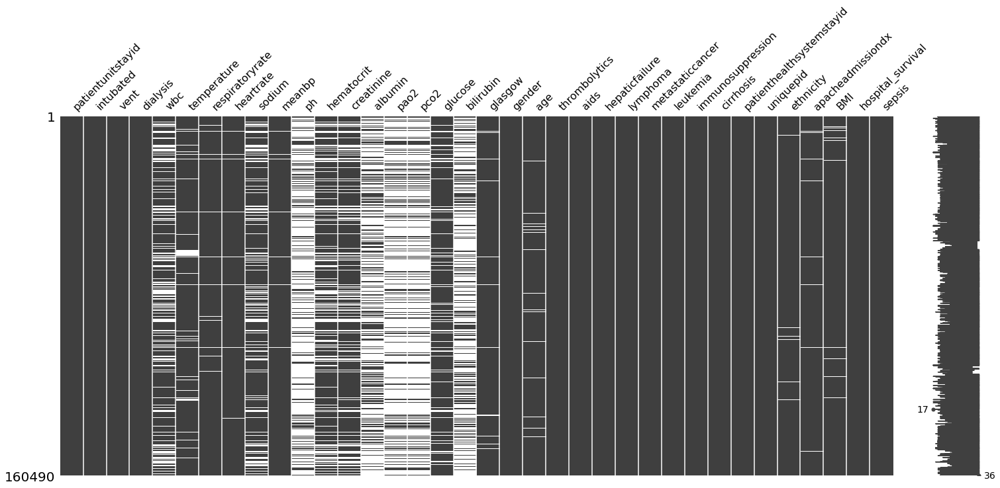

In [21]:
import missingno as msno
msno.matrix(stat_df)

In [22]:
stat_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 160490 entries, 0 to 171176
Data columns (total 36 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   patientunitstayid          160490 non-null  int64  
 1   intubated                  160490 non-null  int64  
 2   vent                       160490 non-null  int64  
 3   dialysis                   160490 non-null  int64  
 4   wbc                        119786 non-null  float64
 5   temperature                149342 non-null  float64
 6   respiratoryrate            157628 non-null  float64
 7   heartrate                  158365 non-null  float64
 8   sodium                     126605 non-null  float64
 9   meanbp                     157988 non-null  float64
 10  ph                         36169 non-null   float64
 11  hematocrit                 123059 non-null  float64
 12  creatinine                 126045 non-null  float64
 13  albumin                    62

In [23]:
stat_df.isnull().sum()

patientunitstayid                 0
intubated                         0
vent                              0
dialysis                          0
wbc                           40704
temperature                   11148
respiratoryrate                2862
heartrate                      2125
sodium                        33885
meanbp                         2502
ph                           124321
hematocrit                    37431
creatinine                    34445
albumin                       97689
pao2                         124321
pco2                         124321
glucose                       21407
bilirubin                    103468
glasgow                        4689
gender                          141
age                            5822
thrombolytics                     0
aids                              0
hepaticfailure                    0
lymphoma                          0
metastaticcancer                  0
leukemia                          0
immunosuppression           

In [24]:
len(stat_df[stat_df['BMI']<0])

0

In [25]:
stat_df['BMI'].head()

0    36.295906
1    20.575852
2    22.732803
3    38.617545
4    27.421875
Name: BMI, dtype: float64

In [26]:
stat_df['BMI']=round(stat_df['BMI'],2)

In [27]:
stat_df['BMI'].head()

0    36.30
1    20.58
2    22.73
3    38.62
4    27.42
Name: BMI, dtype: float64

In [28]:
#stat_df['BMI'].fillna((stat_df['BMI'].mean()), inplace=True)

- NaN imputation helper with Random value imputation Method

In [29]:
# lets create a function so that I can easily do it for all features
def Random_value_imputation(feature):
    random_sample=stat_df[feature].dropna().sample(stat_df[feature].isnull().sum())               
    random_sample.index=stat_df[stat_df[feature].isnull()].index
    stat_df.loc[stat_df[feature].isnull(),feature]=random_sample

In [30]:
# Imputation the concerned numerical columns
Random_value_imputation('gender')
Random_value_imputation('ethnicity')
#Random_value_imputation('BMI')
#Random_value_imputation('sodium')
#Random_value_imputation('meanbp')
#Random_value_imputation('hematocrit')
#Random_value_imputation('creatinine')
#Random_value_imputation('albumin')
#Random_value_imputation('pao2')
#Random_value_imputation('pco2')
#Random_value_imputation('glucose')
#Random_value_imputation('bilirubin')
#Random_value_imputation('glasgow')
#Random_value_imputation('ethnicity')
#Random_value_imputation('apacheadmissiondx')
#Random_value_imputation('BMI')
#Random_value_imputation('age_bins')
#Random_value_imputation('BMI_Category')

In [31]:
stat_df.isnull().sum()

patientunitstayid                 0
intubated                         0
vent                              0
dialysis                          0
wbc                           40704
temperature                   11148
respiratoryrate                2862
heartrate                      2125
sodium                        33885
meanbp                         2502
ph                           124321
hematocrit                    37431
creatinine                    34445
albumin                       97689
pao2                         124321
pco2                         124321
glucose                       21407
bilirubin                    103468
glasgow                        4689
gender                            0
age                            5822
thrombolytics                     0
aids                              0
hepaticfailure                    0
lymphoma                          0
metastaticcancer                  0
leukemia                          0
immunosuppression           

In [32]:
stat_df.describe()

,patientunitstayid,intubated,vent,dialysis,wbc,temperature,respiratoryrate,heartrate,sodium,meanbp,ph,hematocrit,creatinine,albumin,pao2,pco2,glucose,bilirubin,glasgow,gender,age,thrombolytics,aids,hepaticfailure,lymphoma,metastaticcancer,leukemia,immunosuppression,cirrhosis,patienthealthsystemstayid,BMI,hospital_survival,sepsis
count,1.604900e+05,160490.000000,160490.000000,160490.000000,119786.000000,149342.00000,157628.000000,158365.000000,126605.000000,157988.000000,36169.000000,123059.000000,126045.000000,62801.000000,36169.000000,36169.000000,139083.000000,57022.000000,155801.000000,160490.000000,154668.000000,160490.000000,160490.000000,160490.000000,160490.000000,160490.000000,160490.000000,160490.000000,160490.000000,1.604900e+05,153617.00,160490.000000,160490.000000
mean,1.752705e+06,0.146857,0.238115,0.035853,12.225443,36.42682,25.231248,100.063379,137.965263,86.818595,7.353121,32.723066,1.545262,2.877927,130.507794,42.821348,163.602111,1.193878,13.013768,0.460689,61.821178,0.016661,0.001078,0.015378,0.004362,0.020917,0.007440,0.027017,0.017939,1.394732e+06,inf,0.901078,0.128531
std,9.969118e+05,0.353964,0.425931,0.185923,8.085599,0.93045,15.005593,30.989128,5.566824,41.678051,0.102181,6.897434,1.728813,0.692667,85.328980,13.388444,102.240055,2.351357,3.416545,0.498454,16.857027,0.128000,0.032815,0.123051,0.065899,0.143108,0.085933,0.162134,0.132730,8.142933e+05,NaN,0.298558,0.334682
min,1.411680e+05,0.000000,0.000000,0.000000,0.010000,20.00000,4.000000,20.000000,91.000000,40.000000,6.531000,6.000000,0.100000,1.000000,9.000000,6.500000,1.000000,0.100000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.289190e+05,0.00,0.000000,0.000000
25%,9.611645e+05,0.000000,0.000000,0.000000,7.400000,36.20000,11.000000,87.000000,135.000000,53.000000,7.302000,27.800000,0.710000,2.400000,76.000000,34.700000,97.000000,0.400000,13.000000,0.000000,52.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7.075005e+05,23.48,1.000000,0.000000
50%,1.677328e+06,0.000000,0.000000,0.000000,10.300000,36.50000,27.000000,104.000000,138.000000,66.000000,7.360000,32.800000,0.990000,2.900000,102.000000,40.600000,135.000000,0.670000,15.000000,0.000000,64.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.307442e+06,27.50,1.000000,0.000000
75%,2.743902e+06,0.000000,0.000000,0.000000,15.200000,36.70000,36.000000,120.000000,141.000000,123.000000,7.420000,37.500000,1.600000,3.400000,153.000000,48.000000,199.000000,1.100000,15.000000,1.000000,75.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.208498e+06,32.86,1.000000,0.000000
max,3.353263e+06,1.000000,1.000000,1.000000,198.100000,42.30000,60.000000,220.000000,195.000000,200.000000,7.810000,72.700000,24.950000,7.400000,636.000000,147.300000,2357.000000,60.200000,15.000000,1.000000,89.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.743110e+06,inf,1.000000,1.000000


In [33]:
len(stat_df[stat_df['BMI']==np.inf])

29

In [34]:
len(stat_df[stat_df['BMI']==np.nan])

0

In [35]:
stat_df.shape 

(160490, 36)

In [36]:
stat_df=stat_df[stat_df['BMI']!=np.inf]

In [37]:
stat_df.shape 

(160461, 36)

In [38]:
stat_df.describe()

,patientunitstayid,intubated,vent,dialysis,wbc,temperature,respiratoryrate,heartrate,sodium,meanbp,ph,hematocrit,creatinine,albumin,pao2,pco2,glucose,bilirubin,glasgow,gender,age,thrombolytics,aids,hepaticfailure,lymphoma,metastaticcancer,leukemia,immunosuppression,cirrhosis,patienthealthsystemstayid,BMI,hospital_survival,sepsis
count,1.604610e+05,160461.000000,160461.000000,160461.000000,119764.000000,149314.000000,157600.000000,158337.000000,126582.000000,157960.000000,36167.000000,123037.000000,126022.000000,62789.000000,36167.000000,36167.000000,139058.000000,57011.000000,155773.000000,160461.000000,154639.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,1.604610e+05,1.535880e+05,160461.000000,160461.000000
mean,1.752549e+06,0.146871,0.238089,0.035853,12.225539,36.426853,25.231023,100.064217,137.964925,86.818905,7.353117,32.723042,1.545274,2.877929,130.510421,42.821394,163.598278,1.194021,13.014008,0.460673,61.821552,0.016664,0.001078,0.015381,0.004362,0.020921,0.007435,0.027022,0.017942,1.394603e+06,3.329471e+02,0.901122,0.128536
std,9.968972e+05,0.353978,0.425915,0.185924,8.084684,0.930382,15.005304,30.988369,5.566848,41.677072,0.102181,6.897245,1.728925,0.692688,85.330503,13.388738,102.235589,2.351560,3.416302,0.498453,16.856826,0.128011,0.032817,0.123062,0.065905,0.143120,0.085905,0.162148,0.132741,8.142790e+05,2.289234e+04,0.298499,0.334687
min,1.411680e+05,0.000000,0.000000,0.000000,0.010000,20.000000,4.000000,20.000000,91.000000,40.000000,6.531000,6.000000,0.100000,1.000000,9.000000,6.500000,1.000000,0.100000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.289190e+05,0.000000e+00,0.000000,0.000000
25%,9.611180e+05,0.000000,0.000000,0.000000,7.400000,36.200000,11.000000,87.000000,135.000000,53.000000,7.302000,27.800000,0.710000,2.400000,76.000000,34.700000,97.000000,0.400000,13.000000,0.000000,52.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7.074680e+05,2.348000e+01,1.000000,0.000000
50%,1.677039e+06,0.000000,0.000000,0.000000,10.300000,36.500000,27.000000,104.000000,138.000000,66.000000,7.360000,32.800000,0.990000,2.900000,102.000000,40.600000,135.000000,0.680000,15.000000,0.000000,64.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.307189e+06,2.749000e+01,1.000000,0.000000
75%,2.743835e+06,0.000000,0.000000,0.000000,15.200000,36.700000,36.000000,120.000000,141.000000,123.000000,7.420000,37.500000,1.600000,3.400000,153.000000,48.000000,199.000000,1.100000,15.000000,1.000000,75.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.208440e+06,3.286000e+01,1.000000,0.000000
max,3.353263e+06,1.000000,1.000000,1.000000,198.100000,42.300000,60.000000,220.000000,195.000000,200.000000,7.810000,72.700000,24.950000,7.400000,636.000000,147.300000,2357.000000,60.200000,15.000000,1.000000,89.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.743110e+06,8.233333e+06,1.000000,1.000000


### Imputation by MICE (Multiple Imputation by Chained Equations) Method

Doc : https://medium.com/@WalePhenomenon/missing-data-conundrum-exploration-and-imputation-techniques-9f40abe0fd87

In [39]:
from fancyimpute import IterativeImputer

In [40]:
mice_stat_features=['wbc','temperature','respiratoryrate','heartrate',
                  'sodium','meanbp','hematocrit','creatinine','albumin',
                  'pao2','pco2','glucose','bilirubin',
                   'glasgow','age']

In [41]:
stat_df[mice_stat_features].head()

,wbc,temperature,respiratoryrate,heartrate,sodium,meanbp,hematocrit,creatinine,albumin,pao2,pco2,glucose,bilirubin,glasgow,age
0,14.7,36.1,30.0,140.0,139.0,62.0,40.1,2.30,3.1,NaN,NaN,95.0,4.1,15.0,70.0
1,NaN,36.4,16.0,88.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,52.0
2,14.1,39.3,36.0,118.0,134.0,40.0,27.4,2.51,2.3,NaN,NaN,168.0,0.4,13.0,68.0
3,NaN,NaN,25.0,104.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15.0,71.0
4,12.7,35.1,33.0,120.0,145.0,46.0,36.9,0.56,NaN,51.0,37.0,145.0,NaN,5.0,77.0


In [42]:
stat_df[mice_stat_features].describe()

,wbc,temperature,respiratoryrate,heartrate,sodium,meanbp,hematocrit,creatinine,albumin,pao2,pco2,glucose,bilirubin,glasgow,age
count,119764.000000,149314.000000,157600.000000,158337.000000,126582.000000,157960.000000,123037.000000,126022.000000,62789.000000,36167.000000,36167.000000,139058.000000,57011.000000,155773.000000,154639.000000
mean,12.225539,36.426853,25.231023,100.064217,137.964925,86.818905,32.723042,1.545274,2.877929,130.510421,42.821394,163.598278,1.194021,13.014008,61.821552
std,8.084684,0.930382,15.005304,30.988369,5.566848,41.677072,6.897245,1.728925,0.692688,85.330503,13.388738,102.235589,2.351560,3.416302,16.856826
min,0.010000,20.000000,4.000000,20.000000,91.000000,40.000000,6.000000,0.100000,1.000000,9.000000,6.500000,1.000000,0.100000,3.000000,0.000000
25%,7.400000,36.200000,11.000000,87.000000,135.000000,53.000000,27.800000,0.710000,2.400000,76.000000,34.700000,97.000000,0.400000,13.000000,52.000000
50%,10.300000,36.500000,27.000000,104.000000,138.000000,66.000000,32.800000,0.990000,2.900000,102.000000,40.600000,135.000000,0.680000,15.000000,64.000000
75%,15.200000,36.700000,36.000000,120.000000,141.000000,123.000000,37.500000,1.600000,3.400000,153.000000,48.000000,199.000000,1.100000,15.000000,75.000000
max,198.100000,42.300000,60.000000,220.000000,195.000000,200.000000,72.700000,24.950000,7.400000,636.000000,147.300000,2357.000000,60.200000,15.000000,89.000000


In [43]:
mice_imputer=IterativeImputer()
stat_df[mice_stat_features]=mice_imputer.fit_transform(stat_df[mice_stat_features])

In [44]:
stat_df[mice_stat_features]

,wbc,temperature,respiratoryrate,heartrate,sodium,meanbp,hematocrit,creatinine,albumin,pao2,pco2,glucose,bilirubin,glasgow,age
0,14.700000,36.100000,30.0,140.0,139.000000,62.000000,40.100000,2.300000,3.100000,127.992443,36.324311,95.000000,4.100000,15.000000,70.0
1,11.423834,36.400000,16.0,88.0,137.830089,84.781903,33.569147,1.468372,3.020568,129.899655,43.478359,159.541685,1.122492,13.147595,52.0
2,14.100000,39.300000,36.0,118.0,134.000000,40.000000,27.400000,2.510000,2.300000,94.138836,44.434583,168.000000,0.400000,13.000000,68.0
3,11.896895,36.499647,25.0,104.0,137.627664,86.292154,32.359108,1.547997,2.871806,121.875526,44.017171,161.237565,1.003816,15.000000,71.0
4,12.700000,35.100000,33.0,120.0,145.000000,46.000000,36.900000,0.560000,2.163553,51.000000,37.000000,145.000000,2.333817,5.000000,77.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
171172,12.136570,36.200000,50.0,106.0,137.165204,120.000000,34.350645,1.584098,3.081001,116.399567,44.315656,170.727633,1.143238,15.000000,50.0
171173,9.500000,36.400000,42.0,112.0,140.000000,125.000000,39.000000,1.070000,3.500000,141.448021,47.310000,139.000000,0.700000,14.000000,79.0
171174,16.716594,32.900000,34.0,104.0,142.000000,58.000000,31.776748,2.430000,2.141526,80.000000,44.000000,346.000000,0.981825,3.000000,73.0
171175,11.620489,35.500000,31.0,83.0,137.841700,60.000000,32.000000,1.648398,2.821425,118.215239,44.870221,137.000000,1.063503,15.000000,81.0


In [45]:
Random_value_imputation('BMI')

<AxesSubplot:>

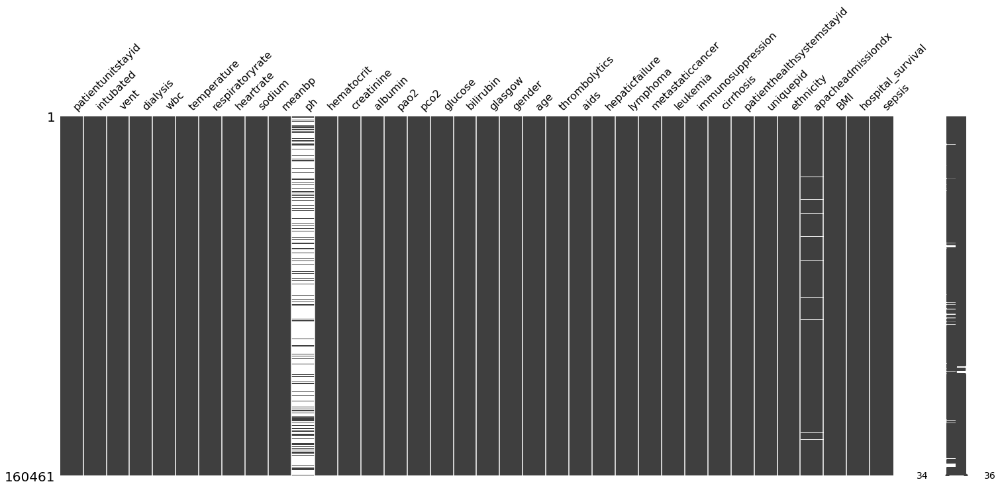

In [46]:
import missingno as msno
msno.matrix(stat_df)

In [47]:
stat_df.isnull().sum()

patientunitstayid                 0
intubated                         0
vent                              0
dialysis                          0
wbc                               0
temperature                       0
respiratoryrate                   0
heartrate                         0
sodium                            0
meanbp                            0
ph                           124294
hematocrit                        0
creatinine                        0
albumin                           0
pao2                              0
pco2                              0
glucose                           0
bilirubin                         0
glasgow                           0
gender                            0
age                               0
thrombolytics                     0
aids                              0
hepaticfailure                    0
lymphoma                          0
metastaticcancer                  0
leukemia                          0
immunosuppression           

In [48]:
stat_df = stat_df.drop('ph', 1)

###### Group by Age 

In [49]:
features = ['gender',  'age','hospital_survival','BMI','sepsis']
stat_df[features].head()

,gender,age,hospital_survival,BMI,sepsis
0,1.0,70.0,0,36.30,0
1,1.0,52.0,1,20.58,0
2,0.0,68.0,1,22.73,1
3,0.0,71.0,1,38.62,1
4,1.0,77.0,1,27.42,0


In [50]:
# Check Types
stat_df[features].dtypes

gender               float64
age                  float64
hospital_survival      uint8
BMI                  float64
sepsis                 int64
dtype: object

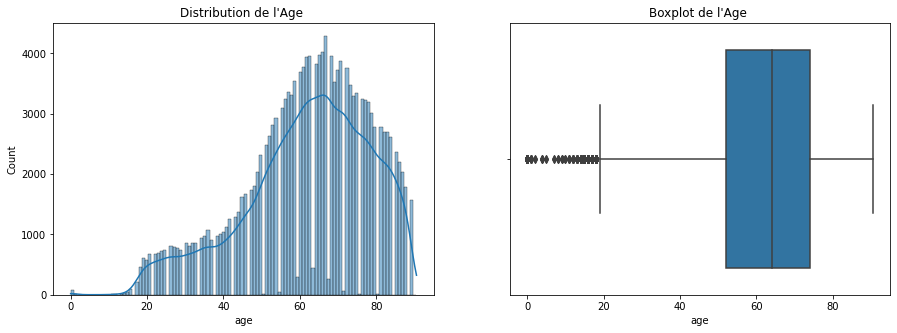

In [51]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5), sharex=True)


sns.histplot(ax=axes[0], x="age", data=stat_df, kde=True)
axes[0].set_title("Distribution de l'Age ")

sns.boxplot(ax=axes[1], x="age", data=stat_df)
axes[1].set_title("Boxplot de l'Age ")

plt.show()

#### Distribution of numeric variables 

In [52]:
import sweetviz as sv
import IPython
# Analyzing the dataset
analyze_report=sv.analyze(stat_df)
# Display the report
analyze_report.show_html('analyze_data.html', open_browser=False)

                                             |      | [  0%]   00:00 -> (? left)

Report analyze_data.html was generated.


The beauty of this library is that it gives graphs and statistical descriptions of all columns in one step


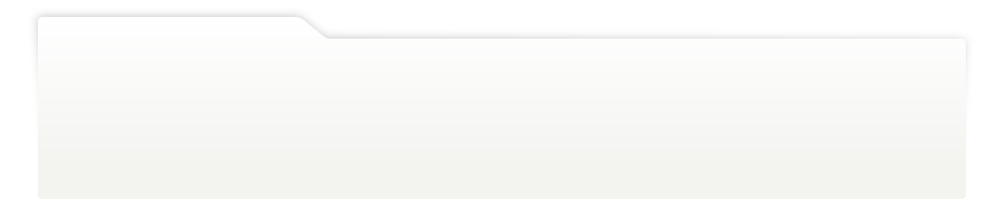
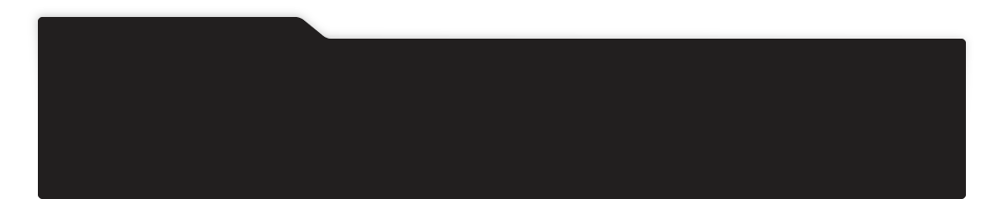
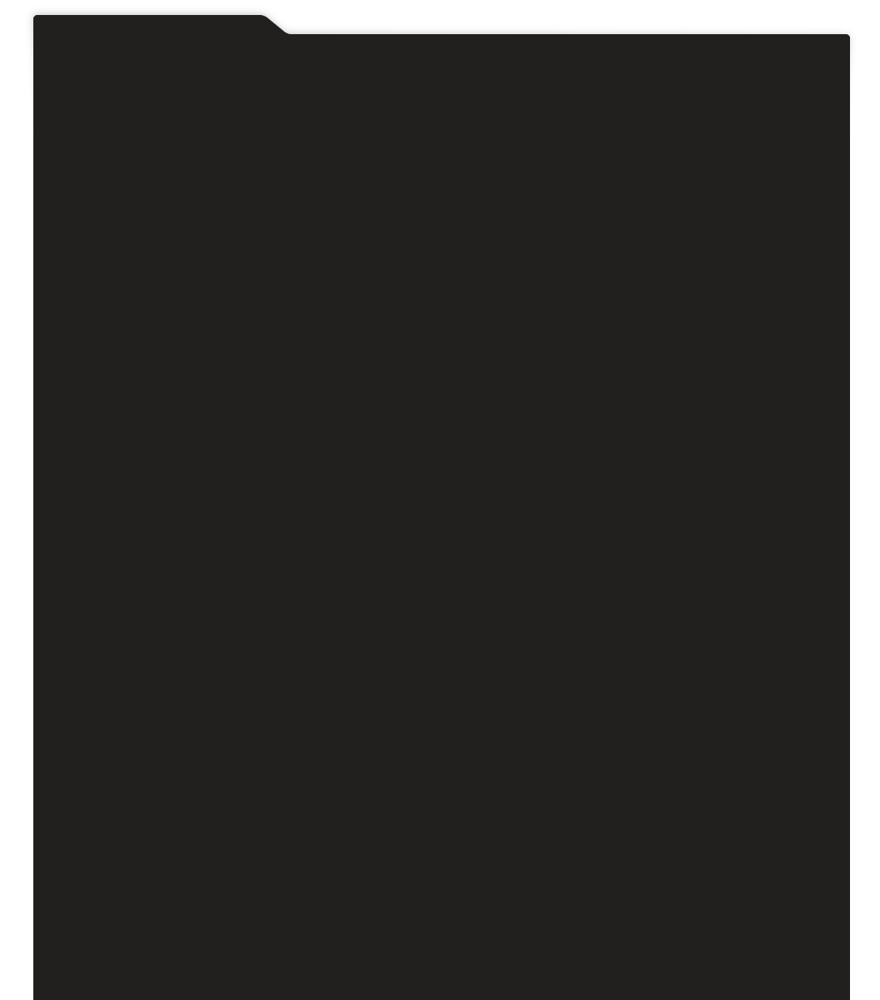
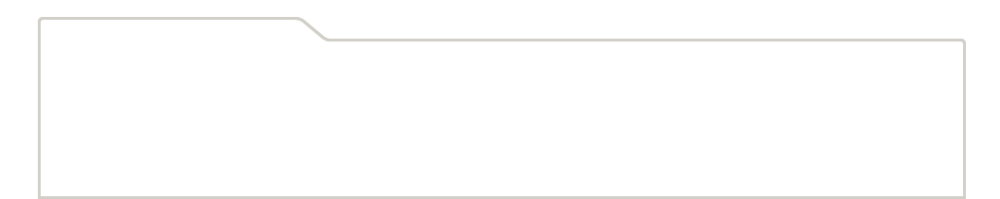
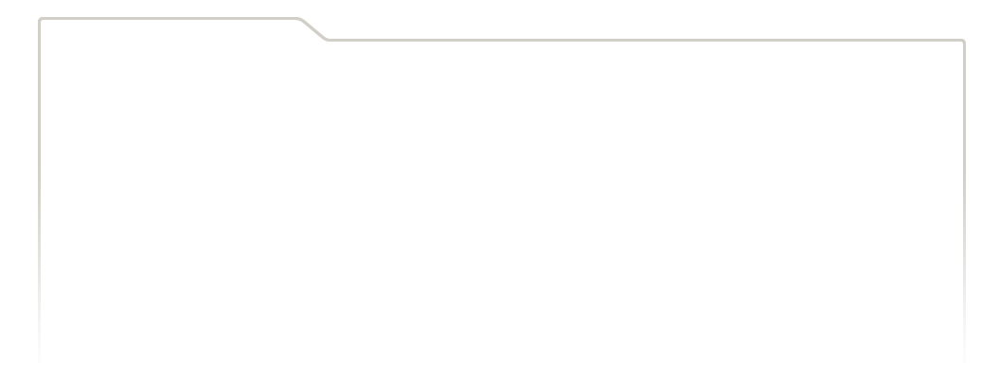
...
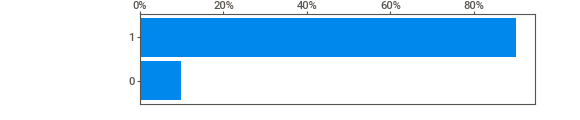
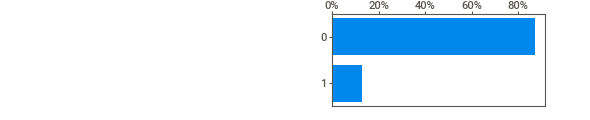
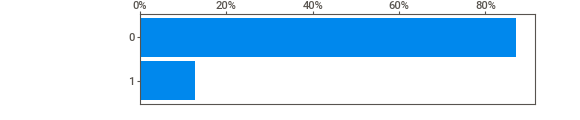
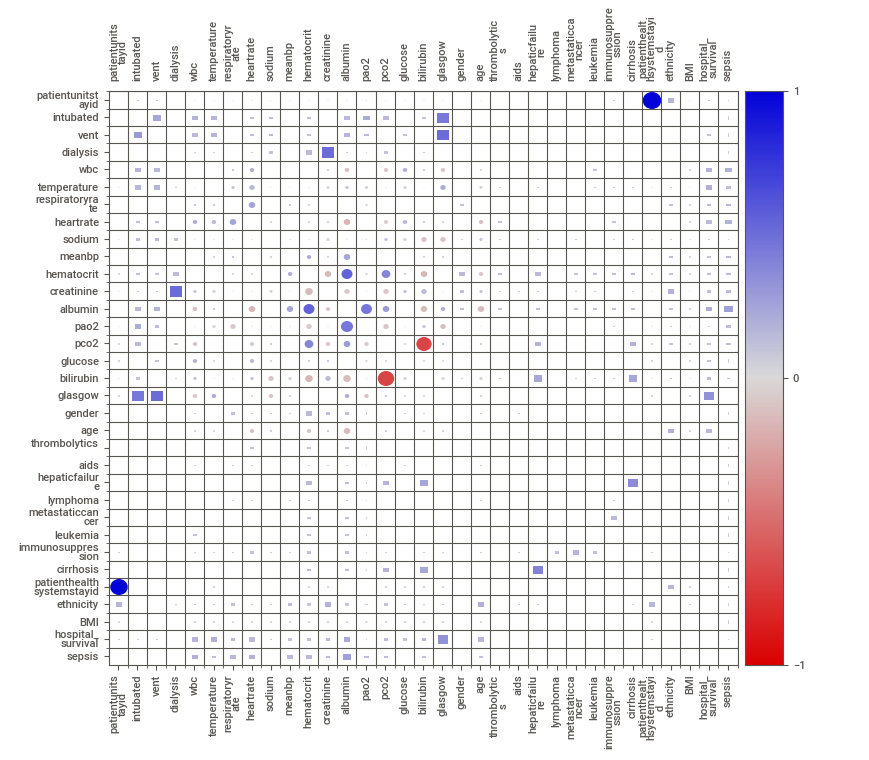
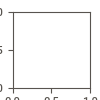

In [53]:
IPython.display.HTML('analyze_data.html')

In [54]:
stat_df[features].head()

,gender,age,hospital_survival,BMI,sepsis
0,1.0,70.0,0,36.30,0
1,1.0,52.0,1,20.58,0
2,0.0,68.0,1,22.73,1
3,0.0,71.0,1,38.62,1
4,1.0,77.0,1,27.42,0


In [55]:
stat_df['sepsis'].value_counts()

0    139836
1     20625
Name: sepsis, dtype: int64

###### Gender v/s Sepsis

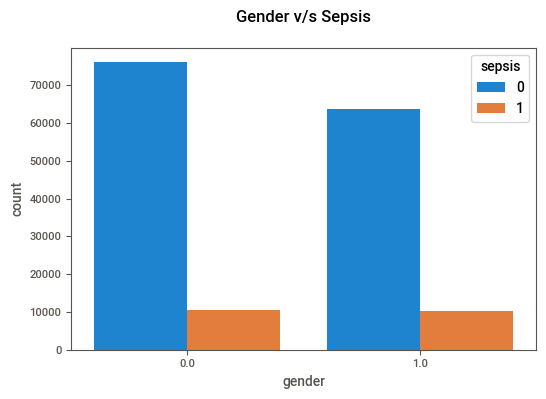

In [56]:
sns.countplot(data=stat_df, x='gender', hue='sepsis')
plt.title('Gender v/s Sepsis\n')
plt.show()

###### Ethnicity v/s Sepsis

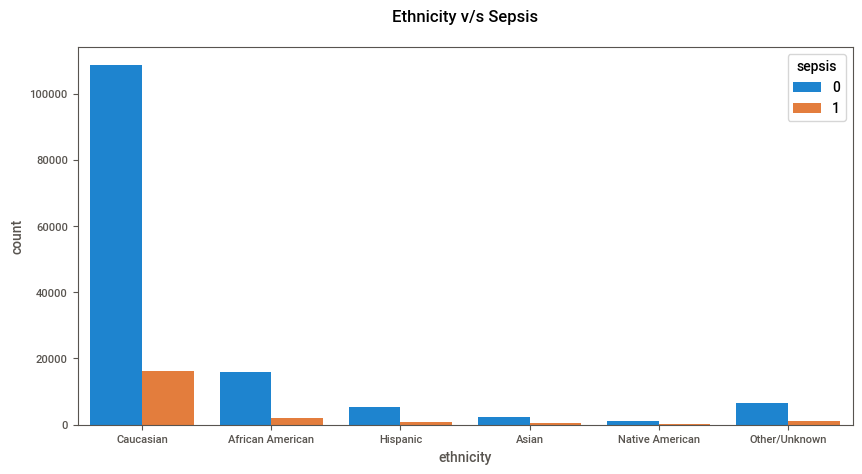

In [57]:
plt.figure(figsize=(10,5))
sns.countplot(data=stat_df, x='ethnicity', hue='sepsis')
plt.title('Ethnicity v/s Sepsis\n')
plt.show()

###### Ethnicity v/s Hospital_survival

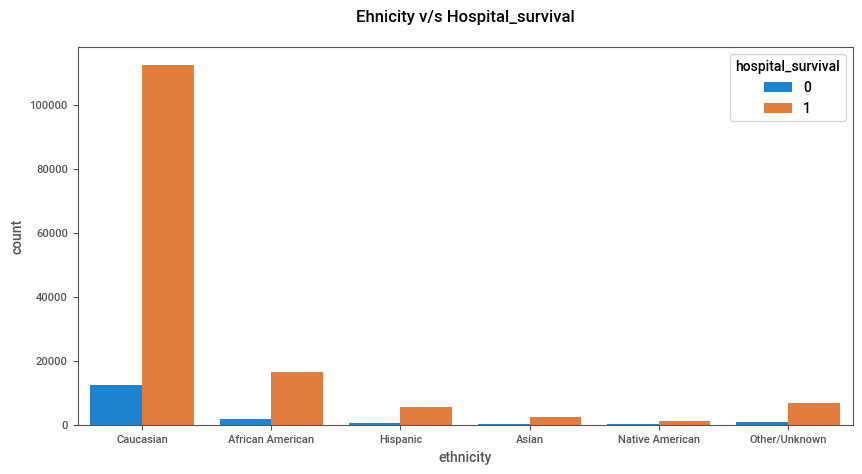

In [58]:
plt.figure(figsize=(10,5))
sns.countplot(data=stat_df, x='ethnicity', hue='hospital_survival')
plt.title('Ehnicity v/s Hospital_survival\n')
plt.show()

###### Gender v/s hospital_survival

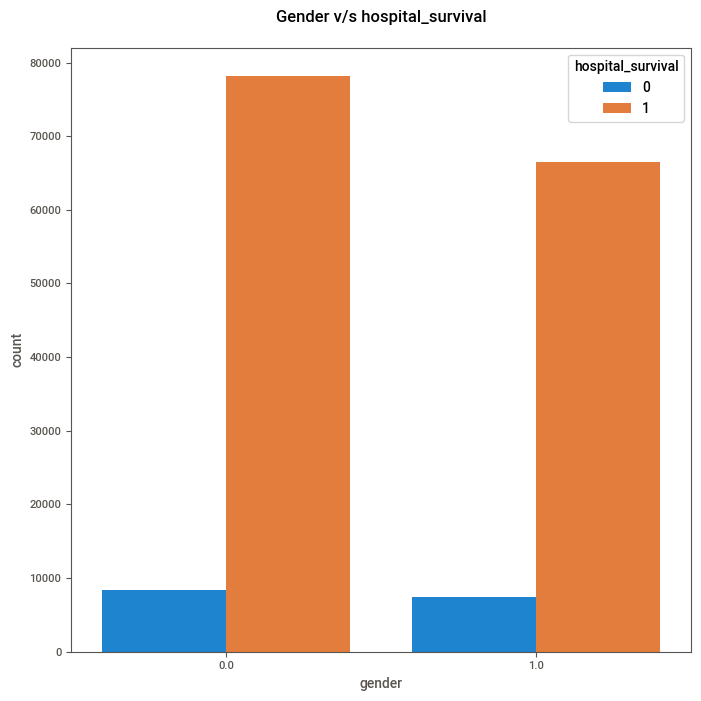

In [59]:
plt.figure(figsize=(8,8))
sns.countplot(data=stat_df, x='gender', hue='hospital_survival')
plt.title('Gender v/s hospital_survival\n')
plt.show()

In [60]:
#convert age to bins
#df = stat_df[features].replace({1:"Male", 0:"Female"})
age_bins = np.arange(0, 90, 10)
a_bin = [str(x) for x in np.arange(0, 90, 10) ]
age_labels = ["".join(x) for x in zip( [x + " - " for x in a_bin[:-1]], a_bin[1:])]
stat_df['age_bins'] = pd.cut(stat_df['age'], bins=age_bins, labels=age_labels)

###### Age Bins

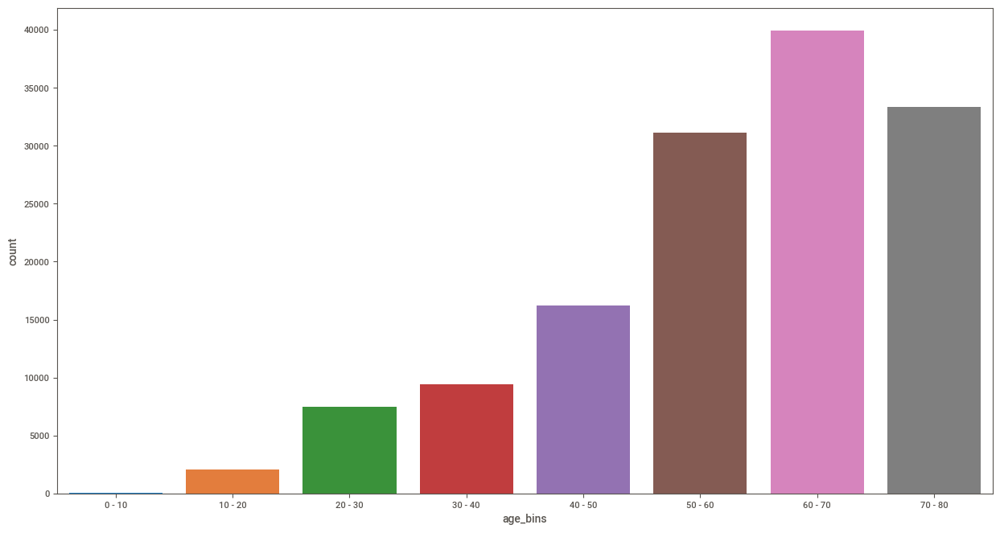

In [61]:
plt.figure(figsize=(15,8))
ax = sns.countplot(x="age_bins", data=stat_df)

###### Age bins by Gender

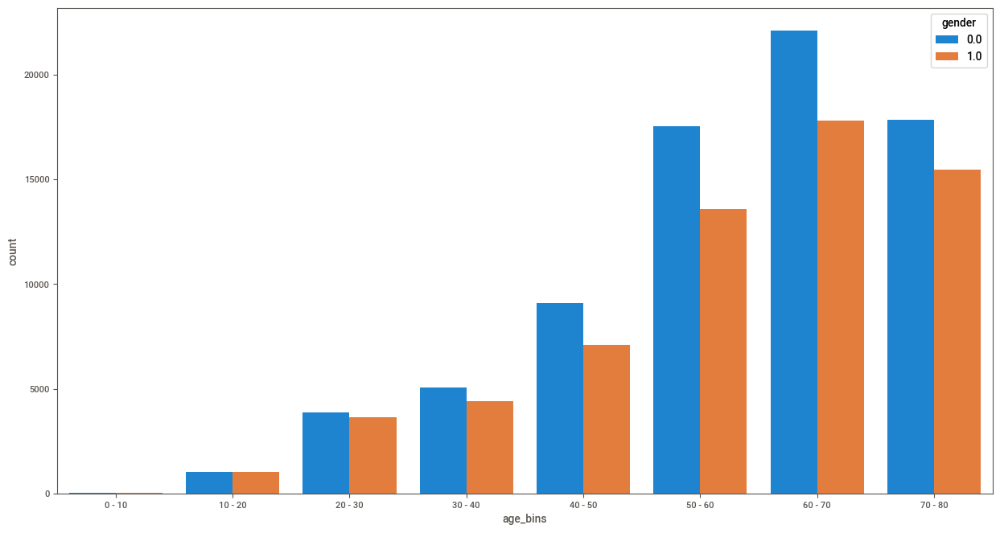

In [62]:
plt.figure(figsize=(15,8))
ax = sns.countplot(x="age_bins", hue="gender", data=stat_df)

###### Age bins by Ethnicity

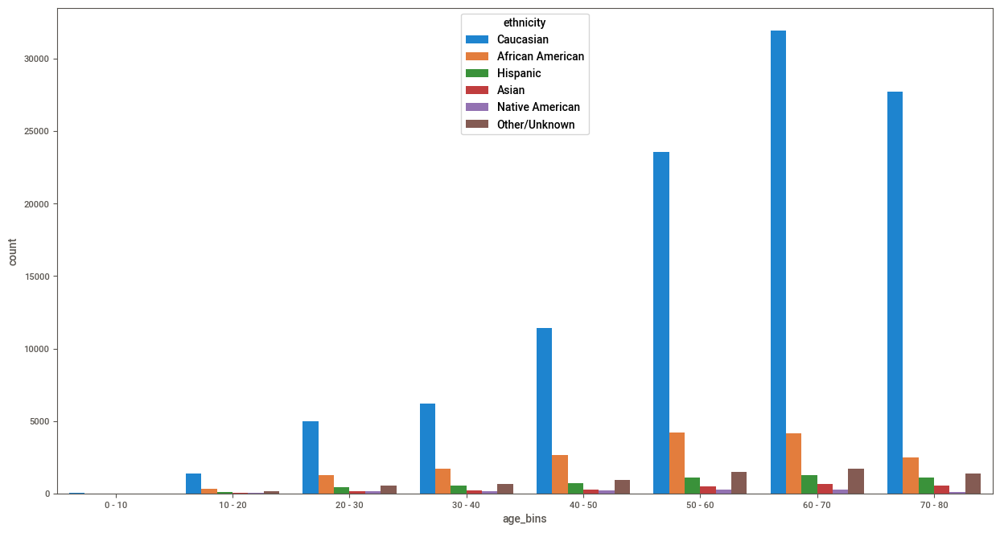

In [63]:
plt.figure(figsize=(15,8))
ax = sns.countplot(x="age_bins", hue="ethnicity", data=stat_df)

###### Age bins, Gender by sepsis

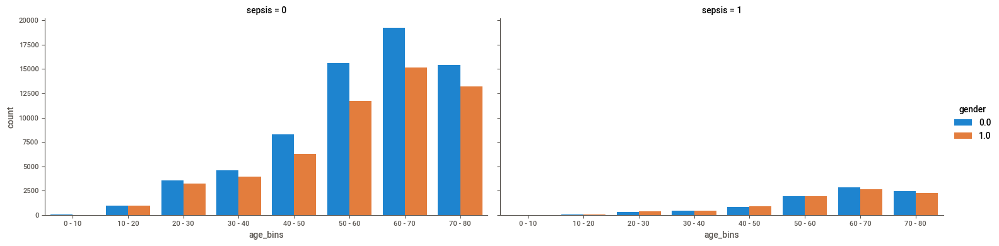

In [64]:
g = sns.catplot(x="age_bins", hue="gender", col="sepsis",
                data=stat_df, kind="count",
                height=4, aspect=1.9);

###### Age bins, Ehnicity by sepsis

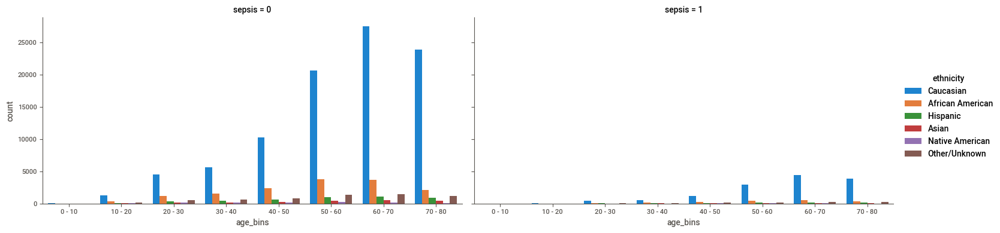

In [65]:
g = sns.catplot(x="age_bins", hue="ethnicity", col="sepsis",
                data=stat_df, kind="count",
                height=4, aspect=1.9);

###### Age bins, Gender by hospital_survival

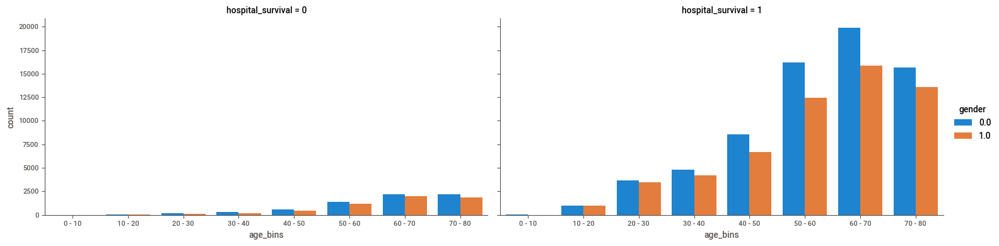

In [66]:
g = sns.catplot(x="age_bins", hue="gender", col="hospital_survival",
                data=stat_df, kind="count",
                height=4, aspect=1.9);

###### Age bins, Ethnicity by hospital_survival

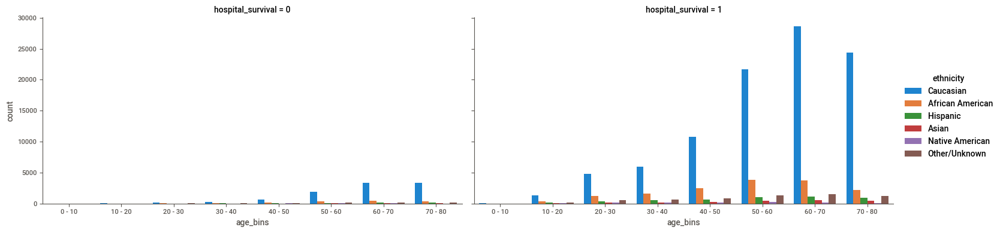

In [67]:
g = sns.catplot(x="age_bins", hue="ethnicity", col="hospital_survival",
                data=stat_df, kind="count",
                height=4, aspect=1.9);

##### BMI Category

In [68]:
stat_df[features].head()

,gender,age,hospital_survival,BMI,sepsis
0,1.0,70.0,0,36.30,0
1,1.0,52.0,1,20.58,0
2,0.0,68.0,1,22.73,1
3,0.0,71.0,1,38.62,1
4,1.0,77.0,1,27.42,0


In [69]:
# creating BMI categories and separating into 3 categories
stat_df['BMI_Category'] = pd.qcut(stat_df['BMI'], q=3, precision = 0)
stat_df.sample()

,patientunitstayid,intubated,vent,dialysis,wbc,temperature,respiratoryrate,heartrate,sodium,meanbp,hematocrit,creatinine,albumin,pao2,pco2,glucose,bilirubin,glasgow,gender,age,thrombolytics,aids,hepaticfailure,lymphoma,metastaticcancer,leukemia,immunosuppression,cirrhosis,patienthealthsystemstayid,uniquepid,ethnicity,apacheadmissiondx,BMI,hospital_survival,sepsis,age_bins,BMI_Category
43908,964349,0,0,0,12.258776,37.1,41.0,124.0,138.131367,67.0,30.865994,1.504237,2.668461,114.806242,44.45737,67.0,1.15572,15.0,0.0,84.0,0,0,0,0,0,0,0,0,710069,007-16255,Caucasian,"Sepsis, other",23.96,1,1,NaN,"(-1.0, 25.0]"


In [70]:
# selecting the cut ranges for consistency with the R video
cat_bins =[0.0, 30.0, 35.0, 40.0]
stat_df['BMI_Category'] = pd.cut(stat_df['BMI'], bins=cat_bins)
stat_df.head()

,patientunitstayid,intubated,vent,dialysis,wbc,temperature,respiratoryrate,heartrate,sodium,meanbp,hematocrit,creatinine,albumin,pao2,pco2,glucose,bilirubin,glasgow,gender,age,thrombolytics,aids,hepaticfailure,lymphoma,metastaticcancer,leukemia,immunosuppression,cirrhosis,patienthealthsystemstayid,uniquepid,ethnicity,apacheadmissiondx,BMI,hospital_survival,sepsis,age_bins,BMI_Category
0,141168,0,0,0,14.700000,36.100000,30.0,140.0,139.000000,62.000000,40.100000,2.300000,3.100000,127.992443,36.324311,95.000000,4.100000,15.000000,1.0,70.0,0,0,0,0,0,0,0,0,128919,002-34851,Caucasian,"Rhythm disturbance (atrial, supraventricular)",36.30,0,0,60 - 70,"(35.0, 40.0]"
1,141178,0,0,0,11.423834,36.400000,16.0,88.0,137.830089,84.781903,33.569147,1.468372,3.020568,129.899655,43.478359,159.541685,1.122492,13.147595,1.0,52.0,0,0,0,0,0,0,0,0,128927,002-33870,Caucasian,NaN,20.58,1,0,50 - 60,"(0.0, 30.0]"
2,141194,0,0,0,14.100000,39.300000,36.0,118.0,134.000000,40.000000,27.400000,2.510000,2.300000,94.138836,44.434583,168.000000,0.400000,13.000000,0.0,68.0,0,0,0,0,0,0,0,0,128941,002-5276,Caucasian,"Sepsis, renal/UTI (including bladder)",22.73,1,1,60 - 70,"(0.0, 30.0]"
3,141197,0,0,0,11.896895,36.499647,25.0,104.0,137.627664,86.292154,32.359108,1.547997,2.871806,121.875526,44.017171,161.237565,1.003816,15.000000,0.0,71.0,0,0,0,0,0,0,0,0,128943,002-37665,Caucasian,"Sepsis, pulmonary",38.62,1,1,70 - 80,"(35.0, 40.0]"
4,141203,0,1,0,12.700000,35.100000,33.0,120.0,145.000000,46.000000,36.900000,0.560000,2.163553,51.000000,37.000000,145.000000,2.333817,5.000000,1.0,77.0,0,0,0,0,0,0,0,0,128948,002-23234,Caucasian,"Arrest, respiratory (without cardiac arrest)",27.42,1,0,70 - 80,"(0.0, 30.0]"


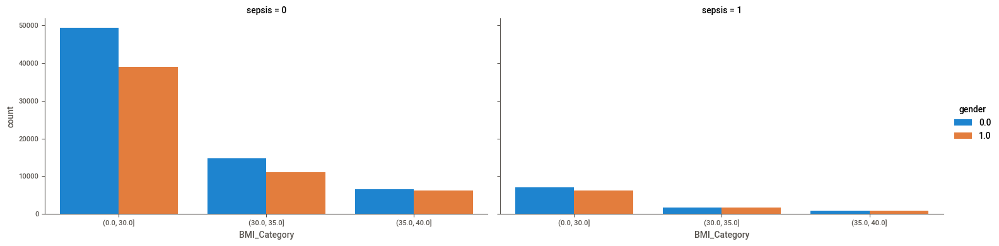

In [71]:
g = sns.catplot(x="BMI_Category", hue="gender", col="sepsis",
                data=stat_df, kind="count",
                height=4, aspect=1.9);

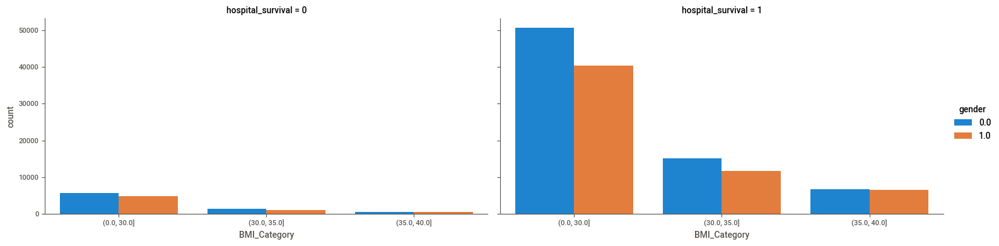

In [72]:
g = sns.catplot(x="BMI_Category", hue="gender", col="hospital_survival",
                data=stat_df, kind="count",
                height=4, aspect=1.9);

# A- Statistical analysis

In [73]:
stat_df.head()

,patientunitstayid,intubated,vent,dialysis,wbc,temperature,respiratoryrate,heartrate,sodium,meanbp,hematocrit,creatinine,albumin,pao2,pco2,glucose,bilirubin,glasgow,gender,age,thrombolytics,aids,hepaticfailure,lymphoma,metastaticcancer,leukemia,immunosuppression,cirrhosis,patienthealthsystemstayid,uniquepid,ethnicity,apacheadmissiondx,BMI,hospital_survival,sepsis,age_bins,BMI_Category
0,141168,0,0,0,14.700000,36.100000,30.0,140.0,139.000000,62.000000,40.100000,2.300000,3.100000,127.992443,36.324311,95.000000,4.100000,15.000000,1.0,70.0,0,0,0,0,0,0,0,0,128919,002-34851,Caucasian,"Rhythm disturbance (atrial, supraventricular)",36.30,0,0,60 - 70,"(35.0, 40.0]"
1,141178,0,0,0,11.423834,36.400000,16.0,88.0,137.830089,84.781903,33.569147,1.468372,3.020568,129.899655,43.478359,159.541685,1.122492,13.147595,1.0,52.0,0,0,0,0,0,0,0,0,128927,002-33870,Caucasian,NaN,20.58,1,0,50 - 60,"(0.0, 30.0]"
2,141194,0,0,0,14.100000,39.300000,36.0,118.0,134.000000,40.000000,27.400000,2.510000,2.300000,94.138836,44.434583,168.000000,0.400000,13.000000,0.0,68.0,0,0,0,0,0,0,0,0,128941,002-5276,Caucasian,"Sepsis, renal/UTI (including bladder)",22.73,1,1,60 - 70,"(0.0, 30.0]"
3,141197,0,0,0,11.896895,36.499647,25.0,104.0,137.627664,86.292154,32.359108,1.547997,2.871806,121.875526,44.017171,161.237565,1.003816,15.000000,0.0,71.0,0,0,0,0,0,0,0,0,128943,002-37665,Caucasian,"Sepsis, pulmonary",38.62,1,1,70 - 80,"(35.0, 40.0]"
4,141203,0,1,0,12.700000,35.100000,33.0,120.0,145.000000,46.000000,36.900000,0.560000,2.163553,51.000000,37.000000,145.000000,2.333817,5.000000,1.0,77.0,0,0,0,0,0,0,0,0,128948,002-23234,Caucasian,"Arrest, respiratory (without cardiac arrest)",27.42,1,0,70 - 80,"(0.0, 30.0]"


In [74]:
stat_df.columns

Index(['patientunitstayid', 'intubated', 'vent', 'dialysis', 'wbc',
       'temperature', 'respiratoryrate', 'heartrate', 'sodium', 'meanbp',
       'hematocrit', 'creatinine', 'albumin', 'pao2', 'pco2', 'glucose',
       'bilirubin', 'glasgow', 'gender', 'age', 'thrombolytics', 'aids',
       'hepaticfailure', 'lymphoma', 'metastaticcancer', 'leukemia',
       'immunosuppression', 'cirrhosis', 'patienthealthsystemstayid',
       'uniquepid', 'ethnicity', 'apacheadmissiondx', 'BMI',
       'hospital_survival', 'sepsis', 'age_bins', 'BMI_Category'],
      dtype='object')

In [75]:
stat_features=['intubated','vent','dialysis','wbc','temperature','respiratoryrate',
              'heartrate','sodium','meanbp','bilirubin','glasgow','gender','age','thrombolytics',
              'aids','hepaticfailure','lymphoma','metastaticcancer','leukemia','immunosuppression',
              'cirrhosis','BMI','hospital_survival','sepsis']

In [76]:
stat_df[stat_features].head()

,intubated,vent,dialysis,wbc,temperature,respiratoryrate,heartrate,sodium,meanbp,bilirubin,glasgow,gender,age,thrombolytics,aids,hepaticfailure,lymphoma,metastaticcancer,leukemia,immunosuppression,cirrhosis,BMI,hospital_survival,sepsis
0,0,0,0,14.700000,36.100000,30.0,140.0,139.000000,62.000000,4.100000,15.000000,1.0,70.0,0,0,0,0,0,0,0,0,36.30,0,0
1,0,0,0,11.423834,36.400000,16.0,88.0,137.830089,84.781903,1.122492,13.147595,1.0,52.0,0,0,0,0,0,0,0,0,20.58,1,0
2,0,0,0,14.100000,39.300000,36.0,118.0,134.000000,40.000000,0.400000,13.000000,0.0,68.0,0,0,0,0,0,0,0,0,22.73,1,1
3,0,0,0,11.896895,36.499647,25.0,104.0,137.627664,86.292154,1.003816,15.000000,0.0,71.0,0,0,0,0,0,0,0,0,38.62,1,1
4,0,1,0,12.700000,35.100000,33.0,120.0,145.000000,46.000000,2.333817,5.000000,1.0,77.0,0,0,0,0,0,0,0,0,27.42,1,0


In [77]:
stat_df[stat_features].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 160461 entries, 0 to 171176
Data columns (total 24 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   intubated          160461 non-null  int64  
 1   vent               160461 non-null  int64  
 2   dialysis           160461 non-null  int64  
 3   wbc                160461 non-null  float64
 4   temperature        160461 non-null  float64
 5   respiratoryrate    160461 non-null  float64
 6   heartrate          160461 non-null  float64
 7   sodium             160461 non-null  float64
 8   meanbp             160461 non-null  float64
 9   bilirubin          160461 non-null  float64
 10  glasgow            160461 non-null  float64
 11  gender             160461 non-null  float64
 12  age                160461 non-null  float64
 13  thrombolytics      160461 non-null  int64  
 14  aids               160461 non-null  int64  
 15  hepaticfailure     160461 non-null  int64  
 16  ly

###### Correlation between numerical variables

In [78]:
stat_df['BMI']

0         36.30
1         20.58
2         22.73
3         38.62
4         27.42
          ...  
171172    29.29
171173    29.65
171174    32.27
171175    24.41
171176    30.13
Name: BMI, Length: 160461, dtype: float64

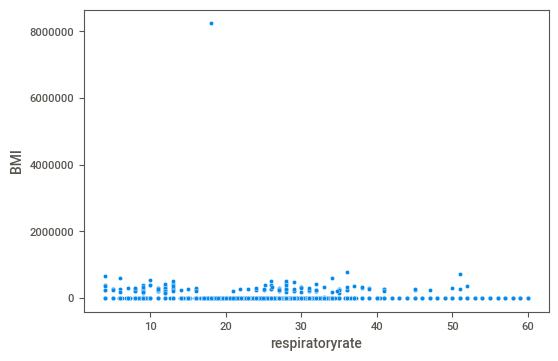

In [79]:
# heartrate vs BMI
sns.scatterplot(stat_df['respiratoryrate'], round(stat_df['BMI'],2))
plt.show()

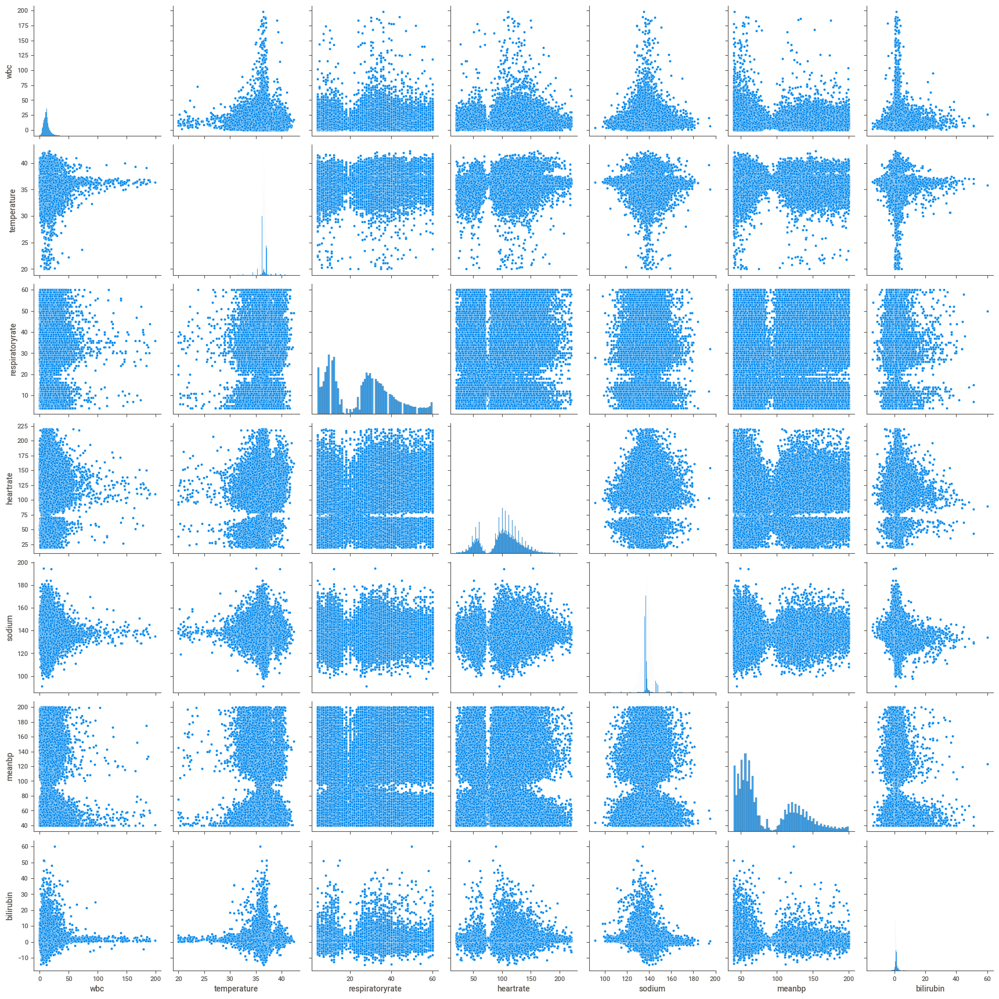

In [80]:
check_correlation=['wbc','temperature','respiratoryrate','heartrate','sodium','meanbp','bilirubin'] # ,'BMI'
sns.pairplot(stat_df[check_correlation])
plt.show()

,wbc,temperature,respiratoryrate,heartrate,sodium,meanbp,bilirubin,BMI
wbc,1.000000,-0.029845,0.074907,0.162891,-0.019297,-0.034382,0.067228,0.000093
temperature,-0.029845,1.000000,0.047875,0.104487,-0.029847,-0.007640,-0.041492,0.000204
respiratoryrate,0.074907,0.047875,1.000000,0.206591,-0.018515,0.097444,0.024438,-0.003088
heartrate,0.162891,0.104487,0.206591,1.000000,-0.001100,0.034529,0.071060,0.000493
sodium,-0.019297,-0.029847,-0.018515,-0.001100,1.000000,0.009298,-0.132913,0.000681
meanbp,-0.034382,-0.007640,0.097444,0.034529,0.009298,1.000000,-0.086111,-0.002979
bilirubin,0.067228,-0.041492,0.024438,0.071060,-0.132913,-0.086111,1.000000,0.000061
BMI,0.000093,0.000204,-0.003088,0.000493,0.000681,-0.002979,0.000061,1.000000


<AxesSubplot:>

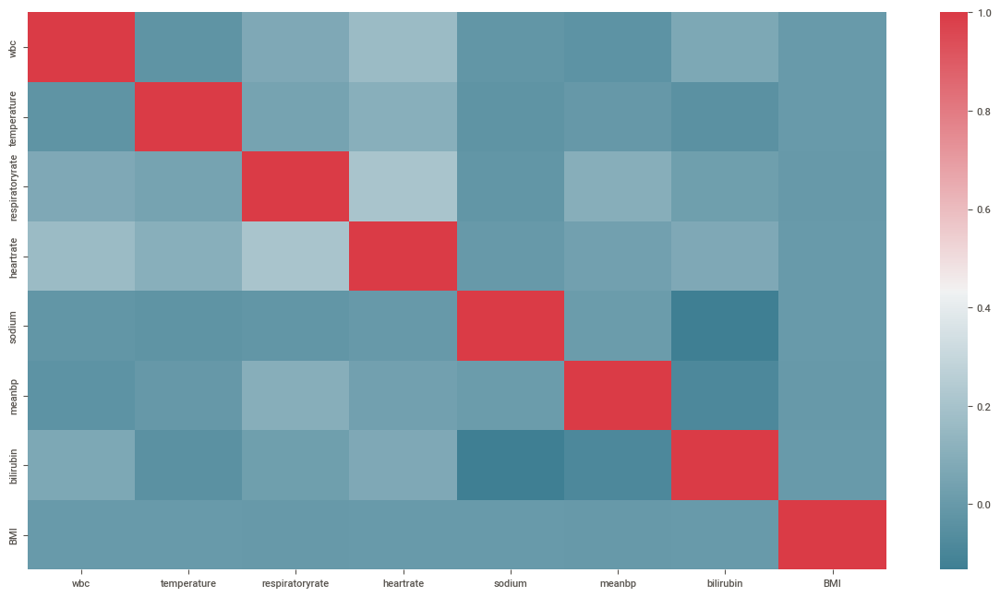

In [81]:
# Calculate the Pearson Correlation Coefficient between all features
feature_bmi=['wbc','temperature','respiratoryrate','heartrate','sodium','meanbp','bilirubin','BMI']
corr_df = stat_df[feature_bmi].corr(method="pearson") 
display(corr_df)
plt.figure(figsize=(15,8))
sns.heatmap(corr_df, cmap=sns.diverging_palette(220, 10, as_cmap=True),
            xticklabels=corr_df.columns.values,
            yticklabels=corr_df.columns.values)

In [82]:
#Corrlelations with Multivariate Features using a simple Linear Regression model
#['wbc','temperature','respiratoryrate','heartrate','sodium','meanbp','bilirubin','BMI']
#stat_df

### Is there a relationship between different Age ranges and experiencing sepsis (Probability) ?

In [83]:
stat_df.head()

,patientunitstayid,intubated,vent,dialysis,wbc,temperature,respiratoryrate,heartrate,sodium,meanbp,hematocrit,creatinine,albumin,pao2,pco2,glucose,bilirubin,glasgow,gender,age,thrombolytics,aids,hepaticfailure,lymphoma,metastaticcancer,leukemia,immunosuppression,cirrhosis,patienthealthsystemstayid,uniquepid,ethnicity,apacheadmissiondx,BMI,hospital_survival,sepsis,age_bins,BMI_Category
0,141168,0,0,0,14.700000,36.100000,30.0,140.0,139.000000,62.000000,40.100000,2.300000,3.100000,127.992443,36.324311,95.000000,4.100000,15.000000,1.0,70.0,0,0,0,0,0,0,0,0,128919,002-34851,Caucasian,"Rhythm disturbance (atrial, supraventricular)",36.30,0,0,60 - 70,"(35.0, 40.0]"
1,141178,0,0,0,11.423834,36.400000,16.0,88.0,137.830089,84.781903,33.569147,1.468372,3.020568,129.899655,43.478359,159.541685,1.122492,13.147595,1.0,52.0,0,0,0,0,0,0,0,0,128927,002-33870,Caucasian,NaN,20.58,1,0,50 - 60,"(0.0, 30.0]"
2,141194,0,0,0,14.100000,39.300000,36.0,118.0,134.000000,40.000000,27.400000,2.510000,2.300000,94.138836,44.434583,168.000000,0.400000,13.000000,0.0,68.0,0,0,0,0,0,0,0,0,128941,002-5276,Caucasian,"Sepsis, renal/UTI (including bladder)",22.73,1,1,60 - 70,"(0.0, 30.0]"
3,141197,0,0,0,11.896895,36.499647,25.0,104.0,137.627664,86.292154,32.359108,1.547997,2.871806,121.875526,44.017171,161.237565,1.003816,15.000000,0.0,71.0,0,0,0,0,0,0,0,0,128943,002-37665,Caucasian,"Sepsis, pulmonary",38.62,1,1,70 - 80,"(35.0, 40.0]"
4,141203,0,1,0,12.700000,35.100000,33.0,120.0,145.000000,46.000000,36.900000,0.560000,2.163553,51.000000,37.000000,145.000000,2.333817,5.000000,1.0,77.0,0,0,0,0,0,0,0,0,128948,002-23234,Caucasian,"Arrest, respiratory (without cardiac arrest)",27.42,1,0,70 - 80,"(0.0, 30.0]"


- Create Age categories using conditional logic with dataframe columns

In [84]:
#cat_bins =[0.0, 45.0, 55.0, 65.0, 100]
df1 = stat_df[(stat_df['age'] >= 0) & (stat_df['age'] < 45)]
df1.head()

,patientunitstayid,intubated,vent,dialysis,wbc,temperature,respiratoryrate,heartrate,sodium,meanbp,hematocrit,creatinine,albumin,pao2,pco2,glucose,bilirubin,glasgow,gender,age,thrombolytics,aids,hepaticfailure,lymphoma,metastaticcancer,leukemia,immunosuppression,cirrhosis,patienthealthsystemstayid,uniquepid,ethnicity,apacheadmissiondx,BMI,hospital_survival,sepsis,age_bins,BMI_Category
5,141208,0,0,0,11.977531,36.7,37.0,102.0,137.032399,68.0,34.557519,1.405007,3.124573,121.142944,43.202739,165.655424,1.445629,14.000000,1.0,25.0,0,0,0,0,0,0,0,0,128952,002-34521,Caucasian,"Overdose, sedatives, hypnotics, antipsychotics...",31.95,1,0,20 - 30,"(30.0, 35.0]"
10,141260,0,0,0,6.000000,36.6,18.0,92.0,136.000000,74.0,40.800000,1.040000,3.403112,116.361472,46.987827,289.000000,0.605420,15.000000,1.0,43.0,0,0,0,0,0,0,0,0,128995,002-55885,African American,Asthma,23.44,1,0,40 - 50,"(0.0, 30.0]"
11,141264,0,0,0,9.806795,36.7,16.0,60.0,137.238852,103.0,36.585231,1.295270,3.419409,129.577144,43.880549,152.195597,1.184236,13.735469,0.0,19.0,0,0,0,0,0,0,0,0,128998,002-47110,Caucasian,Head only trauma,32.33,1,0,10 - 20,"(30.0, 35.0]"
32,141415,0,0,0,6.000000,36.6,50.0,91.0,140.000000,69.0,37.400000,0.810000,3.301269,111.471611,46.689903,88.000000,1.136900,15.000000,0.0,30.0,0,0,0,0,0,0,0,0,129126,002-42357,Caucasian,"Thrombosis, vascular (deep vein)",23.38,1,0,20 - 30,"(0.0, 30.0]"
36,141451,1,1,0,14.600000,36.4,9.0,176.0,137.520107,44.0,28.900000,1.320447,2.792961,161.000000,50.000000,199.000000,0.078342,15.000000,0.0,39.0,0,0,0,0,0,0,0,0,129157,002-65302,Caucasian,Pulmonary valve surgery,37.01,1,0,30 - 40,"(35.0, 40.0]"


In [85]:
df2 = stat_df[(stat_df['age'] >= 45) & (stat_df['age'] < 55)]
df2.head()

,patientunitstayid,intubated,vent,dialysis,wbc,temperature,respiratoryrate,heartrate,sodium,meanbp,hematocrit,creatinine,albumin,pao2,pco2,glucose,bilirubin,glasgow,gender,age,thrombolytics,aids,hepaticfailure,lymphoma,metastaticcancer,leukemia,immunosuppression,cirrhosis,patienthealthsystemstayid,uniquepid,ethnicity,apacheadmissiondx,BMI,hospital_survival,sepsis,age_bins,BMI_Category
1,141178,0,0,0,11.423834,36.4,16.0,88.0,137.830089,84.781903,33.569147,1.468372,3.020568,129.899655,43.478359,159.541685,1.122492,13.147595,1.0,52.0,0,0,0,0,0,0,0,0,128927,002-33870,Caucasian,NaN,20.58,1,0,50 - 60,"(0.0, 30.0]"
21,141313,0,1,0,24.700000,36.9,14.0,82.0,142.000000,66.000000,37.900000,1.160000,2.700000,92.000000,60.000000,380.000000,0.200000,15.000000,0.0,45.0,0,0,0,0,0,0,0,0,129039,002-70742,Caucasian,"Aneurysm, dissecting aortic",33.50,0,0,40 - 50,"(30.0, 35.0]"
24,141329,0,0,0,8.400000,36.3,46.0,94.0,139.000000,58.000000,37.200000,0.830000,3.600000,140.582549,48.878813,134.000000,0.400000,15.000000,0.0,50.0,0,0,0,0,0,0,0,0,129051,002-52547,Caucasian,"Infarction, acute myocardial (MI)",25.71,1,0,40 - 50,"(0.0, 30.0]"
27,141360,0,0,0,10.797225,36.6,28.0,106.0,137.671543,140.000000,34.829942,1.380525,3.151334,126.224548,44.255541,98.000000,1.080065,15.000000,0.0,48.0,0,0,0,0,0,0,0,0,129080,002-34250,Caucasian,"CVA, cerebrovascular accident/stroke",24.47,1,0,40 - 50,"(0.0, 30.0]"
34,141436,1,1,0,9.700000,36.4,34.0,114.0,132.000000,113.000000,44.200000,1.000000,3.404872,141.000000,47.000000,143.000000,1.037198,6.000000,0.0,46.0,0,0,0,0,0,0,0,0,129143,002-75273,Hispanic,"Arrest, respiratory (without cardiac arrest)",25.85,1,0,40 - 50,"(0.0, 30.0]"


In [86]:
df3 = stat_df[(stat_df['age'] >= 55) & (stat_df['age'] < 65)]
df3.head()

,patientunitstayid,intubated,vent,dialysis,wbc,temperature,respiratoryrate,heartrate,sodium,meanbp,hematocrit,creatinine,albumin,pao2,pco2,glucose,bilirubin,glasgow,gender,age,thrombolytics,aids,hepaticfailure,lymphoma,metastaticcancer,leukemia,immunosuppression,cirrhosis,patienthealthsystemstayid,uniquepid,ethnicity,apacheadmissiondx,BMI,hospital_survival,sepsis,age_bins,BMI_Category
9,141244,0,0,0,4.1,37.2,10.0,114.0,142.0,62.0,31.0,0.65,2.871733,127.723295,44.303403,121.0,0.898040,15.0,0.0,59.0,0,0,0,0,0,0,0,0,128982,002-23372,Caucasian,"Graft, femoral-popliteal bypass",28.39,1,0,50 - 60,"(0.0, 30.0]"
14,141276,1,0,0,5.9,35.0,53.0,133.0,135.0,138.0,33.5,0.78,4.461704,370.000000,43.000000,197.0,1.046717,15.0,1.0,59.0,0,0,0,0,0,0,0,0,129009,002-9090,Caucasian,"Arrest, respiratory (without cardiac arrest)",57.45,1,0,50 - 60,NaN
15,141284,0,0,0,11.4,36.3,31.0,106.0,136.0,61.0,27.1,1.14,3.000000,147.767558,43.367458,142.0,1.000000,15.0,0.0,63.0,0,0,0,0,0,0,0,0,129017,002-72371,Caucasian,Anemia,28.83,1,0,60 - 70,"(0.0, 30.0]"
16,141288,0,0,0,16.3,36.6,46.0,105.0,140.0,64.0,35.4,0.73,2.749641,81.000000,43.000000,86.0,1.527548,15.0,1.0,61.0,0,0,0,0,0,0,0,0,129020,002-67735,Caucasian,"Sepsis, pulmonary",23.20,1,1,60 - 70,"(0.0, 30.0]"
18,141296,0,0,1,13.2,36.7,59.0,136.0,137.0,125.0,29.0,4.33,1.900000,54.000000,32.000000,101.0,0.500000,15.0,0.0,63.0,0,0,0,0,0,0,1,0,129026,002-30269,Caucasian,"Hypovolemia (including dehydration, Do not inc...",28.60,0,0,60 - 70,"(0.0, 30.0]"


In [87]:
df4 = stat_df[(stat_df['age'] >= 65) & (stat_df['age'] <= 100)]
df4.head()

,patientunitstayid,intubated,vent,dialysis,wbc,temperature,respiratoryrate,heartrate,sodium,meanbp,hematocrit,creatinine,albumin,pao2,pco2,glucose,bilirubin,glasgow,gender,age,thrombolytics,aids,hepaticfailure,lymphoma,metastaticcancer,leukemia,immunosuppression,cirrhosis,patienthealthsystemstayid,uniquepid,ethnicity,apacheadmissiondx,BMI,hospital_survival,sepsis,age_bins,BMI_Category
0,141168,0,0,0,14.700000,36.100000,30.0,140.0,139.000000,62.000000,40.100000,2.300000,3.100000,127.992443,36.324311,95.000000,4.100000,15.0,1.0,70.0,0,0,0,0,0,0,0,0,128919,002-34851,Caucasian,"Rhythm disturbance (atrial, supraventricular)",36.30,0,0,60 - 70,"(35.0, 40.0]"
2,141194,0,0,0,14.100000,39.300000,36.0,118.0,134.000000,40.000000,27.400000,2.510000,2.300000,94.138836,44.434583,168.000000,0.400000,13.0,0.0,68.0,0,0,0,0,0,0,0,0,128941,002-5276,Caucasian,"Sepsis, renal/UTI (including bladder)",22.73,1,1,60 - 70,"(0.0, 30.0]"
3,141197,0,0,0,11.896895,36.499647,25.0,104.0,137.627664,86.292154,32.359108,1.547997,2.871806,121.875526,44.017171,161.237565,1.003816,15.0,0.0,71.0,0,0,0,0,0,0,0,0,128943,002-37665,Caucasian,"Sepsis, pulmonary",38.62,1,1,70 - 80,"(35.0, 40.0]"
4,141203,0,1,0,12.700000,35.100000,33.0,120.0,145.000000,46.000000,36.900000,0.560000,2.163553,51.000000,37.000000,145.000000,2.333817,5.0,1.0,77.0,0,0,0,0,0,0,0,0,128948,002-23234,Caucasian,"Arrest, respiratory (without cardiac arrest)",27.42,1,0,70 - 80,"(0.0, 30.0]"
6,141227,0,1,0,42.700000,40.100000,54.0,204.0,133.000000,198.000000,26.200000,1.900000,1.779251,65.000000,23.000000,145.000000,3.708124,13.0,0.0,82.0,0,0,0,0,0,0,0,0,128968,002-21459,Caucasian,"Sepsis, pulmonary",23.91,1,1,NaN,"(0.0, 30.0]"


In [88]:
df1grp= df1.groupby("sepsis")['age'].describe()
df1grp

,count,mean,std,min,25%,50%,75%,max
sepsis,,,,,,,,
0,21910.0,32.309099,8.231472,0.0,26.0,33.0,39.0,44.0
1,2215.0,33.357562,7.580904,13.0,27.0,34.0,40.0,44.0


In [89]:
# probability of having sepsis by Age category 1
prob_Age_0_45 = df1grp.iloc[1, 0]/(df1grp.iloc[0, 0] + df1grp.iloc[1, 0])
print(prob_Age_0_45)

0.09181347150259067


In [90]:
# category 2
df2grp = df2.groupby("sepsis")['age'].describe()
df2grp

,count,mean,std,min,25%,50%,75%,max
sepsis,,,,,,,,
0,19653.0,50.091382,2.836862,45.0,48.0,50.0,53.0,54.964596
1,2444.0,50.287768,2.834303,45.0,48.0,51.0,53.0,54.985372


In [91]:
# probability of getting glucose treatment by Age category 2
prob_Age_45_55 = df2grp.iloc[1, 0]/(df2grp.iloc[0, 0] + df2grp.iloc[1, 0])
print(prob_Age_45_55)

0.11060324930986107


In [92]:
df3grp = df3.groupby("sepsis")['age'].describe()
df3grp

,count,mean,std,min,25%,50%,75%,max
sepsis,,,,,,,,
0,31748.0,59.757675,2.866042,55.0,57.0,60.0,62.000000,64.998369
1,4837.0,59.978918,2.823511,55.0,58.0,60.0,62.201582,64.991190


In [93]:
# probability of getting glucose treatment by Age category 3
prob_Age_55_65 = df3grp.iloc[1, 0]/(df3grp.iloc[0, 0] + df3grp.iloc[1, 0])
print(prob_Age_55_65)

0.13221265545988795


In [94]:
df4grp = df4.groupby("sepsis")['age'].describe()
df4grp

,count,mean,std,min,25%,50%,75%,max
sepsis,,,,,,,,
0,66525.0,75.296135,6.879932,65.0,69.0,75.0,81.0,90.545887
1,11129.0,75.753013,7.033434,65.0,70.0,75.0,82.0,90.324981


In [95]:
# probability of getting glucose treatment by Age category 4
prob_Age_65_inf = df4grp.iloc[1, 0]/(df4grp.iloc[0, 0] + df4grp.iloc[1, 0])
print(prob_Age_65_inf)

0.14331521879104747


In [96]:
print('prob age grp 0-45 =', prob_Age_0_45)
print('prob age grp 45-55 =',prob_Age_45_55)
print('prob age grp 55-65 =',prob_Age_55_65)
print('prob age grp 65-inf =',prob_Age_65_inf)

prob age grp 0-45 = 0.09181347150259067
prob age grp 45-55 = 0.11060324930986107
prob age grp 55-65 = 0.13221265545988795
prob age grp 65-inf = 0.14331521879104747


##### Is there a significant relationship between Age and having sepsis ?

In [97]:
from scipy import stats
import researchpy as rp
des, res = rp.ttest(stat_df['age'], stat_df['sepsis'],equal_variances= False)
print(des, res)

   Variable         N       Mean         SD        SE  95% Conf.   Interval
0       age  160461.0  61.875247  16.575337  0.041379  61.794145  61.956348
1    sepsis  160461.0   0.128536   0.334687  0.000836   0.126898   0.130173
2  combined  320922.0  31.001891  33.024136  0.058295  30.887635  31.116148                  Welch's t-test      results
0  Difference (age - sepsis) =       61.7467
1         Degrees of freedom =   160590.8441
2                          t =     1491.9274
3      Two side test p value =        0.0000
4     Difference < 0 p value =        1.0000
5     Difference > 0 p value =        0.0000
6                  Cohen's d =        5.2672
7                  Hedge's g =        5.2672
8              Glass's delta =        3.7252
9                Pearson's r =        0.9658


In [98]:
stats.ttest_ind(stat_df['age'], stat_df['sepsis'], equal_var = False)

Ttest_indResult(statistic=1491.9273934280798, pvalue=0.0)

###### Is there a significant relationship between BMI and having sepsis

In [99]:
des, res = rp.ttest(stat_df['BMI'], stat_df['sepsis'],equal_variances= False)
print(des, res)

   Variable         N        Mean            SD         SE   95% Conf.  \
0       BMI  160461.0  329.124918  22446.669811  56.036006  219.295536   
1    sepsis  160461.0    0.128536      0.334687   0.000836    0.126898   
2  combined  320922.0  164.626727  15873.020115  28.019464  109.709380   

     Interval  
0  438.954299  
1    0.130173  
2  219.544074                    Welch's t-test      results
0  Difference (BMI - sepsis) =      328.9964
1         Degrees of freedom =   160460.0001
2                          t =        5.8712
3      Two side test p value =        0.0000
4     Difference < 0 p value =        1.0000
5     Difference > 0 p value =        0.0000
6                  Cohen's d =        0.0207
7                  Hedge's g =        0.0207
8              Glass's delta =        0.0147
9                Pearson's r =        0.0147


In [100]:
stats.ttest_ind(stat_df['BMI'], stat_df['sepsis'], equal_var = False)

Ttest_indResult(statistic=5.871160473590094, pvalue=4.336029131628716e-09)

## Logistic Regression - univariate - for having sepsis

Documentation link 
- https://www.statsmodels.org/stable/index.html

###### Method 1 : Generalized linear model 

In [101]:
# we will try a generalized linear model at first to look at relationship between sepsis and gender
# this is an example of a univariate logistic regression
# Gender vs sepsis
import statsmodels.api as sm
model_gender = sm.GLM.from_formula("sepsis ~ gender", family = sm.families.Binomial(), data=stat_df)

result_gender = model_gender.fit()
result_gender.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                 sepsis   No. Observations:               160461
Model:                            GLM   Df Residuals:                   160459
Model Family:                Binomial   Df Model:                            1
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -61502.
Date:                Mon, 24 Jan 2022   Deviance:                   1.2300e+05
Time:                        16:46:12   Pearson chi2:                 1.60e+05
No. Iterations:                     5   Pseudo R-squ. (CS):          0.0006167
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -1.9845      0.010   -190.283      0.000      -2.005      -1.964
gender         0.1486      0.015      9.955      0.000       0.119       0.178
==============================================================================
"""

###### Looking the p-value AND Odds Ratio using the Table 2x2 contingency table method

In [102]:
# gender and sepsis
tab = pd.crosstab(stat_df.gender, stat_df.sepsis)
table = sm.stats.Table2x2(tab)
table.summary(method='normal')

,Estimate,SE,LCB,UCB,p-value
Odds ratio,1.160,,1.127,1.195,0.000
Log odds ratio,0.149,0.015,0.119,0.178,0.000
Risk ratio,1.019,,1.015,1.023,0.000
Log risk ratio,0.019,0.002,0.015,0.023,0.000


In [103]:
model_stats_gender = pd.DataFrame(np.exp(result_gender.params), columns= ['OddsRatio'])
model_stats_gender['P>|z|']= result_gender.pvalues
model_stats_gender[['2.5%', '97.5%']] = np.exp(result_gender.conf_int())
model_stats_gender

,OddsRatio,P>|z|,2.5%,97.5%
Intercept,0.137455,0.000000e+00,0.134674,0.140294
gender,1.160196,2.409534e-23,1.126745,1.194639


In [104]:
# Age vs sepsis
model_gender = sm.GLM.from_formula("sepsis ~ age", family = sm.families.Binomial(), data=stat_df)

result = model_gender.fit()
result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                 sepsis   No. Observations:               160461
Model:                            GLM   Df Residuals:                   160459
Model Family:                Binomial   Df Model:                            1
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -61249.
Date:                Mon, 24 Jan 2022   Deviance:                   1.2250e+05
Time:                        16:46:13   Pearson chi2:                 1.60e+05
No. Iterations:                     5   Pseudo R-squ. (CS):           0.003762
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -2.6351      0.031    -84.163      0.000      -2.696      -2.574
age            0.0114      0.000     24.137      0.000       0.011       0.012
==============================================================================
"""

#### Method 2 : Using the function Logit

In [105]:
import statsmodels.formula.api as smf
model_age= smf.logit(formula="sepsis ~ age", data= stat_df).fit()
model_age.summary()

Optimization terminated successfully.
         Current function value: 0.381709
         Iterations 6


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                 sepsis   No. Observations:               160461
Model:                          Logit   Df Residuals:                   160459
Method:                           MLE   Df Model:                            1
Date:                Mon, 24 Jan 2022   Pseudo R-squ.:                0.004913
Time:                        16:46:13   Log-Likelihood:                -61249.
converged:                       True   LL-Null:                       -61552.
Covariance Type:            nonrobust   LLR p-value:                1.519e-133
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -2.6351      0.031    -84.163      0.000      -2.696      -2.574
age            0.0114      0.000     24.137      0.000       0.011       0.012
==============================================================================
"""

###### Odds Ratio (Age vs Sepsis)

In [106]:
model_stats_age = pd.DataFrame(np.exp(model_age.params), columns= ['OddsRatio'])
model_stats_age['P>|z|']= model_age.pvalues
model_stats_age

,OddsRatio,P>|z|
Intercept,0.071712,0.000000e+00
age,1.011509,1.014122e-128


In [107]:
# BMI and sepsis 
model_bmi= smf.logit(formula="sepsis ~ BMI ", data= stat_df).fit()
model_bmi.summary()

Optimization terminated successfully.
         Current function value: 0.383594
         Iterations 6


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                 sepsis   No. Observations:               160461
Model:                          Logit   Df Residuals:                   160459
Method:                           MLE   Df Model:                            1
Date:                Mon, 24 Jan 2022   Pseudo R-squ.:               1.908e-08
Time:                        16:46:14   Log-Likelihood:                -61552.
converged:                       True   LL-Null:                       -61552.
Covariance Type:            nonrobust   LLR p-value:                    0.9613
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -1.9140      0.007   -256.570      0.000      -1.929      -1.899
BMI        -1.652e-08   3.47e-07     -0.048      0.962   -6.97e-07    6.64e-07
==============================================================================
"""

In [108]:
model_stats_bmi = pd.DataFrame(np.exp(model_bmi.params), columns= ['OddsRatio'])
model_stats_bmi['P>|z|']= model_bmi.pvalues
model_stats_bmi

,OddsRatio,P>|z|
Intercept,0.147495,0.000000
BMI,1.000000,0.962027


In [109]:
# all run against sepsis individually (Univariate Logisitic Regression)
print(model_stats_gender)
print(model_stats_age)
print(model_stats_bmi)

           OddsRatio         P>|z|      2.5%     97.5%
Intercept   0.137455  0.000000e+00  0.134674  0.140294
gender      1.160196  2.409534e-23  1.126745  1.194639
           OddsRatio          P>|z|
Intercept   0.071712   0.000000e+00
age         1.011509  1.014122e-128
           OddsRatio     P>|z|
Intercept   0.147495  0.000000
BMI         1.000000  0.962027


## Logistic Regression statistical analysis - for having sepsis

###### Method 1  - Generalized Linear Model Regression (Method IRLS)

In [110]:
model_logreg_muti = sm.GLM.from_formula("sepsis ~ age + gender + BMI ", family = sm.families.Binomial(), data=stat_df)
result_logreg_multi = model_logreg_muti.fit()
result_logreg_multi.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                 sepsis   No. Observations:               160461
Model:                            GLM   Df Residuals:                   160457
Model Family:                Binomial   Df Model:                            3
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -61206.
Date:                Mon, 24 Jan 2022   Deviance:                   1.2241e+05
Time:                        16:46:14   Pearson chi2:                 1.60e+05
No. Iterations:                     5   Pseudo R-squ. (CS):           0.004299
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -2.6929      0.032    -84.358      0.000      -2.756      -2.630
age            0.0113      0.000     23.890      0.000       0.010       0.012
gender         0.1392      0.015      9.306      0.000       0.110       0.169
BMI        -2.159e-08   3.43e-07     -0.063      0.950   -6.93e-07     6.5e-07
==============================================================================
"""

In [111]:
# Odds and confidence level
model_stats_logreg_multi = pd.DataFrame(np.exp(result_logreg_multi.params), columns= ['OddsRatio'])
model_stats_logreg_multi['P>|z|']= result_logreg_multi.pvalues
model_stats_logreg_multi[['lower 95% CI', 'upper 95% CI']] = np.exp(result_logreg_multi.conf_int())
model_stats_logreg_multi

,OddsRatio,P>|z|,lower 95% CI,upper 95% CI
Intercept,0.067682,0.000000e+00,0.063577,0.072051
age,1.011378,3.871130e-126,1.010440,1.012317
gender,1.149366,1.332587e-20,1.116155,1.183566
BMI,1.000000,9.497806e-01,0.999999,1.000001


##### Method 2 - Logit Regression (Method MLE)

In [112]:
import statsmodels.formula.api as smf
model_logreg_logit= smf.logit(formula="sepsis ~ age + gender + BMI ", data= stat_df).fit()
model_logreg_logit.summary()

Optimization terminated successfully.
         Current function value: 0.381440
         Iterations 6


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                 sepsis   No. Observations:               160461
Model:                          Logit   Df Residuals:                   160457
Method:                           MLE   Df Model:                            3
Date:                Mon, 24 Jan 2022   Pseudo R-squ.:                0.005616
Time:                        16:46:15   Log-Likelihood:                -61206.
converged:                       True   LL-Null:                       -61552.
Covariance Type:            nonrobust   LLR p-value:                1.619e-149
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -2.6929      0.032    -84.358      0.000      -2.756      -2.630
age            0.0113      0.000     23.890      0.000       0.010       0.012
gender         0.1392      0.015      9.306      0.000       0.110       0.169
BMI        -2.159e-08   3.43e-07     -0.063      0.950   -6.93e-07     6.5e-07
==============================================================================
"""

In [113]:
# Odds and confidence level
model_stats_logreg_logit = pd.DataFrame(np.exp(model_logreg_logit.params), columns= ['OddsRatio'])
model_stats_logreg_logit['P>|z|']= model_logreg_logit.pvalues
model_stats_logreg_logit[['lower 95% CI', 'upper 95% CI']] = np.exp(model_logreg_logit.conf_int())
model_stats_logreg_logit

,OddsRatio,P>|z|,lower 95% CI,upper 95% CI
Intercept,0.067682,0.000000e+00,0.063577,0.072051
age,1.011378,3.871137e-126,1.010440,1.012317
gender,1.149366,1.332587e-20,1.116155,1.183566
BMI,1.000000,9.497806e-01,0.999999,1.000001


##### Logistic Regression - multivariate  with all independante varaible for having sepsis

In [114]:
stat_df.head()

,patientunitstayid,intubated,vent,dialysis,wbc,temperature,respiratoryrate,heartrate,sodium,meanbp,hematocrit,creatinine,albumin,pao2,pco2,glucose,bilirubin,glasgow,gender,age,thrombolytics,aids,hepaticfailure,lymphoma,metastaticcancer,leukemia,immunosuppression,cirrhosis,patienthealthsystemstayid,uniquepid,ethnicity,apacheadmissiondx,BMI,hospital_survival,sepsis,age_bins,BMI_Category
0,141168,0,0,0,14.700000,36.100000,30.0,140.0,139.000000,62.000000,40.100000,2.300000,3.100000,127.992443,36.324311,95.000000,4.100000,15.000000,1.0,70.0,0,0,0,0,0,0,0,0,128919,002-34851,Caucasian,"Rhythm disturbance (atrial, supraventricular)",36.30,0,0,60 - 70,"(35.0, 40.0]"
1,141178,0,0,0,11.423834,36.400000,16.0,88.0,137.830089,84.781903,33.569147,1.468372,3.020568,129.899655,43.478359,159.541685,1.122492,13.147595,1.0,52.0,0,0,0,0,0,0,0,0,128927,002-33870,Caucasian,NaN,20.58,1,0,50 - 60,"(0.0, 30.0]"
2,141194,0,0,0,14.100000,39.300000,36.0,118.0,134.000000,40.000000,27.400000,2.510000,2.300000,94.138836,44.434583,168.000000,0.400000,13.000000,0.0,68.0,0,0,0,0,0,0,0,0,128941,002-5276,Caucasian,"Sepsis, renal/UTI (including bladder)",22.73,1,1,60 - 70,"(0.0, 30.0]"
3,141197,0,0,0,11.896895,36.499647,25.0,104.0,137.627664,86.292154,32.359108,1.547997,2.871806,121.875526,44.017171,161.237565,1.003816,15.000000,0.0,71.0,0,0,0,0,0,0,0,0,128943,002-37665,Caucasian,"Sepsis, pulmonary",38.62,1,1,70 - 80,"(35.0, 40.0]"
4,141203,0,1,0,12.700000,35.100000,33.0,120.0,145.000000,46.000000,36.900000,0.560000,2.163553,51.000000,37.000000,145.000000,2.333817,5.000000,1.0,77.0,0,0,0,0,0,0,0,0,128948,002-23234,Caucasian,"Arrest, respiratory (without cardiac arrest)",27.42,1,0,70 - 80,"(0.0, 30.0]"


In [115]:
stat_df.describe()

,patientunitstayid,intubated,vent,dialysis,wbc,temperature,respiratoryrate,heartrate,sodium,meanbp,hematocrit,creatinine,albumin,pao2,pco2,glucose,bilirubin,glasgow,gender,age,thrombolytics,aids,hepaticfailure,lymphoma,metastaticcancer,leukemia,immunosuppression,cirrhosis,patienthealthsystemstayid,BMI,hospital_survival,sepsis
count,1.604610e+05,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,1.604610e+05,1.604610e+05,160461.000000,160461.000000
mean,1.752549e+06,0.146871,0.238089,0.035853,12.149918,36.426460,25.226537,100.064087,137.937391,86.818396,32.853655,1.543135,2.909400,126.694294,43.553821,163.139708,1.103738,13.008460,0.460673,61.875247,0.016664,0.001078,0.015381,0.004362,0.020921,0.007435,0.027022,0.017942,1.394603e+06,3.291249e+02,0.901122,0.128536
std,9.968972e+05,0.353978,0.425915,0.185924,7.038589,0.899281,14.874031,30.792371,4.959001,41.353613,6.162138,1.536296,0.516730,47.039400,7.943661,95.303902,1.607026,3.373365,0.498453,16.575337,0.128011,0.032817,0.123062,0.065905,0.143120,0.085905,0.162148,0.132741,8.142790e+05,2.244667e+04,0.298499,0.334687
min,1.411680e+05,0.000000,0.000000,0.000000,0.010000,20.000000,4.000000,20.000000,91.000000,40.000000,2.806208,-1.221775,0.177289,-63.322003,-159.085433,-25.487719,-14.220094,1.793703,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.289190e+05,0.000000e+00,0.000000,0.000000
25%,9.611180e+05,0.000000,0.000000,0.000000,8.300000,36.200000,11.000000,87.000000,136.000000,54.000000,29.200000,0.790000,2.626035,110.451861,41.498868,100.000000,0.600000,13.000000,0.000000,52.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7.074680e+05,2.348000e+01,1.000000,0.000000
50%,1.677039e+06,0.000000,0.000000,0.000000,11.221168,36.500000,27.000000,104.000000,138.000000,66.000000,33.000000,1.200000,2.923472,123.507608,44.000000,148.000000,0.940463,15.000000,0.000000,64.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.307189e+06,2.749000e+01,1.000000,0.000000
75%,2.743835e+06,0.000000,0.000000,0.000000,14.000000,36.700000,35.000000,120.000000,140.000000,123.000000,36.400000,1.616396,3.200000,135.383645,46.116878,188.000000,1.319661,15.000000,1.000000,74.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.208440e+06,3.286000e+01,1.000000,0.000000
max,3.353263e+06,1.000000,1.000000,1.000000,198.100000,42.300000,60.000000,220.000000,195.000000,200.000000,72.700000,24.950000,7.400000,636.000000,147.300000,2357.000000,60.200000,18.660600,1.000000,90.545887,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.743110e+06,8.233333e+06,1.000000,1.000000


- Multivariate logistic regression statistical analysis  with all independante varaible for having sepsis

In [116]:
stat_df[mice_stat_features].columns

Index(['wbc', 'temperature', 'respiratoryrate', 'heartrate', 'sodium',
       'meanbp', 'hematocrit', 'creatinine', 'albumin', 'pao2', 'pco2',
       'glucose', 'bilirubin', 'glasgow', 'age'],
      dtype='object')

In [117]:
import statsmodels.formula.api as smf
model_logreg_logit_sepsis= smf.logit(formula="sepsis ~ age + gender + BMI+temperature+respiratoryrate+heartrate+sodium+meanbp+hematocrit+creatinine+albumin+pao2+pco2+glucose+bilirubin", data= stat_df).fit()
model_logreg_logit_sepsis.summary()

Optimization terminated successfully.
         Current function value: 0.340818
         Iterations 7


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                 sepsis   No. Observations:               160461
Model:                          Logit   Df Residuals:                   160445
Method:                           MLE   Df Model:                           15
Date:                Mon, 24 Jan 2022   Pseudo R-squ.:                  0.1115
Time:                        16:46:16   Log-Likelihood:                -54688.
converged:                       True   LL-Null:                       -61552.
Covariance Type:            nonrobust   LLR p-value:                     0.000
===================================================================================
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
Intercept          -9.5921      0.412    -23.304      0.000     -10.399      -8.785
age                 0.0087      0.001     17.052      0.000       0.008       0.010
gender              0.0978      0.016      6.157      0.000       0.067       0.129
BMI             -4.997e-08   3.72e-07     -0.134      0.893    -7.8e-07     6.8e-07
temperature         0.2491      0.009     27.412      0.000       0.231       0.267
respiratoryrate     0.0197      0.001     35.680      0.000       0.019       0.021
heartrate           0.0078      0.000     26.692      0.000       0.007       0.008
sodium              0.0022      0.002      1.467      0.142      -0.001       0.005
meanbp             -0.0066      0.000    -31.352      0.000      -0.007      -0.006
hematocrit          0.0183      0.002     11.081      0.000       0.015       0.022
creatinine          0.1138      0.004     26.447      0.000       0.105       0.122
albumin            -1.1878      0.022    -53.316      0.000      -1.232      -1.144
pao2                0.0003      0.000      1.610      0.107    -7.4e-05       0.001
pco2               -0.0124      0.002     -8.239      0.000      -0.015      -0.009
glucose            -0.0005   8.46e-05     -5.557      0.000      -0.001      -0.000
bilirubin          -0.0270      0.007     -4.116      0.000      -0.040      -0.014
===================================================================================
"""

- Odds ratio and Confidence level - Sepsis

In [118]:
# Odds and confidence level (Sepsis)
model_logreg_logit_sepsis_ = pd.DataFrame(np.exp(model_logreg_logit_sepsis.params), columns= ['OddsRatio'])
model_logreg_logit_sepsis_['P>|z|']= model_logreg_logit_sepsis.pvalues
model_logreg_logit_sepsis_[['lower 95% CI', 'upper 95% CI']] = np.exp(model_logreg_logit_sepsis.conf_int())
model_logreg_logit_sepsis_

,OddsRatio,P>|z|,lower 95% CI,upper 95% CI
Intercept,0.000068,4.062741e-120,0.000030,0.000153
age,1.008786,3.378044e-65,1.007772,1.009801
gender,1.102738,7.404023e-10,1.068938,1.137607
BMI,1.000000,8.932267e-01,0.999999,1.000001
temperature,1.282915,1.974964e-165,1.260265,1.305973
respiratoryrate,1.019937,8.216955e-279,1.018831,1.021043
heartrate,1.007858,5.772430e-157,1.007279,1.008438
sodium,1.002215,1.424099e-01,0.999257,1.005181
meanbp,0.993435,9.142190e-216,0.993026,0.993844
hematocrit,1.018500,1.554396e-28,1.015203,1.021808


- Multivariate logistic regression statistical analysis with all independante variable for hospital_survival

In [119]:
model_logreg_logit_hospital_survival= smf.logit(formula="hospital_survival ~ age + gender + BMI+temperature+respiratoryrate+heartrate+sodium+meanbp+hematocrit+creatinine+albumin+pao2+pco2+glucose+bilirubin", data= stat_df).fit()
model_logreg_logit_hospital_survival.summary()

Optimization terminated successfully.
         Current function value: 0.283653
         Iterations 7


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:      hospital_survival   No. Observations:               160461
Model:                          Logit   Df Residuals:                   160445
Method:                           MLE   Df Model:                           15
Date:                Mon, 24 Jan 2022   Pseudo R-squ.:                  0.1208
Time:                        16:46:16   Log-Likelihood:                -45515.
converged:                       True   LL-Null:                       -51766.
Covariance Type:            nonrobust   LLR p-value:                     0.000
===================================================================================
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
Intercept          -5.3920      0.407    -13.243      0.000      -6.190      -4.594
age                -0.0241      0.001    -38.789      0.000      -0.025      -0.023
gender              0.0020      0.018      0.109      0.913      -0.033       0.037
BMI             -1.986e-07   2.53e-07     -0.784      0.433   -6.95e-07    2.98e-07
temperature         0.3387      0.009     39.086      0.000       0.322       0.356
respiratoryrate    -0.0174      0.001    -28.381      0.000      -0.019      -0.016
heartrate          -0.0081      0.000    -25.652      0.000      -0.009      -0.007
sodium             -0.0170      0.002    -10.448      0.000      -0.020      -0.014
meanbp              0.0023      0.000     10.479      0.000       0.002       0.003
hematocrit         -0.0381      0.002    -21.577      0.000      -0.042      -0.035
creatinine         -0.1181      0.005    -24.951      0.000      -0.127      -0.109
albumin             1.1361      0.023     48.799      0.000       1.090       1.182
pao2               -0.0057      0.000    -29.738      0.000      -0.006      -0.005
pco2               -0.0083      0.001     -5.648      0.000      -0.011      -0.005
glucose            -0.0012   8.34e-05    -14.385      0.000      -0.001      -0.001
bilirubin          -0.1156      0.006    -18.669      0.000      -0.128      -0.103
===================================================================================
"""

- Odds and confidence level (hospital_survival)

In [120]:
# Odds and confidence level (hospital_survival)
model_logreg_logit_hospital_survival_ = pd.DataFrame(np.exp(model_logreg_logit_hospital_survival.params), columns= ['OddsRatio'])
model_logreg_logit_hospital_survival_['P>|z|']= model_logreg_logit_hospital_survival.pvalues
model_logreg_logit_hospital_survival_[['lower 95% CI', 'upper 95% CI']] = np.exp(model_logreg_logit_hospital_survival.conf_int())
model_logreg_logit_hospital_survival_

,OddsRatio,P>|z|,lower 95% CI,upper 95% CI
Intercept,0.004553,4.921179e-40,0.002050,0.010112
age,0.976200,0.000000e+00,0.975012,0.977389
gender,1.001956,9.129711e-01,0.967447,1.037697
BMI,1.000000,4.330742e-01,0.999999,1.000000
temperature,1.403153,0.000000e+00,1.379522,1.427189
respiratoryrate,0.982723,3.477293e-177,0.981541,0.983907
heartrate,0.991929,4.004287e-145,0.991315,0.992543
sodium,0.983138,1.495637e-25,0.980006,0.986279
meanbp,1.002288,1.074103e-25,1.001859,1.002716
hematocrit,0.962639,2.940218e-103,0.959315,0.965974


# B - Machine Learning Modelisation 

##### 1. Sepsis 

In [121]:
stat_df.head()

,patientunitstayid,intubated,vent,dialysis,wbc,temperature,respiratoryrate,heartrate,sodium,meanbp,hematocrit,creatinine,albumin,pao2,pco2,glucose,bilirubin,glasgow,gender,age,thrombolytics,aids,hepaticfailure,lymphoma,metastaticcancer,leukemia,immunosuppression,cirrhosis,patienthealthsystemstayid,uniquepid,ethnicity,apacheadmissiondx,BMI,hospital_survival,sepsis,age_bins,BMI_Category
0,141168,0,0,0,14.700000,36.100000,30.0,140.0,139.000000,62.000000,40.100000,2.300000,3.100000,127.992443,36.324311,95.000000,4.100000,15.000000,1.0,70.0,0,0,0,0,0,0,0,0,128919,002-34851,Caucasian,"Rhythm disturbance (atrial, supraventricular)",36.30,0,0,60 - 70,"(35.0, 40.0]"
1,141178,0,0,0,11.423834,36.400000,16.0,88.0,137.830089,84.781903,33.569147,1.468372,3.020568,129.899655,43.478359,159.541685,1.122492,13.147595,1.0,52.0,0,0,0,0,0,0,0,0,128927,002-33870,Caucasian,NaN,20.58,1,0,50 - 60,"(0.0, 30.0]"
2,141194,0,0,0,14.100000,39.300000,36.0,118.0,134.000000,40.000000,27.400000,2.510000,2.300000,94.138836,44.434583,168.000000,0.400000,13.000000,0.0,68.0,0,0,0,0,0,0,0,0,128941,002-5276,Caucasian,"Sepsis, renal/UTI (including bladder)",22.73,1,1,60 - 70,"(0.0, 30.0]"
3,141197,0,0,0,11.896895,36.499647,25.0,104.0,137.627664,86.292154,32.359108,1.547997,2.871806,121.875526,44.017171,161.237565,1.003816,15.000000,0.0,71.0,0,0,0,0,0,0,0,0,128943,002-37665,Caucasian,"Sepsis, pulmonary",38.62,1,1,70 - 80,"(35.0, 40.0]"
4,141203,0,1,0,12.700000,35.100000,33.0,120.0,145.000000,46.000000,36.900000,0.560000,2.163553,51.000000,37.000000,145.000000,2.333817,5.000000,1.0,77.0,0,0,0,0,0,0,0,0,128948,002-23234,Caucasian,"Arrest, respiratory (without cardiac arrest)",27.42,1,0,70 - 80,"(0.0, 30.0]"


In [122]:
ml_df=stat_df.copy()

In [123]:
ml_features=['intubated','vent','dialysis','wbc','temperature','respiratoryrate','heartrate','sodium','meanbp',
              'hematocrit','creatinine','albumin','pao2','pco2','glucose', 'bilirubin','glasgow','gender','age',
             'thrombolytics','aids','hepaticfailure','lymphoma','metastaticcancer',
             'leukemia','immunosuppression','cirrhosis','BMI','ethnicity','sepsis'] # add ethnicity

In [124]:
ml_df[ml_features].head()

,intubated,vent,dialysis,wbc,temperature,respiratoryrate,heartrate,sodium,meanbp,hematocrit,creatinine,albumin,pao2,pco2,glucose,bilirubin,glasgow,gender,age,thrombolytics,aids,hepaticfailure,lymphoma,metastaticcancer,leukemia,immunosuppression,cirrhosis,BMI,ethnicity,sepsis
0,0,0,0,14.700000,36.100000,30.0,140.0,139.000000,62.000000,40.100000,2.300000,3.100000,127.992443,36.324311,95.000000,4.100000,15.000000,1.0,70.0,0,0,0,0,0,0,0,0,36.30,Caucasian,0
1,0,0,0,11.423834,36.400000,16.0,88.0,137.830089,84.781903,33.569147,1.468372,3.020568,129.899655,43.478359,159.541685,1.122492,13.147595,1.0,52.0,0,0,0,0,0,0,0,0,20.58,Caucasian,0
2,0,0,0,14.100000,39.300000,36.0,118.0,134.000000,40.000000,27.400000,2.510000,2.300000,94.138836,44.434583,168.000000,0.400000,13.000000,0.0,68.0,0,0,0,0,0,0,0,0,22.73,Caucasian,1
3,0,0,0,11.896895,36.499647,25.0,104.0,137.627664,86.292154,32.359108,1.547997,2.871806,121.875526,44.017171,161.237565,1.003816,15.000000,0.0,71.0,0,0,0,0,0,0,0,0,38.62,Caucasian,1
4,0,1,0,12.700000,35.100000,33.0,120.0,145.000000,46.000000,36.900000,0.560000,2.163553,51.000000,37.000000,145.000000,2.333817,5.000000,1.0,77.0,0,0,0,0,0,0,0,0,27.42,Caucasian,0


In [125]:
data=ml_df[ml_features].copy()

In [126]:
data.head()

,intubated,vent,dialysis,wbc,temperature,respiratoryrate,heartrate,sodium,meanbp,hematocrit,creatinine,albumin,pao2,pco2,glucose,bilirubin,glasgow,gender,age,thrombolytics,aids,hepaticfailure,lymphoma,metastaticcancer,leukemia,immunosuppression,cirrhosis,BMI,ethnicity,sepsis
0,0,0,0,14.700000,36.100000,30.0,140.0,139.000000,62.000000,40.100000,2.300000,3.100000,127.992443,36.324311,95.000000,4.100000,15.000000,1.0,70.0,0,0,0,0,0,0,0,0,36.30,Caucasian,0
1,0,0,0,11.423834,36.400000,16.0,88.0,137.830089,84.781903,33.569147,1.468372,3.020568,129.899655,43.478359,159.541685,1.122492,13.147595,1.0,52.0,0,0,0,0,0,0,0,0,20.58,Caucasian,0
2,0,0,0,14.100000,39.300000,36.0,118.0,134.000000,40.000000,27.400000,2.510000,2.300000,94.138836,44.434583,168.000000,0.400000,13.000000,0.0,68.0,0,0,0,0,0,0,0,0,22.73,Caucasian,1
3,0,0,0,11.896895,36.499647,25.0,104.0,137.627664,86.292154,32.359108,1.547997,2.871806,121.875526,44.017171,161.237565,1.003816,15.000000,0.0,71.0,0,0,0,0,0,0,0,0,38.62,Caucasian,1
4,0,1,0,12.700000,35.100000,33.0,120.0,145.000000,46.000000,36.900000,0.560000,2.163553,51.000000,37.000000,145.000000,2.333817,5.000000,1.0,77.0,0,0,0,0,0,0,0,0,27.42,Caucasian,0


In [127]:
data.describe()

,intubated,vent,dialysis,wbc,temperature,respiratoryrate,heartrate,sodium,meanbp,hematocrit,creatinine,albumin,pao2,pco2,glucose,bilirubin,glasgow,gender,age,thrombolytics,aids,hepaticfailure,lymphoma,metastaticcancer,leukemia,immunosuppression,cirrhosis,BMI,sepsis
count,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,1.604610e+05,160461.000000
mean,0.146871,0.238089,0.035853,12.149918,36.426460,25.226537,100.064087,137.937391,86.818396,32.853655,1.543135,2.909400,126.694294,43.553821,163.139708,1.103738,13.008460,0.460673,61.875247,0.016664,0.001078,0.015381,0.004362,0.020921,0.007435,0.027022,0.017942,3.291249e+02,0.128536
std,0.353978,0.425915,0.185924,7.038589,0.899281,14.874031,30.792371,4.959001,41.353613,6.162138,1.536296,0.516730,47.039400,7.943661,95.303902,1.607026,3.373365,0.498453,16.575337,0.128011,0.032817,0.123062,0.065905,0.143120,0.085905,0.162148,0.132741,2.244667e+04,0.334687
min,0.000000,0.000000,0.000000,0.010000,20.000000,4.000000,20.000000,91.000000,40.000000,2.806208,-1.221775,0.177289,-63.322003,-159.085433,-25.487719,-14.220094,1.793703,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000
25%,0.000000,0.000000,0.000000,8.300000,36.200000,11.000000,87.000000,136.000000,54.000000,29.200000,0.790000,2.626035,110.451861,41.498868,100.000000,0.600000,13.000000,0.000000,52.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.348000e+01,0.000000
50%,0.000000,0.000000,0.000000,11.221168,36.500000,27.000000,104.000000,138.000000,66.000000,33.000000,1.200000,2.923472,123.507608,44.000000,148.000000,0.940463,15.000000,0.000000,64.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.749000e+01,0.000000
75%,0.000000,0.000000,0.000000,14.000000,36.700000,35.000000,120.000000,140.000000,123.000000,36.400000,1.616396,3.200000,135.383645,46.116878,188.000000,1.319661,15.000000,1.000000,74.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.286000e+01,0.000000
max,1.000000,1.000000,1.000000,198.100000,42.300000,60.000000,220.000000,195.000000,200.000000,72.700000,24.950000,7.400000,636.000000,147.300000,2357.000000,60.200000,18.660600,1.000000,90.545887,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,8.233333e+06,1.000000


<AxesSubplot:>

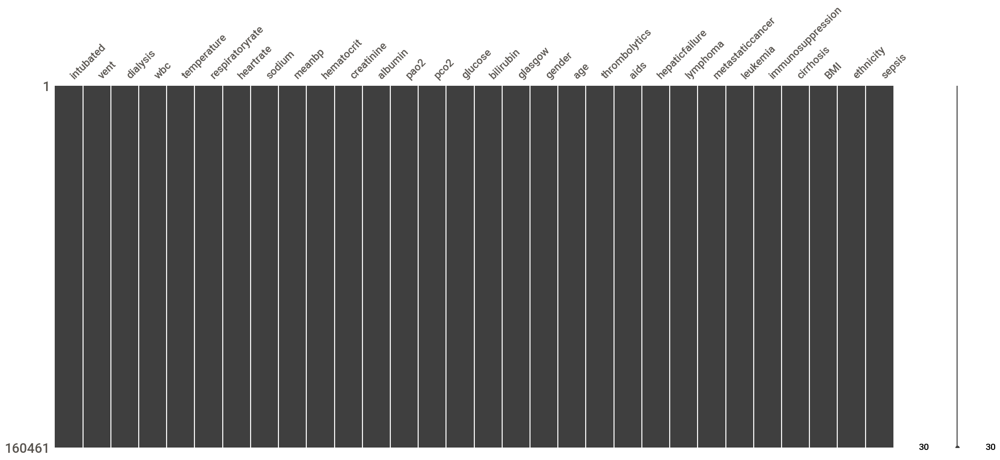

In [128]:
import missingno as msno
msno.matrix(data)

- Imputation of the remaining NaNs by MICE imputation strategies

#### FInal cleaned Dataset with sepsis as depedent variable

In [129]:
data.head()

,intubated,vent,dialysis,wbc,temperature,respiratoryrate,heartrate,sodium,meanbp,hematocrit,creatinine,albumin,pao2,pco2,glucose,bilirubin,glasgow,gender,age,thrombolytics,aids,hepaticfailure,lymphoma,metastaticcancer,leukemia,immunosuppression,cirrhosis,BMI,ethnicity,sepsis
0,0,0,0,14.700000,36.100000,30.0,140.0,139.000000,62.000000,40.100000,2.300000,3.100000,127.992443,36.324311,95.000000,4.100000,15.000000,1.0,70.0,0,0,0,0,0,0,0,0,36.30,Caucasian,0
1,0,0,0,11.423834,36.400000,16.0,88.0,137.830089,84.781903,33.569147,1.468372,3.020568,129.899655,43.478359,159.541685,1.122492,13.147595,1.0,52.0,0,0,0,0,0,0,0,0,20.58,Caucasian,0
2,0,0,0,14.100000,39.300000,36.0,118.0,134.000000,40.000000,27.400000,2.510000,2.300000,94.138836,44.434583,168.000000,0.400000,13.000000,0.0,68.0,0,0,0,0,0,0,0,0,22.73,Caucasian,1
3,0,0,0,11.896895,36.499647,25.0,104.0,137.627664,86.292154,32.359108,1.547997,2.871806,121.875526,44.017171,161.237565,1.003816,15.000000,0.0,71.0,0,0,0,0,0,0,0,0,38.62,Caucasian,1
4,0,1,0,12.700000,35.100000,33.0,120.0,145.000000,46.000000,36.900000,0.560000,2.163553,51.000000,37.000000,145.000000,2.333817,5.000000,1.0,77.0,0,0,0,0,0,0,0,0,27.42,Caucasian,0


In [130]:
data['ethnicity'].unique

<bound method Series.unique of 0                Caucasian
1                Caucasian
2                Caucasian
3                Caucasian
4                Caucasian
                ...       
171172           Caucasian
171173           Caucasian
171174    African American
171175           Caucasian
171176    African American
Name: ethnicity, Length: 160461, dtype: object>

In [131]:
data.describe()

,intubated,vent,dialysis,wbc,temperature,respiratoryrate,heartrate,sodium,meanbp,hematocrit,creatinine,albumin,pao2,pco2,glucose,bilirubin,glasgow,gender,age,thrombolytics,aids,hepaticfailure,lymphoma,metastaticcancer,leukemia,immunosuppression,cirrhosis,BMI,sepsis
count,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,160461.000000,1.604610e+05,160461.000000
mean,0.146871,0.238089,0.035853,12.149918,36.426460,25.226537,100.064087,137.937391,86.818396,32.853655,1.543135,2.909400,126.694294,43.553821,163.139708,1.103738,13.008460,0.460673,61.875247,0.016664,0.001078,0.015381,0.004362,0.020921,0.007435,0.027022,0.017942,3.291249e+02,0.128536
std,0.353978,0.425915,0.185924,7.038589,0.899281,14.874031,30.792371,4.959001,41.353613,6.162138,1.536296,0.516730,47.039400,7.943661,95.303902,1.607026,3.373365,0.498453,16.575337,0.128011,0.032817,0.123062,0.065905,0.143120,0.085905,0.162148,0.132741,2.244667e+04,0.334687
min,0.000000,0.000000,0.000000,0.010000,20.000000,4.000000,20.000000,91.000000,40.000000,2.806208,-1.221775,0.177289,-63.322003,-159.085433,-25.487719,-14.220094,1.793703,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000
25%,0.000000,0.000000,0.000000,8.300000,36.200000,11.000000,87.000000,136.000000,54.000000,29.200000,0.790000,2.626035,110.451861,41.498868,100.000000,0.600000,13.000000,0.000000,52.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.348000e+01,0.000000
50%,0.000000,0.000000,0.000000,11.221168,36.500000,27.000000,104.000000,138.000000,66.000000,33.000000,1.200000,2.923472,123.507608,44.000000,148.000000,0.940463,15.000000,0.000000,64.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.749000e+01,0.000000
75%,0.000000,0.000000,0.000000,14.000000,36.700000,35.000000,120.000000,140.000000,123.000000,36.400000,1.616396,3.200000,135.383645,46.116878,188.000000,1.319661,15.000000,1.000000,74.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.286000e+01,0.000000
max,1.000000,1.000000,1.000000,198.100000,42.300000,60.000000,220.000000,195.000000,200.000000,72.700000,24.950000,7.400000,636.000000,147.300000,2357.000000,60.200000,18.660600,1.000000,90.545887,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,8.233333e+06,1.000000


###### Check the target variable for imbalancing 

###### The distribution of our target variable

Text(0.5, 1.0, 'Percentage of patients will/will not have sepsis')

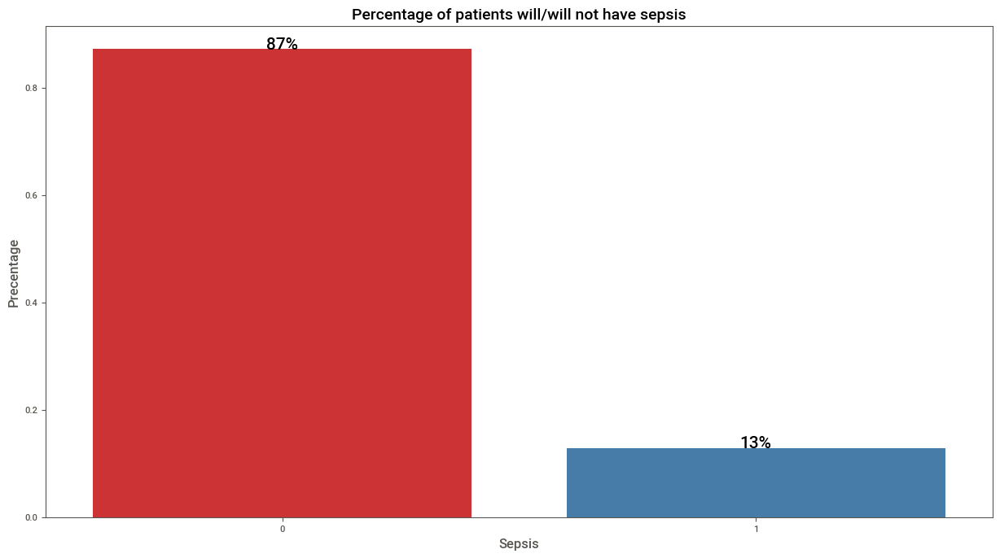

In [132]:
#Ploting barplot for target 
plt.figure(figsize=(15,8))
g = sns.barplot(data['sepsis'], data['sepsis'], palette='Set1', estimator=lambda x: len(x) / len(data) )

#Anotating the graph
for p in g.patches:
        width, height = p.get_width(), p.get_height()
        x, y = p.get_xy() 
        g.text(x+width/2, 
               y+height, 
               '{:.0%}'.format(height), 
               horizontalalignment='center',fontsize=15)

#Setting the labels
plt.xlabel('Sepsis', fontsize=12)
plt.ylabel('Precentage', fontsize=12)
plt.title('Percentage of patients will/will not have sepsis', fontsize=14)

#### Encoding  ethnicity

In [133]:
data.head()

,intubated,vent,dialysis,wbc,temperature,respiratoryrate,heartrate,sodium,meanbp,hematocrit,creatinine,albumin,pao2,pco2,glucose,bilirubin,glasgow,gender,age,thrombolytics,aids,hepaticfailure,lymphoma,metastaticcancer,leukemia,immunosuppression,cirrhosis,BMI,ethnicity,sepsis
0,0,0,0,14.700000,36.100000,30.0,140.0,139.000000,62.000000,40.100000,2.300000,3.100000,127.992443,36.324311,95.000000,4.100000,15.000000,1.0,70.0,0,0,0,0,0,0,0,0,36.30,Caucasian,0
1,0,0,0,11.423834,36.400000,16.0,88.0,137.830089,84.781903,33.569147,1.468372,3.020568,129.899655,43.478359,159.541685,1.122492,13.147595,1.0,52.0,0,0,0,0,0,0,0,0,20.58,Caucasian,0
2,0,0,0,14.100000,39.300000,36.0,118.0,134.000000,40.000000,27.400000,2.510000,2.300000,94.138836,44.434583,168.000000,0.400000,13.000000,0.0,68.0,0,0,0,0,0,0,0,0,22.73,Caucasian,1
3,0,0,0,11.896895,36.499647,25.0,104.0,137.627664,86.292154,32.359108,1.547997,2.871806,121.875526,44.017171,161.237565,1.003816,15.000000,0.0,71.0,0,0,0,0,0,0,0,0,38.62,Caucasian,1
4,0,1,0,12.700000,35.100000,33.0,120.0,145.000000,46.000000,36.900000,0.560000,2.163553,51.000000,37.000000,145.000000,2.333817,5.000000,1.0,77.0,0,0,0,0,0,0,0,0,27.42,Caucasian,0


###### OneHotEncoding

In [134]:
#from sklearn.preprocessing import OneHotEncoder
# creating instance of one-hot-encoder
#enc=OneHotEncoder(handle_unknown='ignore')
# Passing Ethnicity column 
#enc_df=pd.DataFrame(enc.fit_transform(data[['ethnicity']]).toarray())
# merge with the dataset
#data=data.join(enc_df)
#data.head()

###### Get dummies

In [135]:
# Get dummies 
dum_df=pd.get_dummies(data[['ethnicity']], prefix=['ethni'])
#merge with main df
data=data.join(dum_df)
data.head()

,intubated,vent,dialysis,wbc,temperature,respiratoryrate,heartrate,sodium,meanbp,hematocrit,creatinine,albumin,pao2,pco2,glucose,bilirubin,glasgow,gender,age,thrombolytics,aids,hepaticfailure,lymphoma,metastaticcancer,leukemia,immunosuppression,cirrhosis,BMI,ethnicity,sepsis,ethni_African American,ethni_Asian,ethni_Caucasian,ethni_Hispanic,ethni_Native American,ethni_Other/Unknown
0,0,0,0,14.700000,36.100000,30.0,140.0,139.000000,62.000000,40.100000,2.300000,3.100000,127.992443,36.324311,95.000000,4.100000,15.000000,1.0,70.0,0,0,0,0,0,0,0,0,36.30,Caucasian,0,0,0,1,0,0,0
1,0,0,0,11.423834,36.400000,16.0,88.0,137.830089,84.781903,33.569147,1.468372,3.020568,129.899655,43.478359,159.541685,1.122492,13.147595,1.0,52.0,0,0,0,0,0,0,0,0,20.58,Caucasian,0,0,0,1,0,0,0
2,0,0,0,14.100000,39.300000,36.0,118.0,134.000000,40.000000,27.400000,2.510000,2.300000,94.138836,44.434583,168.000000,0.400000,13.000000,0.0,68.0,0,0,0,0,0,0,0,0,22.73,Caucasian,1,0,0,1,0,0,0
3,0,0,0,11.896895,36.499647,25.0,104.0,137.627664,86.292154,32.359108,1.547997,2.871806,121.875526,44.017171,161.237565,1.003816,15.000000,0.0,71.0,0,0,0,0,0,0,0,0,38.62,Caucasian,1,0,0,1,0,0,0
4,0,1,0,12.700000,35.100000,33.0,120.0,145.000000,46.000000,36.900000,0.560000,2.163553,51.000000,37.000000,145.000000,2.333817,5.000000,1.0,77.0,0,0,0,0,0,0,0,0,27.42,Caucasian,0,0,0,1,0,0,0


In [136]:
# Get rid the ethnicity columns 
data = data.drop('ethnicity', 1)

In [137]:
data.head()

,intubated,vent,dialysis,wbc,temperature,respiratoryrate,heartrate,sodium,meanbp,hematocrit,creatinine,albumin,pao2,pco2,glucose,bilirubin,glasgow,gender,age,thrombolytics,aids,hepaticfailure,lymphoma,metastaticcancer,leukemia,immunosuppression,cirrhosis,BMI,sepsis,ethni_African American,ethni_Asian,ethni_Caucasian,ethni_Hispanic,ethni_Native American,ethni_Other/Unknown
0,0,0,0,14.700000,36.100000,30.0,140.0,139.000000,62.000000,40.100000,2.300000,3.100000,127.992443,36.324311,95.000000,4.100000,15.000000,1.0,70.0,0,0,0,0,0,0,0,0,36.30,0,0,0,1,0,0,0
1,0,0,0,11.423834,36.400000,16.0,88.0,137.830089,84.781903,33.569147,1.468372,3.020568,129.899655,43.478359,159.541685,1.122492,13.147595,1.0,52.0,0,0,0,0,0,0,0,0,20.58,0,0,0,1,0,0,0
2,0,0,0,14.100000,39.300000,36.0,118.0,134.000000,40.000000,27.400000,2.510000,2.300000,94.138836,44.434583,168.000000,0.400000,13.000000,0.0,68.0,0,0,0,0,0,0,0,0,22.73,1,0,0,1,0,0,0
3,0,0,0,11.896895,36.499647,25.0,104.0,137.627664,86.292154,32.359108,1.547997,2.871806,121.875526,44.017171,161.237565,1.003816,15.000000,0.0,71.0,0,0,0,0,0,0,0,0,38.62,1,0,0,1,0,0,0
4,0,1,0,12.700000,35.100000,33.0,120.0,145.000000,46.000000,36.900000,0.560000,2.163553,51.000000,37.000000,145.000000,2.333817,5.000000,1.0,77.0,0,0,0,0,0,0,0,0,27.42,0,0,0,1,0,0,0


In [138]:
data.dtypes

intubated                   int64
vent                        int64
dialysis                    int64
wbc                       float64
temperature               float64
respiratoryrate           float64
heartrate                 float64
sodium                    float64
meanbp                    float64
hematocrit                float64
creatinine                float64
albumin                   float64
pao2                      float64
pco2                      float64
glucose                   float64
bilirubin                 float64
glasgow                   float64
gender                    float64
age                       float64
thrombolytics               int64
aids                        int64
hepaticfailure              int64
lymphoma                    int64
metastaticcancer            int64
leukemia                    int64
immunosuppression           int64
cirrhosis                   int64
BMI                       float64
sepsis                      int64
ethni_African 

In [139]:
ind_col=[col for col in data.columns if col!='sepsis']
dep_col='sepsis'

In [140]:
X=data[ind_col]
y=data[dep_col]

###### spliting training and testing data

#### Feature Scaling for Machine Learning

In [141]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    stratify=y, 
                                                    test_size=0.2)

In [142]:
print(X_train.shape)
print(X_test.shape)

(128368, 34)
(32093, 34)


In [143]:
X_train.head()

,intubated,vent,dialysis,wbc,temperature,respiratoryrate,heartrate,sodium,meanbp,hematocrit,creatinine,albumin,pao2,pco2,glucose,bilirubin,glasgow,gender,age,thrombolytics,aids,hepaticfailure,lymphoma,metastaticcancer,leukemia,immunosuppression,cirrhosis,BMI,ethni_African American,ethni_Asian,ethni_Caucasian,ethni_Hispanic,ethni_Native American,ethni_Other/Unknown
31666,0,0,0,10.900000,36.500000,31.000000,92.000000,140.000000,135.000000,36.800000,1.160000,2.800000,88.304619,47.401499,163.000000,0.200000,15.000000,1.0,50.0,0,0,0,0,0,0,0,0,28.02,1,0,0,0,0,0
73633,0,0,0,12.182635,36.335104,26.017424,93.530802,138.269211,85.595008,31.756481,1.640756,2.785017,124.463311,44.128258,158.994667,0.932065,13.016739,0.0,84.0,0,0,0,0,0,0,0,0,31.71,0,0,1,0,0,0
14044,0,0,0,10.800000,36.330000,38.000000,57.000000,138.000000,124.000000,36.400000,1.100000,3.195595,118.309490,46.398671,203.000000,0.579810,13.000000,0.0,73.0,0,0,0,0,0,0,0,0,32.60,0,0,1,0,0,0
47448,0,0,0,12.059650,37.400000,10.000000,120.000000,137.178468,69.000000,33.103538,1.345377,2.951313,127.056223,42.737728,190.000000,1.142586,15.000000,0.0,46.0,0,0,0,0,0,0,0,0,31.94,0,0,1,0,0,0
42867,1,1,0,20.600000,36.100000,59.000000,20.000000,133.000000,167.000000,35.600000,0.800000,3.000000,47.000000,50.000000,208.000000,0.600000,3.000000,1.0,83.0,0,0,0,0,0,0,0,0,28.76,0,0,1,0,0,0


##### Comparing Training Set and Test Set

In [144]:
train_test_report=sv.compare([X_train,'Trainig Data'],[X_test,'Test_Data'])

                                             |      | [  0%]   00:00 -> (? left)

In [145]:
train_test_report.show_html('train_test_report.html', open_browser=False)

Report train_test_report.html was generated.



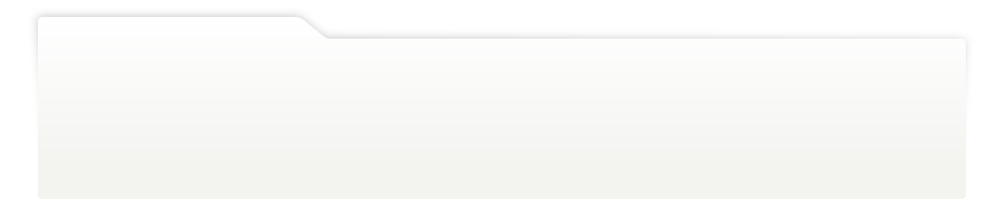
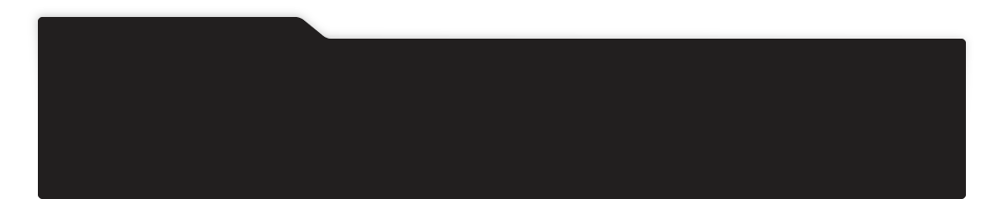
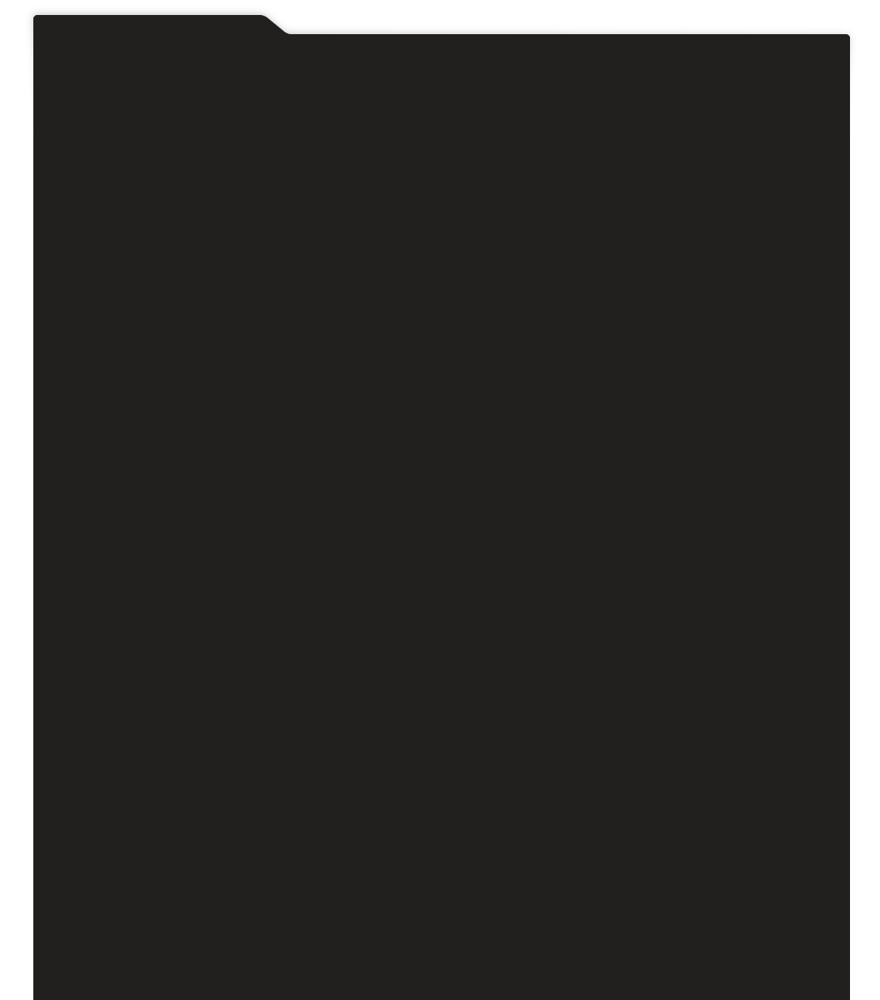
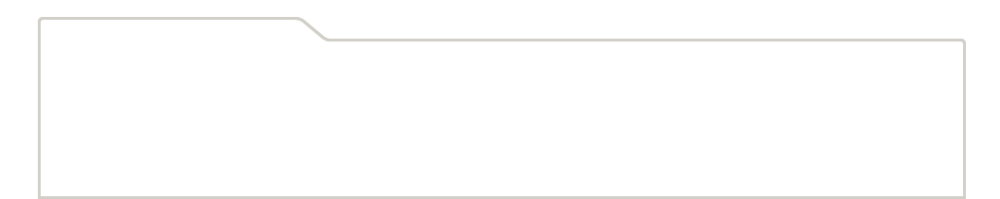
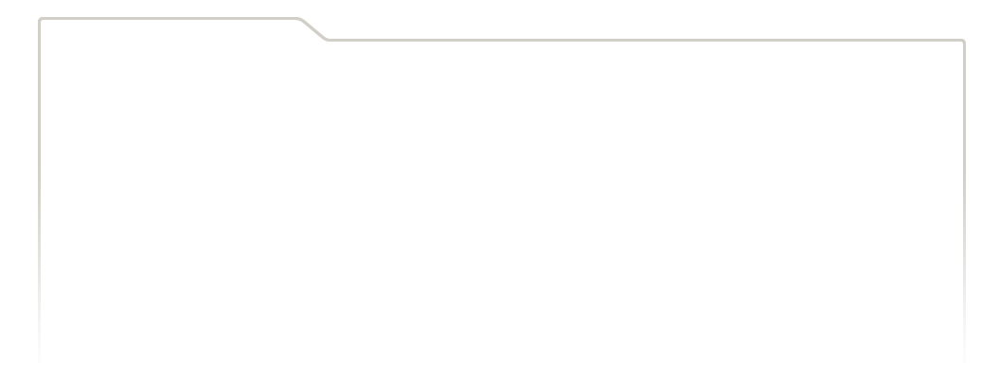
...
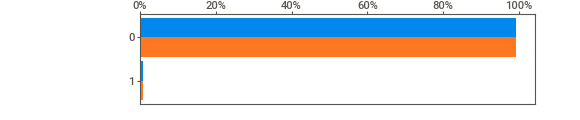
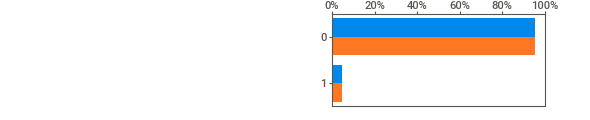
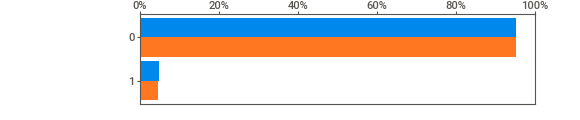
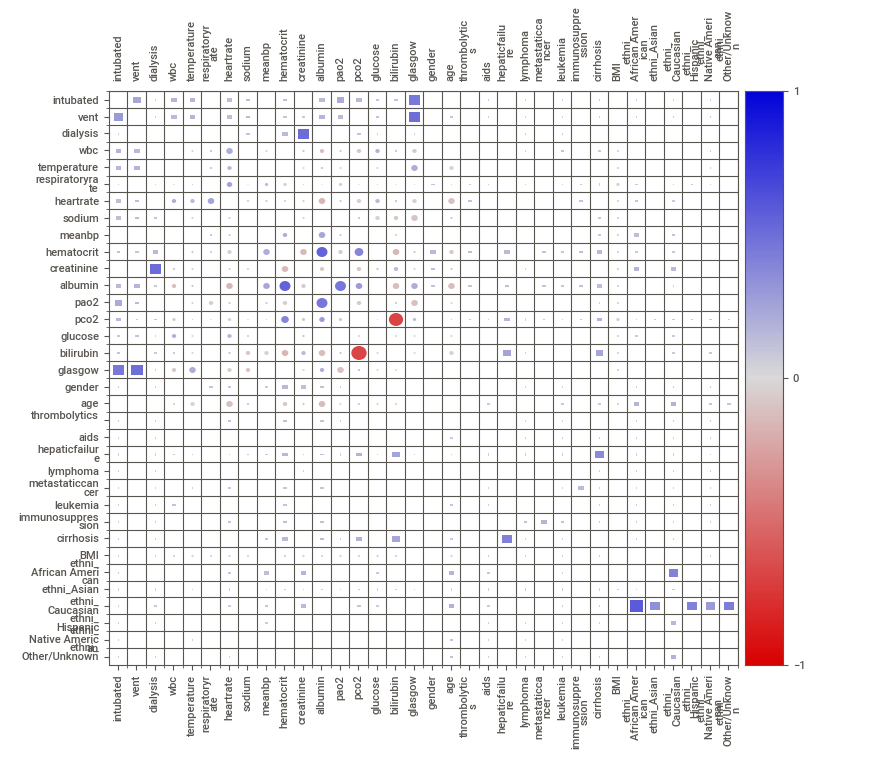
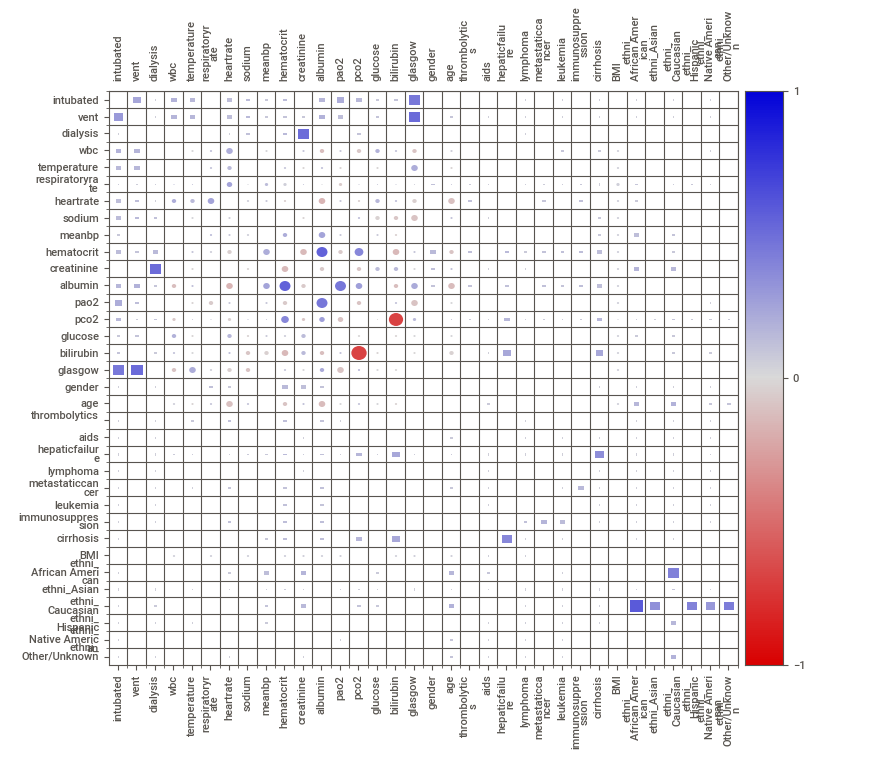

In [146]:
# Display results 
IPython.display.HTML('train_test_report.html')

###### Normalization

Min-Max Normalization method is used to Normalize the data. This method scales the data range to [0,1]. Standardization is also used on a feature-wise basis in most cases

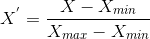

In [147]:
X_train.columns

Index(['intubated', 'vent', 'dialysis', 'wbc', 'temperature',
       'respiratoryrate', 'heartrate', 'sodium', 'meanbp', 'hematocrit',
       'creatinine', 'albumin', 'pao2', 'pco2', 'glucose', 'bilirubin',
       'glasgow', 'gender', 'age', 'thrombolytics', 'aids', 'hepaticfailure',
       'lymphoma', 'metastaticcancer', 'leukemia', 'immunosuppression',
       'cirrhosis', 'BMI', 'ethni_African American', 'ethni_Asian',
       'ethni_Caucasian', 'ethni_Hispanic', 'ethni_Native American',
       'ethni_Other/Unknown'],
      dtype='object')

In [148]:
from sklearn import preprocessing
X_train=preprocessing.normalize(X_train)
X_test=preprocessing.normalize(X_test)

In [149]:
X_train=pd.DataFrame(X_train, columns=['intubated', 'vent', 'dialysis', 'wbc', 'temperature',
       'respiratoryrate', 'heartrate', 'sodium', 'meanbp', 'hematocrit',
       'creatinine', 'albumin', 'pao2', 'pco2', 'glucose', 'bilirubin',
       'glasgow', 'gender', 'age', 'thrombolytics', 'aids', 'hepaticfailure',
       'lymphoma', 'metastaticcancer', 'leukemia', 'immunosuppression',
       'cirrhosis', 'BMI','ethni_African American', 'ethni_Asian',
       'ethni_Caucasian', 'ethni_Hispanic', 'ethni_Native American',
       'ethni_Other/Unknown'])

In [150]:
X_train.head()

,intubated,vent,dialysis,wbc,temperature,respiratoryrate,heartrate,sodium,meanbp,hematocrit,creatinine,albumin,pao2,pco2,glucose,bilirubin,glasgow,gender,age,thrombolytics,aids,hepaticfailure,lymphoma,metastaticcancer,leukemia,immunosuppression,cirrhosis,BMI,ethni_African American,ethni_Asian,ethni_Caucasian,ethni_Hispanic,ethni_Native American,ethni_Other/Unknown
0,0.000000,0.000000,0.0,0.036295,0.121538,0.103224,0.306343,0.466174,0.449525,0.122537,0.003863,0.009323,0.294038,0.157838,0.542760,0.000666,0.049947,0.003330,0.166491,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.093301,0.00333,0.0,0.000000,0.0,0.0,0.0
1,0.000000,0.000000,0.0,0.040766,0.121585,0.087060,0.312975,0.462680,0.286420,0.106264,0.005490,0.009319,0.416482,0.147663,0.532032,0.003119,0.043557,0.000000,0.281083,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.106109,0.00000,0.0,0.003346,0.0,0.0,0.0
2,0.000000,0.000000,0.0,0.033202,0.111688,0.116822,0.175234,0.424250,0.381210,0.111904,0.003382,0.009824,0.363716,0.142642,0.624078,0.001782,0.039966,0.000000,0.224422,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.100221,0.00000,0.0,0.003074,0.0,0.0,0.0
3,0.000000,0.000000,0.0,0.038491,0.119371,0.031917,0.383008,0.437837,0.220230,0.105658,0.004294,0.009420,0.405530,0.136407,0.606429,0.003647,0.047876,0.000000,0.146820,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.101944,0.00000,0.0,0.003192,0.0,0.0,0.0
4,0.003041,0.003041,0.0,0.062636,0.109764,0.179393,0.060811,0.404395,0.507775,0.108244,0.002432,0.009122,0.142907,0.152028,0.632438,0.001824,0.009122,0.003041,0.252367,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.087447,0.00000,0.0,0.003041,0.0,0.0,0.0


In [151]:
X_test=pd.DataFrame(X_test, columns=['intubated', 'vent', 'dialysis', 'wbc', 'temperature',
       'respiratoryrate', 'heartrate', 'sodium', 'meanbp', 'hematocrit',
       'creatinine', 'albumin', 'pao2', 'pco2', 'glucose', 'bilirubin',
       'glasgow', 'gender', 'age', 'thrombolytics', 'aids', 'hepaticfailure',
       'lymphoma', 'metastaticcancer', 'leukemia', 'immunosuppression',
       'cirrhosis', 'BMI','ethni_African American', 'ethni_Asian',
       'ethni_Caucasian', 'ethni_Hispanic', 'ethni_Native American',
       'ethni_Other/Unknown'])

In [152]:
# Shape X_train
X_train.shape

(128368, 34)

In [153]:
# Shape X_test
X_test.shape

(32093, 34)

### APPLYING SMOTE TECHNIQUE FOR HANDLING EMBALANCE DATASET

doc : https://www.analyticsvidhya.com/blog/2020/10/overcoming-class-imbalance-using-smote-techniques/

In [154]:
from collections import Counter
from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import ADASYN
from imblearn.combine import SMOTETomek
from imblearn.combine import SMOTEENN

counter=Counter(y_train)
print('Before', counter)
#oversampling the train dataset using SMOTE

# 1. Simple SMOTE algorithm
smt=SMOTE()

#2. ADASYN: Adaptive Synthetic Sampling Approach
ada=ADASYN(random_state=130)

#3.Hybridization: SMOTE + Tomek Links
smtom=SMOTETomek(random_state=139)

# 4. Hybridization: SMOTE + ENN
smenn=SMOTEENN()

#X_train, y_train=smt.fit_resample(X_train, y_train)
X_train_sm, X_train_sm=smenn.fit_resample(X_train, y_train)

counter=Counter(y_train_sm)
print('After',counter)

Before Counter({0: 111868, 1: 16500})
After Counter({1: 108757, 0: 66069})


###### Logistic Regression (Baseline Model)

In [158]:
from sklearn.linear_model import LogisticRegression
logre = LogisticRegression()
logre.fit(X_train_sm,y_train_sm)

LogisticRegression()

In [159]:
# Prediction
y_pred_log = logre.predict(X_test)
actual = []
predcition = []

In [160]:
for i, j in zip(y_test, y_pred_log):
    actual.append(i)
    predcition.append(j)

In [161]:
dic = {'Actual':actual,
       'Prediction':predcition
       }

In [162]:
result  = pd.DataFrame(dic)
result

,Actual,Prediction
0,0,1
1,0,0
2,0,1
3,0,0
4,0,0
...,...,...
32088,0,0
32089,0,0
32090,0,1
32091,0,1


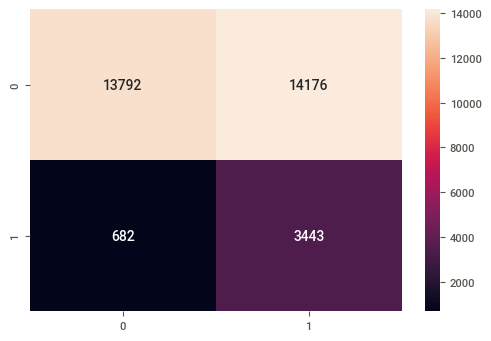

              precision    recall  f1-score   support

           0       0.95      0.49      0.65     27968
           1       0.20      0.83      0.32      4125

    accuracy                           0.54     32093
   macro avg       0.57      0.66      0.48     32093
weighted avg       0.86      0.54      0.61     32093



In [163]:
from sklearn.metrics import classification_report, confusion_matrix
sns.heatmap(confusion_matrix(y_test,y_pred_log),annot=True, fmt="d")
plt.show()
print(classification_report(y_test,y_pred_log))

###### ROC Curve Simple Logistic Regression

Model Validation ==>

Accuracy Score of Simple Logistic Regression Model::
0.5370329978499985


<Figure size 600x400 with 0 Axes>

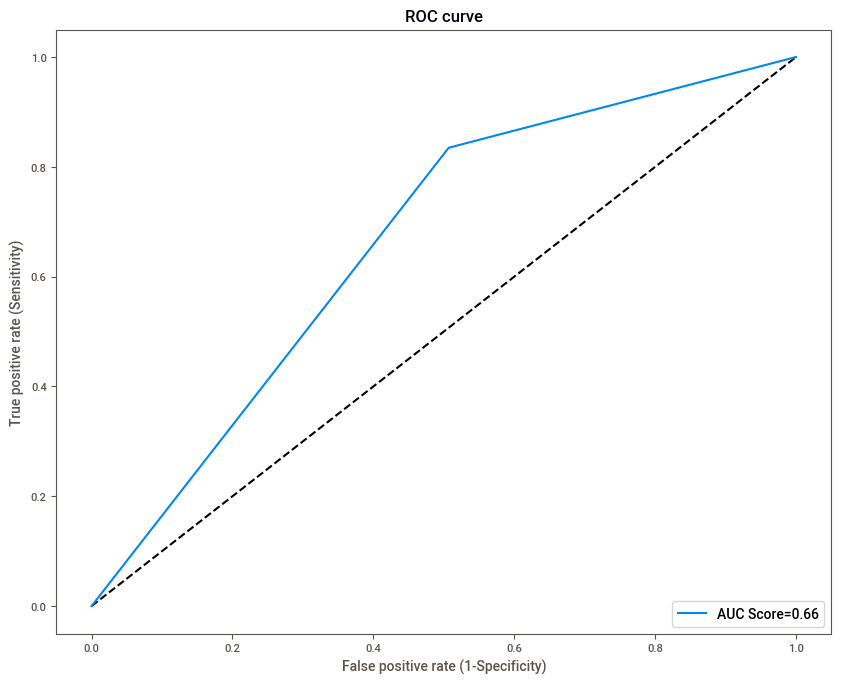

In [168]:
from sklearn.metrics import roc_curve
import sklearn.metrics as metrics
plt.figure(dpi=100)
print("Model Validation ==>\n")
print("Accuracy Score of Simple Logistic Regression Model::")
print(metrics.accuracy_score(y_test,y_pred_log))
y_pred_proba = logre.predict(X_test)
fpr, tpr, thresholds = roc_curve(y_test, y_pred_log)
roc_auc_log_log=metrics.auc(fpr,tpr)
plt.figure(figsize=(10,8))
plt.plot([0,1],[0,1],'k--')
plt.plot(fpr,tpr, label='AUC Score=%0.2f'%roc_auc_log_log)
plt.xlabel('False positive rate (1-Specificity)')
plt.ylabel('True positive rate (Sensitivity)')
plt.title('ROC curve')
plt.legend(loc="lower right")
#plt.grid(True)
plt.show()

###### Logistic Regression (class_weight=’balanced’)

We have added the class_weight parameter to our logistic regression algorithm and the value we have passed is ‘balanced'

The f1 score for the testing data: 0.34564339296018465


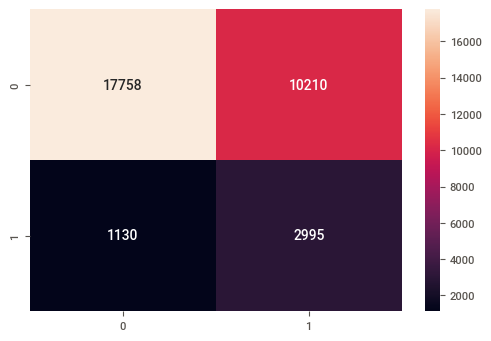

              precision    recall  f1-score   support

           0       0.94      0.63      0.76     27968
           1       0.23      0.73      0.35      4125

    accuracy                           0.65     32093
   macro avg       0.58      0.68      0.55     32093
weighted avg       0.85      0.65      0.70     32093



In [169]:
#importing and training the model
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score
from sklearn.metrics import classification_report, confusion_matrix
lr = LogisticRegression(solver='newton-cg', class_weight='balanced')
lr.fit(X_train_sm, y_train_sm)

# Predicting on the test data
pred_test = lr.predict(X_test)

#Calculating and printing the f1 score 
f1_test = f1_score(y_test, pred_test)
print('The f1 score for the testing data:', f1_test)

#Ploting the confusion matrix
#confusion_matrix(y_test, pred_test)
sns.heatmap(confusion_matrix(y_test,pred_test), annot=True, fmt="d")
plt.show()
print(classification_report(y_test,pred_test))

### How to Improve Class Imbalance using Class Weights in Machine Learning for Logistic Regression

Doc : https://www.analyticsvidhya.com/blog/2020/10/improve-class-imbalance-class-weights/

##### Logistic Regression (class_weight=’balanced’)

Model Validation ==>

Accuracy Score of Logistic Regression (class_weight=’balanced’) Model::
0.6466519178637086


<Figure size 600x400 with 0 Axes>

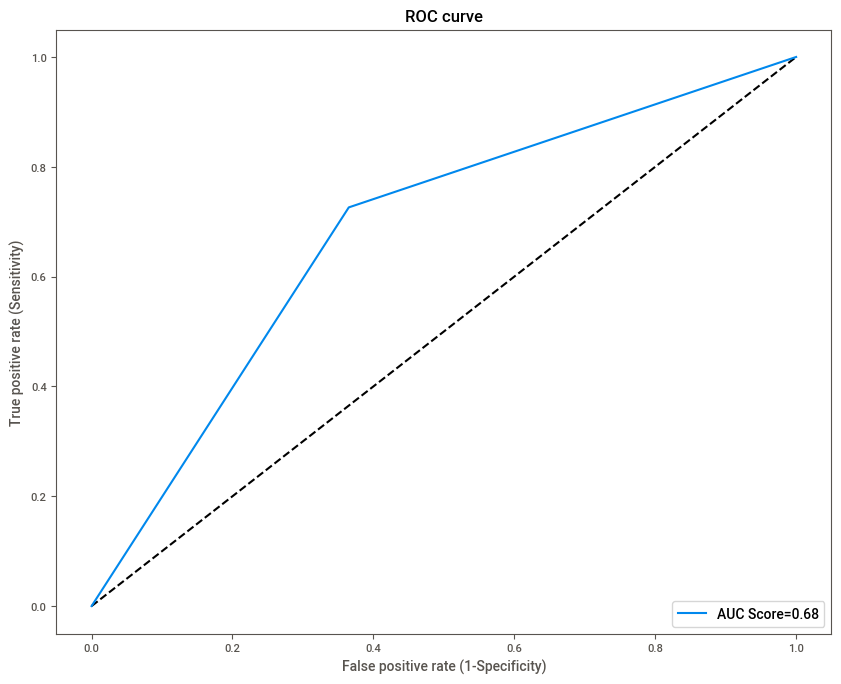

In [170]:
plt.figure(dpi=100)
from sklearn.metrics import roc_curve
print("Model Validation ==>\n")
print("Accuracy Score of Logistic Regression (class_weight=’balanced’) Model::")
print(metrics.accuracy_score(y_test,pred_test))
y_pred_proba = lr.predict(X_test)
fpr, tpr, thresholds = roc_curve(y_test, pred_test)
roc_auc_log_weithed=metrics.auc(fpr,tpr)
plt.figure(figsize=(10,8))
plt.plot([0,1],[0,1],'k--')
plt.plot(fpr,tpr, label='AUC Score=%0.2f'%roc_auc_log_weithed)
plt.xlabel('False positive rate (1-Specificity)')
plt.ylabel('True positive rate (Sensitivity)')
plt.title('ROC curve')
plt.legend(loc="lower right")
#plt.grid(True)
plt.show()

By adding a single class weight parameter to the logistic regression function, we have improved the f1 score. We can see in the confusion matrix that even though the misclassification for class 0 (no sepsis) has increased, the model can capture class 1 (sepsis) pretty well

In [ ]:
##########################################################################################################################

#### Decision Tree Model

In [171]:
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier 
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics # Import scikit-learn metrics module for accuracy calculation 

# Create Decision Tree classifier object
dt_clf=DecisionTreeClassifier()

# Train Decision Tree Classifier 
dt_clf.fit(X_train_sm, y_train_sm)

# Predict the response for test dataset
y_pred_dt=dt_clf.predict(X_test)
print('Accuracy :', metrics.accuracy_score(y_test, y_pred_dt))

Accuracy : 0.7129280528464151


In [172]:
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred_dt))

              precision    recall  f1-score   support

           0       0.92      0.74      0.82     27968
           1       0.24      0.56      0.33      4125

    accuracy                           0.71     32093
   macro avg       0.58      0.65      0.57     32093
weighted avg       0.83      0.71      0.75     32093



[[20589  7379]
 [ 1834  2291]]


<AxesSubplot:>

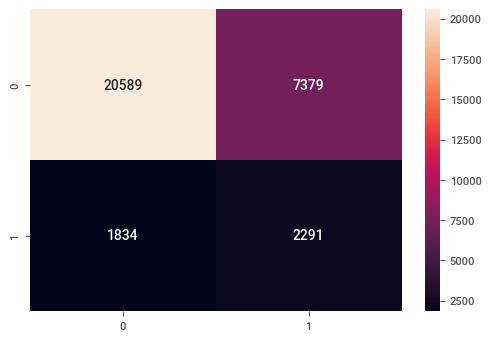

In [173]:
from sklearn.metrics import confusion_matrix
print(confusion_matrix(y_test,y_pred_dt))
sns.heatmap(confusion_matrix(y_test,y_pred_dt),annot=True, fmt="d")

Model Validation ==>

Accuracy Score of Decision Tree Model::
0.7129280528464151


<Figure size 600x400 with 0 Axes>

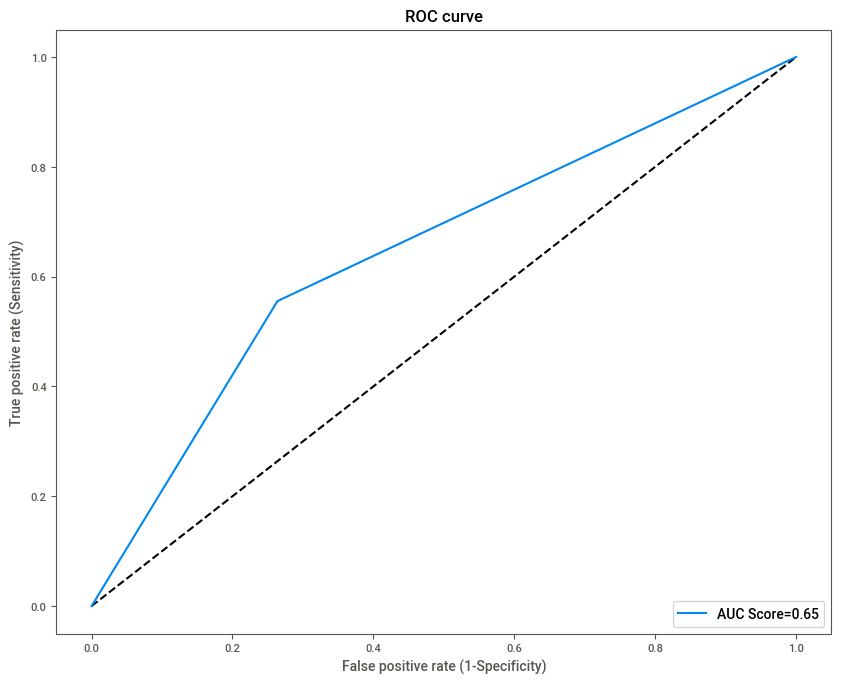

In [174]:
plt.figure(dpi=100)
from sklearn.metrics import roc_curve
print("Model Validation ==>\n")
print("Accuracy Score of Decision Tree Model::")
print(metrics.accuracy_score(y_test,y_pred_dt))
y_pred_proba = dt_clf.predict(X_test)
fpr, tpr, thresholds = roc_curve(y_test, y_pred_dt)
roc_auc_dtree_1=metrics.auc(fpr,tpr)
plt.figure(figsize=(10,8))
plt.plot([0,1],[0,1],'k--')
plt.plot(fpr,tpr, label='AUC Score=%0.2f'%roc_auc_dtree_1)
plt.xlabel('False positive rate (1-Specificity)')
plt.ylabel('True positive rate (Sensitivity)')
plt.title('ROC curve')
plt.legend(loc="lower right")
#plt.grid(True)
plt.show()

#### DecisionTreeClassifier with RandomizedSearCV

In [175]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import accuracy_score 

def randomized_search(params, runs=20, clf=DecisionTreeClassifier(random_state=2)):
    rand_clf=RandomizedSearchCV(clf, params, n_iter=runs, cv=5, n_jobs=-1, random_state=2)
    rand_clf.fit(X_train_sm, y_train_sm)
    best_model=rand_clf.best_estimator_
    best_score=rand_clf.best_score_
    
    print('Training score :{:.3f}'.format(best_score))
    y_pred=best_model.predict(X_test)
    accuracy=accuracy_score(y_test, y_pred)
    print('Test score :{:.3f}'.format(accuracy))
    
    return best_model

randomized_search(params={'criterion':['entropy','gini'],
                          'splitter':['random','best'],
                          'min_weight_fraction_leaf':[0.0, 0.0025, 0.005, 0.0075, 0.01],
                          'min_samples_split':[2, 3, 4, 5, 8, 10],
                          'min_impurity_decrease':[0.0, 0.0005, 0.005, 0.05, 0.10, 0.15, 0.2],
                          'max_leaf_nodes':[10, 15, 20, 25, 30, 35, 40, 45, 50, None],
                          'max_features':['auto', 0.95, 0.90, 0.85, 0.80, 0.75, 0.70],
                          'max_depth':[None, 2, 4, 6, 8],
                          'min_weight_fraction_leaf':[0.0, 0.0025, 0.005, 0.0075, 0.01, 0.05]
                         })

Training score :0.774
Test score :0.592


DecisionTreeClassifier(criterion='entropy', max_features=0.7, max_leaf_nodes=45,
                       min_impurity_decrease=0.0005, min_samples_split=4,
                       min_weight_fraction_leaf=0.0025, random_state=2)

In [176]:
ds_clf=DecisionTreeClassifier(criterion='entropy', max_features=0.7, max_leaf_nodes=45,
                       min_impurity_decrease=0.0005, min_samples_split=4,
                       min_weight_fraction_leaf=0.0025, random_state=2)

ds_clf.fit(X_train_sm, y_train_sm)
pred4=ds_clf.predict(X_test)
#evaluating_model(y_test, pred4)
print('Accuracy :', metrics.accuracy_score(y_test, pred4))

Accuracy : 0.5921228928426759


In [177]:
from sklearn.metrics import classification_report
print(classification_report(y_test,pred4))

              precision    recall  f1-score   support

           0       0.93      0.57      0.71     27968
           1       0.20      0.72      0.31      4125

    accuracy                           0.59     32093
   macro avg       0.57      0.65      0.51     32093
weighted avg       0.84      0.59      0.66     32093



[[16014 11954]
 [ 1136  2989]]


<AxesSubplot:>

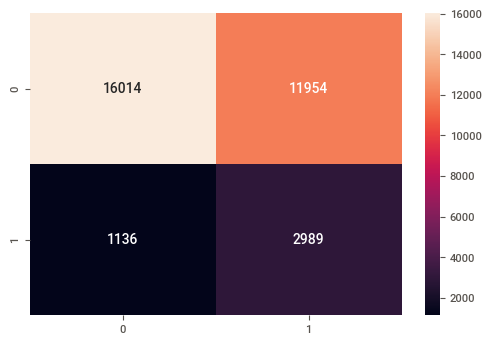

In [178]:
from sklearn.metrics import confusion_matrix
print(confusion_matrix(y_test,pred4))
sns.heatmap(confusion_matrix(y_test,pred4),annot=True, fmt="d")

Model Validation ==>

Accuracy Score of Random Forest Model::
0.5921228928426759


<Figure size 600x400 with 0 Axes>

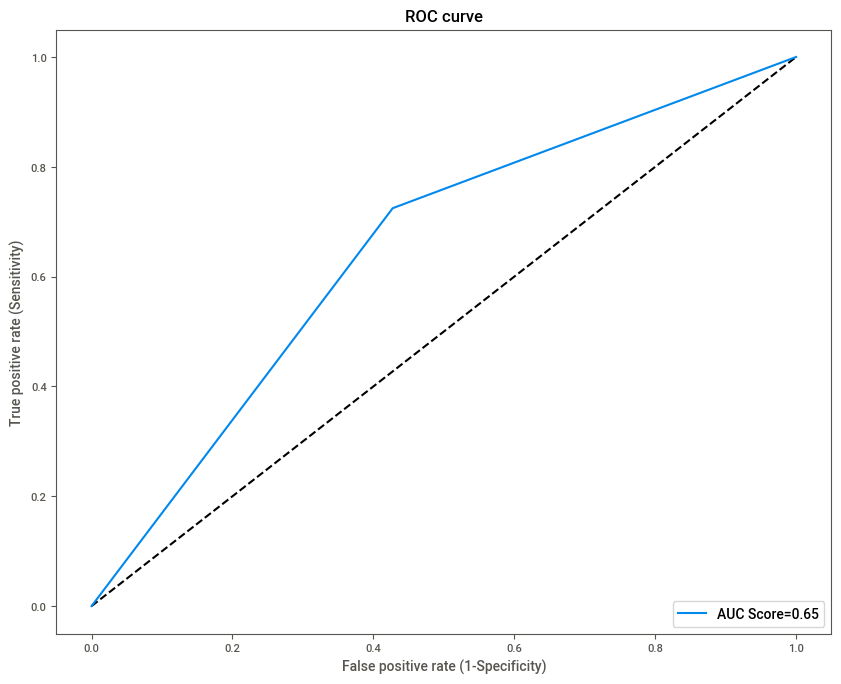

In [180]:
plt.figure(dpi=100)
from sklearn.metrics import roc_curve
print("Model Validation ==>\n")
print("Accuracy Score of Random Forest Model::")
print(metrics.accuracy_score(y_test,pred4))
y_pred_proba = ds_clf.predict(X_test)
fpr, tpr, thresholds = roc_curve(y_test, pred4)
roc_auc_dtree=metrics.auc(fpr,tpr)
plt.figure(figsize=(10,8))
plt.plot([0,1],[0,1],'k--')
plt.plot(fpr,tpr, label='AUC Score=%0.2f'%roc_auc_dtree)
plt.xlabel('False positive rate (1-Specificity)')
plt.ylabel('True positive rate (Sensitivity)')
plt.title('ROC curve')
plt.legend(loc="lower right")
#plt.grid(True)
plt.show()

### Random Forest Classifier 

In [181]:
from sklearn.ensemble import RandomForestClassifier

randomized_search(params={
                          'min_samples_leaf':[1,2,4,6,8,10,20,30],
                          'min_impurity_decrease':[0.0, 0.01, 0.05, 0.10, 0.15, 0.2],
                          'max_features':['auto', 0.8, 0.7, 0.6, 0.5, 0.4],
                           'max_depth':[None,2,4,6,8,10,20], 
}, clf=RandomForestClassifier(random_state=2))

Training score :0.777
Test score :0.511


RandomForestClassifier(max_depth=4, max_features=0.6, min_samples_leaf=10,
                       random_state=2)

In [183]:
rf_clf=RandomForestClassifier(max_depth=4, max_features=0.6, min_samples_leaf=10,
                       random_state=2)

rf_clf.fit(X_train_sm, y_train_sm)
pred5=rf_clf.predict(X_test)
#evaluating_model(y_test, pred5)
print('Accuracy :', metrics.accuracy_score(y_test, pred5))

Accuracy : 0.5106097902969495


[[12816 15152]
 [  554  3571]]


<AxesSubplot:>

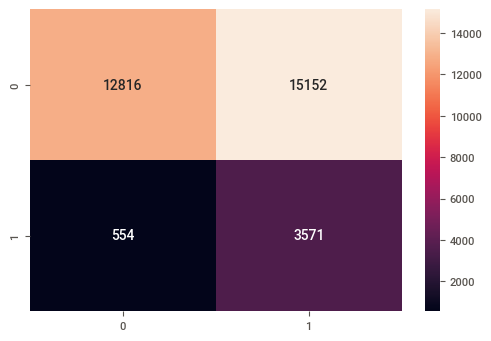

In [184]:
from sklearn.metrics import confusion_matrix
print(confusion_matrix(y_test,pred5))
sns.heatmap(confusion_matrix(y_test,pred5),annot=True, fmt="d")

Model Validation ==>

Accuracy Score of Random Forest Model::
0.5106097902969495


<Figure size 600x400 with 0 Axes>

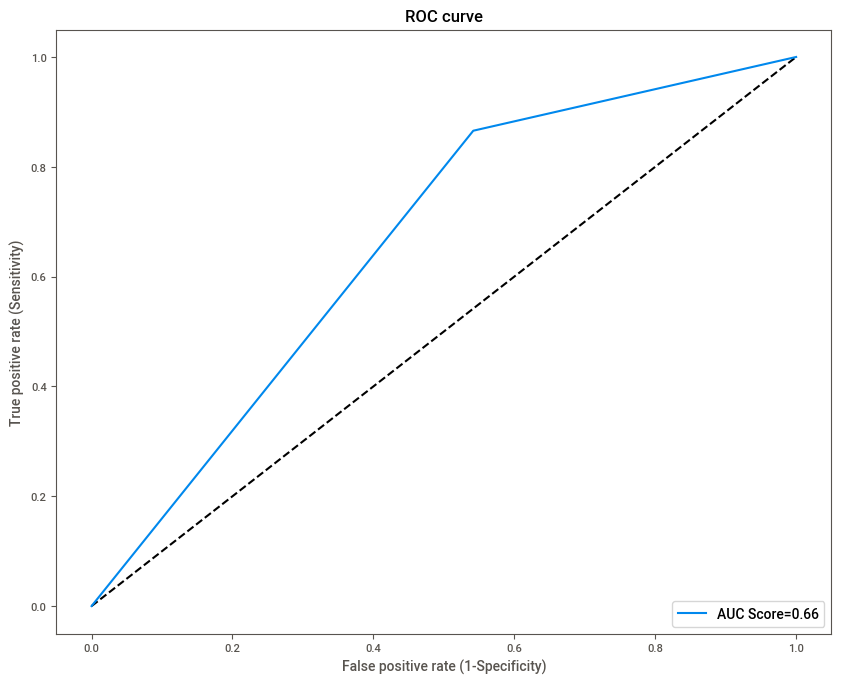

In [185]:
plt.figure(dpi=100)
from sklearn.metrics import roc_curve
print("Model Validation ==>\n")
print("Accuracy Score of Random Forest Model::")
print(metrics.accuracy_score(y_test,pred5))
y_pred_proba = rf_clf.predict(X_test)
fpr, tpr, thresholds = roc_curve(y_test, pred5)
roc_auc_rdf=metrics.auc(fpr,tpr)
plt.figure(figsize=(10,8))
plt.plot([0,1],[0,1],'k--')
plt.plot(fpr,tpr, label='AUC Score=%0.2f'%roc_auc_rdf)
plt.xlabel('False positive rate (1-Specificity)')
plt.ylabel('True positive rate (Sensitivity)')
plt.title('ROC curve')
plt.legend(loc="lower right")
#plt.grid(True)
plt.show()

#### XGBOOST Classifier 

XGBoost is an optimized distributed gradient boosting library designed to be highly efficient, flexible and portable. It implements machine learning algorithms under the Gradient Boosting framework. XGBoost provides a parallel tree boosting (also known as GBDT, GBM) that solve many data science problems in a fast and accurate way. The same code runs on major distributed environment (Hadoop, SGE, MPI) and can solve problems beyond billions of examples.

In [186]:
import os
from xgboost import XGBClassifier
os.environ['KMP_DUPLICATE_LIB_OK']='True'
xgb1=XGBClassifier(colsample_bytree=1.0, #percentage of features used per tree. High value can lead to overfitting.
                  learning_rate=0.1, #step size shrinkage used to prevent overfitting. Range is [0,1]
                  max_depth=4, #determines how deeply each tree is allowed to grow during any boosting round
                  n_estimators=400, #number of trees you want to build
                  subsample=1.0,
                  n_jobs=-1)
                  #nthread=4)

eval_set=[(X_test, y_test)]
xgb1.fit(X_train_sm, y_train_sm, early_stopping_rounds=10, eval_metric='logloss', eval_set=eval_set,
        verbose=True)

[0]	validation_0-logloss:0.69162
[1]	validation_0-logloss:0.69214
[2]	validation_0-logloss:0.69334
[3]	validation_0-logloss:0.69212
[4]	validation_0-logloss:0.69363
[5]	validation_0-logloss:0.69315
[6]	validation_0-logloss:0.69504
[7]	validation_0-logloss:0.69303
[8]	validation_0-logloss:0.68829
[9]	validation_0-logloss:0.68773
[10]	validation_0-logloss:0.68767
[11]	validation_0-logloss:0.68716
[12]	validation_0-logloss:0.68851
[13]	validation_0-logloss:0.68348
[14]	validation_0-logloss:0.68056
[15]	validation_0-logloss:0.68166
[16]	validation_0-logloss:0.67488
[17]	validation_0-logloss:0.67107
[18]	validation_0-logloss:0.66657
[19]	validation_0-logloss:0.66745
[20]	validation_0-logloss:0.66717
[21]	validation_0-logloss:0.66166
[22]	validation_0-logloss:0.65752
[23]	validation_0-logloss:0.65785
[24]	validation_0-logloss:0.65368
[25]	validation_0-logloss:0.65067
[26]	validation_0-logloss:0.64953
[27]	validation_0-logloss:0.64604
[28]	validation_0-logloss:0.64185
[29]	validation_0-loglos

[238]	validation_0-logloss:0.49693
[239]	validation_0-logloss:0.49700
[240]	validation_0-logloss:0.49686
[241]	validation_0-logloss:0.49659
[242]	validation_0-logloss:0.49569
[243]	validation_0-logloss:0.49588
[244]	validation_0-logloss:0.49592
[245]	validation_0-logloss:0.49490
[246]	validation_0-logloss:0.49471
[247]	validation_0-logloss:0.49466
[248]	validation_0-logloss:0.49449
[249]	validation_0-logloss:0.49443
[250]	validation_0-logloss:0.49413
[251]	validation_0-logloss:0.49412
[252]	validation_0-logloss:0.49412
[253]	validation_0-logloss:0.49420
[254]	validation_0-logloss:0.49405
[255]	validation_0-logloss:0.49415
[256]	validation_0-logloss:0.49416
[257]	validation_0-logloss:0.49396
[258]	validation_0-logloss:0.49394
[259]	validation_0-logloss:0.49386
[260]	validation_0-logloss:0.49395
[261]	validation_0-logloss:0.49384
[262]	validation_0-logloss:0.49385
[263]	validation_0-logloss:0.49379
[264]	validation_0-logloss:0.49354
[265]	validation_0-logloss:0.49357
[266]	validation_0-l

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1.0,
              enable_categorical=False, gamma=0, gpu_id=-1,
              importance_type=None, interaction_constraints='',
              learning_rate=0.1, max_delta_step=0, max_depth=4,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=400, n_jobs=-1, num_parallel_tree=1,
              predictor='auto', random_state=0, reg_alpha=0, reg_lambda=1,
              scale_pos_weight=1, subsample=1.0, tree_method='exact',
              validate_parameters=1, verbosity=None)

In [187]:
pred6=xgb1.predict(X_test)
#evaluating_model(y_test, pred6)
print('Accuracy :', metrics.accuracy_score(y_test, pred6))

Accuracy : 0.7668650484529337


[[21969  5999]
 [ 1483  2642]]


<AxesSubplot:>

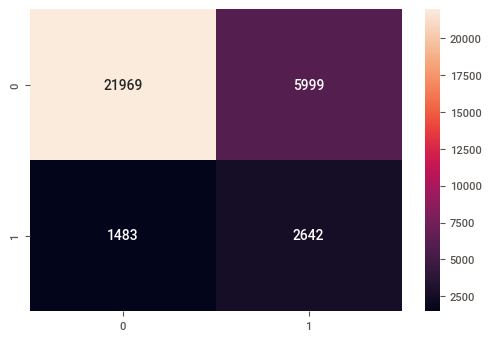

In [188]:
from sklearn.metrics import confusion_matrix
print(confusion_matrix(y_test,pred6))
sns.heatmap(confusion_matrix(y_test,pred6),annot=True, fmt="d")

Model Validation ==>

Accuracy Score of XGBOOST Model::
0.7668650484529337


<Figure size 600x400 with 0 Axes>

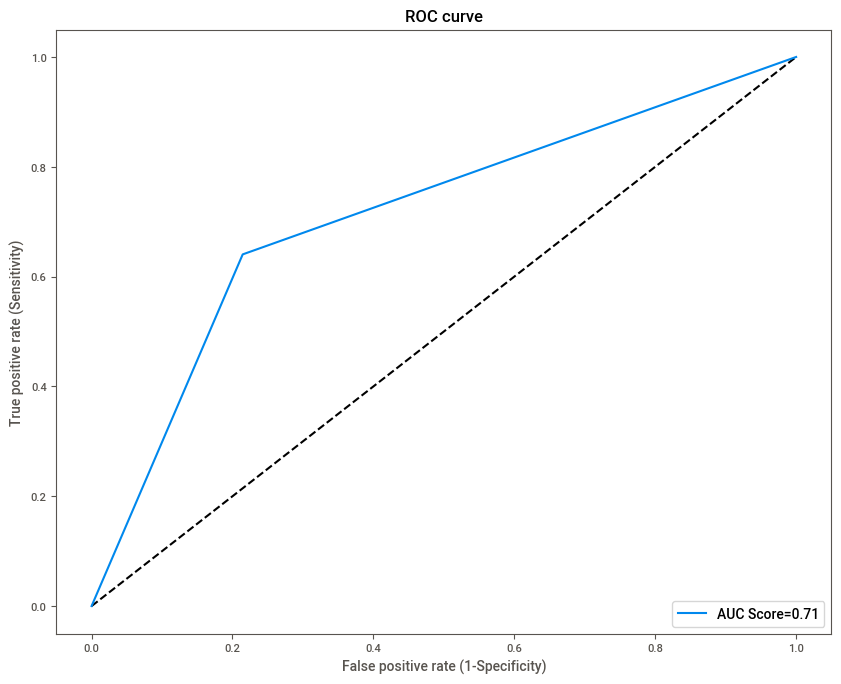

In [189]:
plt.figure(dpi=100)
from sklearn.metrics import roc_curve
print("Model Validation ==>\n")
print("Accuracy Score of XGBOOST Model::")
print(metrics.accuracy_score(y_test,pred6))
y_pred_proba = xgb1.predict(X_test)
fpr, tpr, thresholds = roc_curve(y_test, pred6)
roc_auc_xgb=metrics.auc(fpr,tpr)
plt.figure(figsize=(10,8))
plt.plot([0,1],[0,1],'k--')
plt.plot(fpr,tpr, label='AUC Score=%0.2f'%roc_auc_xgb)
plt.xlabel('False positive rate (1-Specificity)')
plt.ylabel('True positive rate (Sensitivity)')
plt.title('ROC curve')
plt.legend(loc="lower right")
#plt.grid(True)
plt.show()

### SHAP VALUES WITH RANDOM FOREST CLASSIFIER

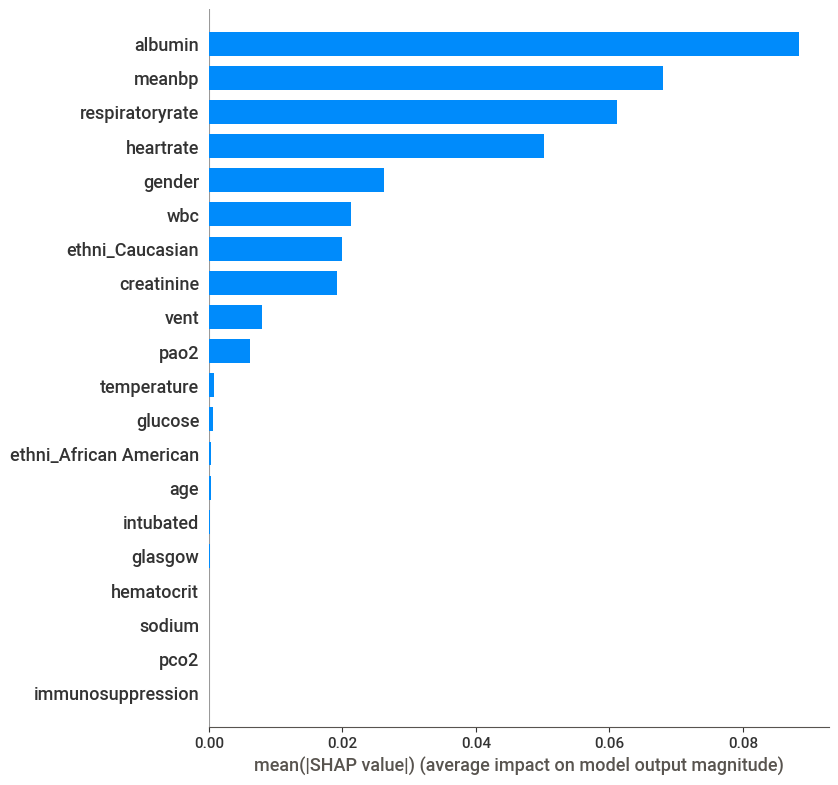

In [193]:
import shap
explainer=shap.TreeExplainer(rf_clf)
shap_values=explainer.shap_values(X_test, check_additivity=False)

shap.summary_plot(shap_values[1], X_test, plot_type='bar')

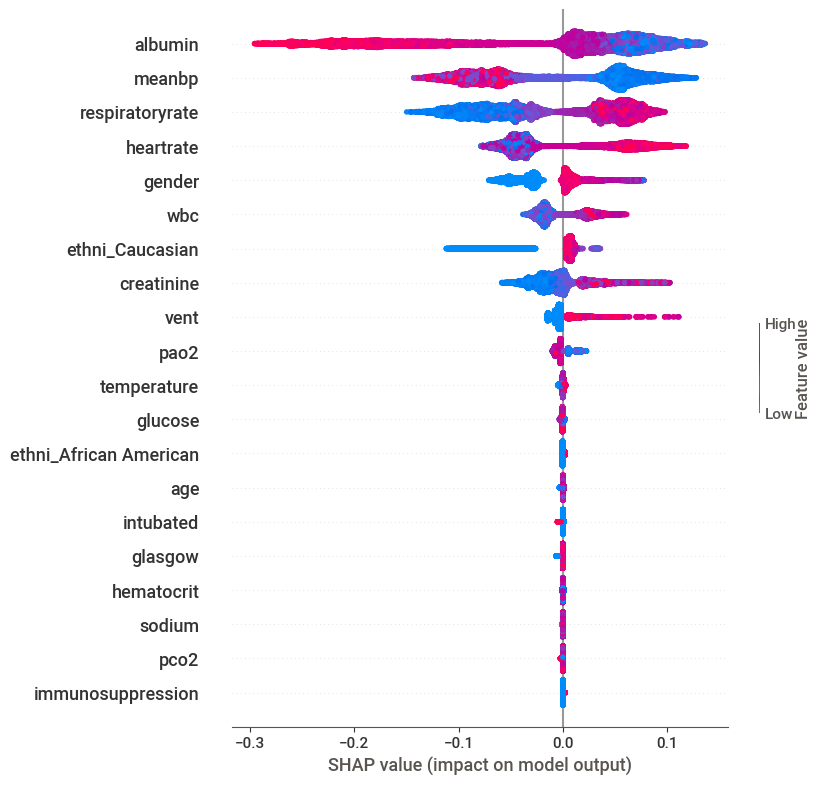

In [194]:
shap.summary_plot(shap_values[1], X_test)

In [195]:
def patient_analysis(model, patient):
    explainer=shap.TreeExplainer(model)
    shap_values=explainer.shap_values(patient)
    shap.initjs()
    return shap.force_plot(explainer.expected_value[1], 
                          shap_values[1], patient)

In [196]:
patients = X_test.iloc[3,:].astype(float)
patients_target = y_test.iloc[3:4]
print('Target : ',int(patients_target))
patient_analysis(ds_clf, patients)

Target :  0


In [197]:
patients = X_test.iloc[33,:].astype(float)
patients_target = y_test.iloc[33:34]
print('Target : ',int(patients_target))
patient_analysis(ds_clf, patients)

Target :  0


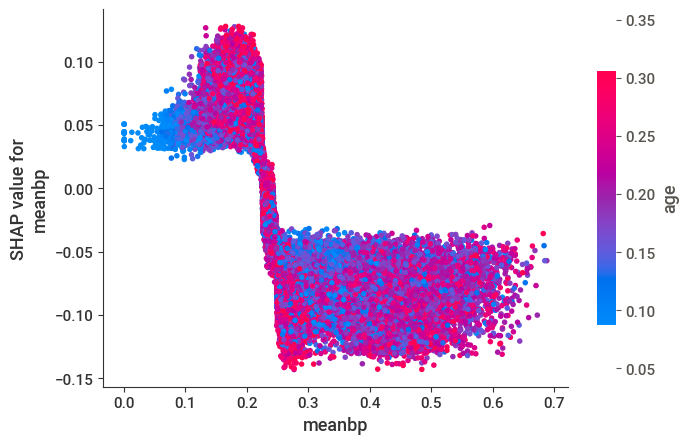

In [198]:
# dependence plot
shap.dependence_plot('meanbp', shap_values[1],
                     X_test, interaction_index = "age")

In [199]:
shap_values = explainer.shap_values(X_train.iloc[:50],check_additivity=False)
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[1], X_test.iloc[:50])

<AxesSubplot:>

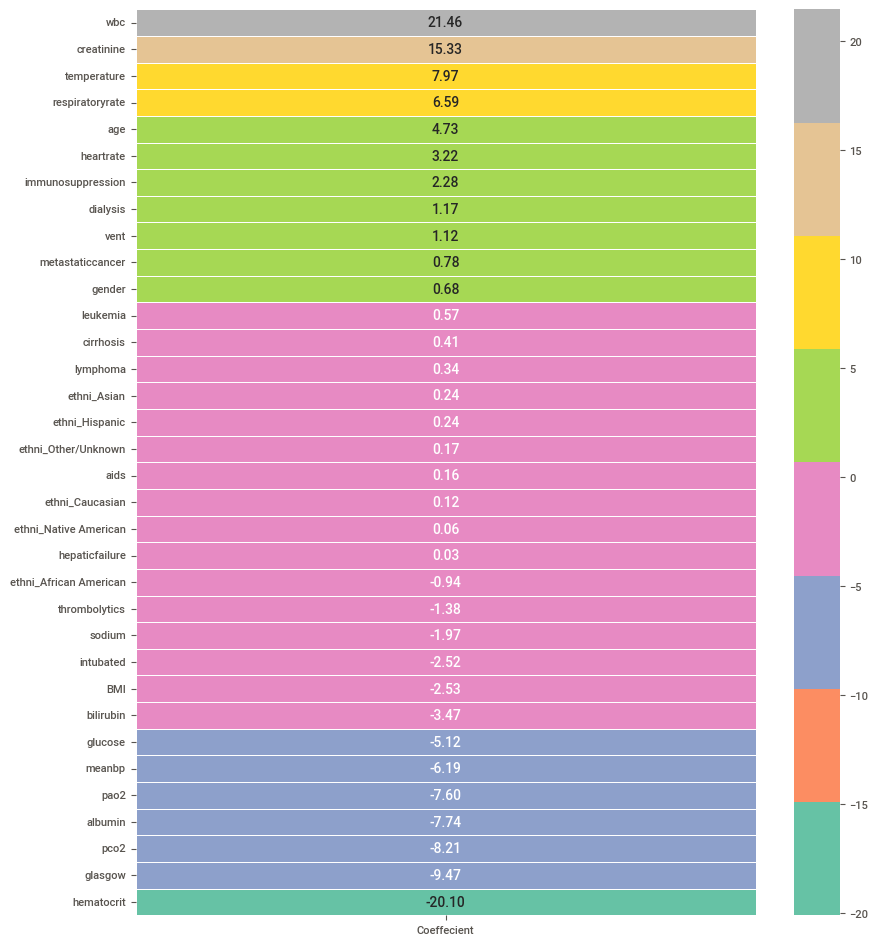

In [200]:
plt.figure(figsize=(10,12))
coeffecients = pd.DataFrame(logre.coef_.ravel(),X.columns)
coeffecients.columns = ['Coeffecient']
coeffecients.sort_values(by=['Coeffecient'],inplace=True,ascending=False)
sns.heatmap(coeffecients,annot=True,fmt='.2f',cmap='Set2',linewidths=0.5)

According to this model the major features contributing in precision of predicting model are shown in the heatmap in Ascending order.

# The Bias and Fairness Audit Toolkit for Machine Learning

### Evaluating Potential Model Biases with Aequitas Toolkit (Decision Tree)

Doc : https://dssg.github.io/aequitas/

Article on Model Fairness and transparency : https://medium.com/sfu-cspmp/model-transparency-fairness-552a747b444

Using the gender and race fields, we will prepare the data for the Aequitas Toolkit.

In [201]:
## Aequitas
from aequitas.preprocessing import preprocess_input_df
from aequitas.group import Group
from aequitas.plotting import Plot
from aequitas.bias import Bias
from aequitas.fairness import Fairness

###### Add Binary Prediction to Test Dataframe

In [202]:
data.sample()

,intubated,vent,dialysis,wbc,temperature,respiratoryrate,heartrate,sodium,meanbp,hematocrit,creatinine,albumin,pao2,pco2,glucose,bilirubin,glasgow,gender,age,thrombolytics,aids,hepaticfailure,lymphoma,metastaticcancer,leukemia,immunosuppression,cirrhosis,BMI,sepsis,ethni_African American,ethni_Asian,ethni_Caucasian,ethni_Hispanic,ethni_Native American,ethni_Other/Unknown
23476,0,0,0,10.9,36.9,34.0,103.0,140.0,127.0,50.1,0.91,3.0,64.1,76.3,106.0,0.8,15.0,0.0,37.0,0,0,0,0,0,0,0,0,588093.23,0,1,0,0,0,0,0


In [212]:
# Prediction
y_pred_rf = rf_clf.predict(X_test)
actual = []
rf_prediction = []

In [213]:
for i, j in zip(y_test, y_pred_dtree):
    actual.append(i)
    rf_prediction.append(j)

In [214]:
dic = {'label_value':actual,
       'score':rf_prediction
       }

In [215]:
result_rf  = pd.DataFrame(dic)
result_rf

,label_value,score
0,0,1
1,0,0
2,0,1
3,0,0
4,0,0
...,...,...
32088,0,0
32089,0,0
32090,0,1
32091,0,1


In [216]:
result_rf.columns

Index(['label_value', 'score'], dtype='object')

In [218]:
#AUC - Area under the ROC Curve
from sklearn.metrics import roc_auc_score
auc_dtree=roc_auc_score(result_rf['label_value'], 
                        result_rf['score'])
#print(f'AUC:{auc_dtree}')

In [219]:
X_test.columns

Index(['intubated', 'vent', 'dialysis', 'wbc', 'temperature',
       'respiratoryrate', 'heartrate', 'sodium', 'meanbp', 'hematocrit',
       'creatinine', 'albumin', 'pao2', 'pco2', 'glucose', 'bilirubin',
       'glasgow', 'gender', 'age', 'thrombolytics', 'aids', 'hepaticfailure',
       'lymphoma', 'metastaticcancer', 'leukemia', 'immunosuppression',
       'cirrhosis', 'BMI', 'ethni_African American', 'ethni_Asian',
       'ethni_Caucasian', 'ethni_Hispanic', 'ethni_Native American',
       'ethni_Other/Unknown'],
      dtype='object')

In [220]:
#
aq_df=pd.concat([X_test,result_dtree], axis=1)
aq_df.head()

,intubated,vent,dialysis,wbc,temperature,respiratoryrate,heartrate,sodium,meanbp,hematocrit,creatinine,albumin,pao2,pco2,glucose,bilirubin,glasgow,gender,age,thrombolytics,aids,hepaticfailure,lymphoma,metastaticcancer,leukemia,immunosuppression,cirrhosis,BMI,ethni_African American,ethni_Asian,ethni_Caucasian,ethni_Hispanic,ethni_Native American,ethni_Other/Unknown,label_value,score
0,0.003189,0.003189,0.0,0.061876,0.109399,0.153095,0.436957,0.424200,0.149905,0.085159,0.024240,0.007336,0.267597,0.095684,0.641084,0.001595,0.022326,0.003189,0.248779,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.073071,0.000000,0.0,0.000000,0.003189,0.0,0.0,0,1
1,0.000000,0.000000,0.0,0.015827,0.105516,0.011595,0.301476,0.371047,0.426124,0.082326,0.011943,0.007247,0.372424,0.112409,0.611648,0.004983,0.023190,0.002899,0.197119,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.080500,0.002899,0.0,0.000000,0.000000,0.0,0.0,0,0
2,0.000000,0.000000,0.0,0.017789,0.130216,0.138755,0.412706,0.494536,0.199238,0.136620,0.004020,0.011135,0.390450,0.169977,0.505210,0.002833,0.053367,0.000000,0.213469,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.071156,0.000000,0.0,0.003558,0.000000,0.0,0.0,0,0
3,0.000000,0.000000,0.0,0.028437,0.143764,0.047395,0.181680,0.545040,0.256722,0.136655,0.006596,0.012122,0.470043,0.184420,0.422603,0.002714,0.059243,0.003950,0.335713,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.107863,0.000000,0.0,0.003950,0.000000,0.0,0.0,0,0
4,0.000000,0.000000,0.0,0.034402,0.124475,0.122434,0.170047,0.468984,0.435321,0.115061,0.005551,0.010514,0.390919,0.157381,0.486779,0.001997,0.051014,0.000000,0.299283,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.099274,0.000000,0.0,0.003401,0.000000,0.0,0.0,0,0


In [221]:
from aequitas.preprocessing import preprocess_input_df
ae_subset_df = aq_df[['gender', 'ethni_African American', 'ethni_Asian',
       'ethni_Caucasian', 'ethni_Hispanic', 'ethni_Native American',
       'ethni_Other/Unknown', 'score', 'label_value']]
ae_df, _ = preprocess_input_df(ae_subset_df)

In [222]:
from aequitas.group import Group
    
g = Group()
xtab, _ = g.get_crosstabs(ae_df)

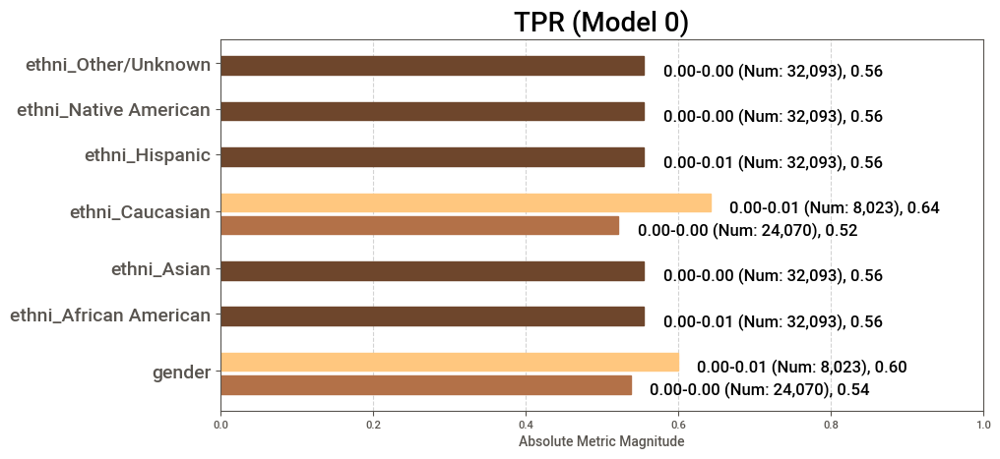

In [223]:
# 'tpr', 'fpr', 'ppr', 'pprev', 'fnr'
from aequitas.plotting import Plot
    
aqp = Plot()
fpr_plot = aqp.plot_group_metric(xtab, 'tpr')

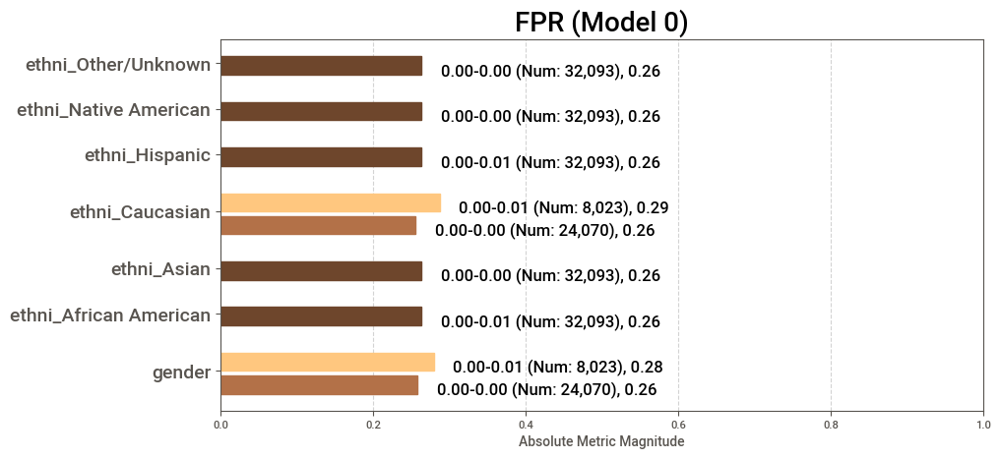

In [224]:
from aequitas.plotting import Plot
    
aqp = Plot()
fpr_plot = aqp.plot_group_metric(xtab, 'fpr')

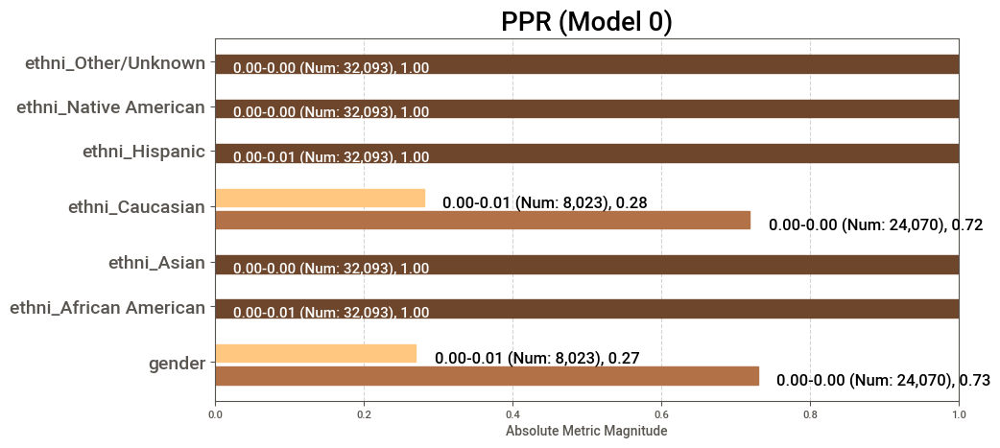

In [225]:
from aequitas.plotting import Plot
    
aqp = Plot()
fpr_plot = aqp.plot_group_metric(xtab, 'ppr')

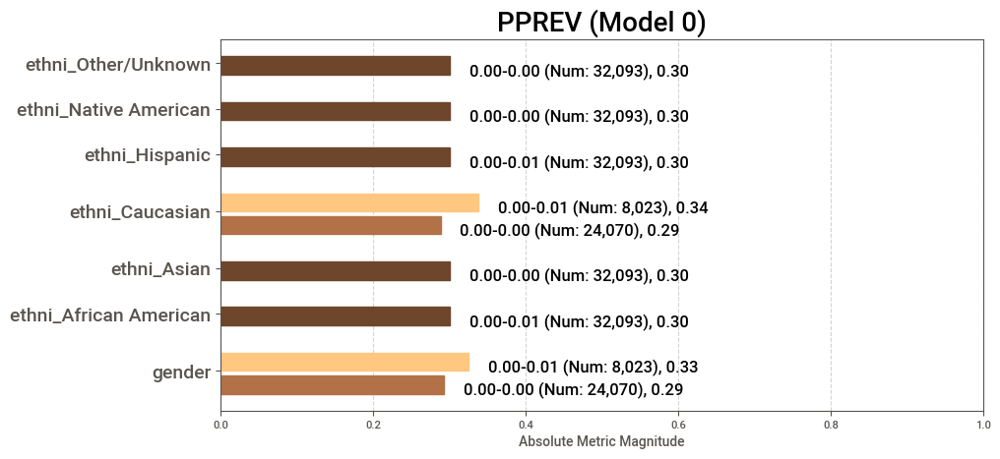

In [226]:
from aequitas.plotting import Plot
    
aqp = Plot()
fpr_plot = aqp.plot_group_metric(xtab, 'pprev')

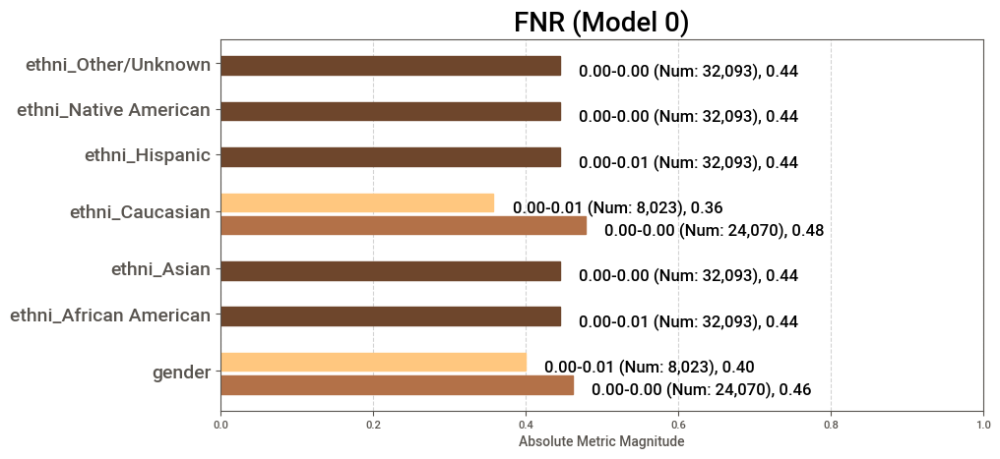

In [227]:
from aequitas.plotting import Plot
    
aqp = Plot()
fpr_plot = aqp.plot_group_metric(xtab, 'fnr')

###### Race and Gender Bias Analysis for Patient Sepsis

##### Fairness Analysis Example - Relative to a Reference Group

## Deep Learning Model (Bonus)

In [229]:
import tensorflow as tf 
import theano
from keras.models import Sequential
from keras.layers import Dense, Dropout, BatchNormalization, Flatten
from keras.utils import np_utils
#from keras.optimizers import rmsprop_v2, Adam
#from keras.layers import Activation
#from keras.layers import a
#from keras.optimizers import SGD
from tensorflow.keras import layers
#from tensorflow.keras import activations
from tensorflow.keras.optimizers import Adam

In [230]:
# X_train_sm, y_train_sm
print('Dimension Train')
print('Shape X_train_sm :',X_train_sm.shape)
print('Shape y_train_sm :',X_train_sm.shape)

Dimension Train
Shape X_train_sm : (174826, 34)
Shape y_train_sm : (174826, 34)


In [231]:
print('Dimension Test')
print('Shape y_train :',y_train.shape)
print('Shape y_test :',y_test.shape)

Dimension Test
Shape y_train : (128368,)
Shape y_test : (32093,)


###### Building ANN Model

In [233]:
model=Sequential()

# Adding the input layer and the first hidden layer
model.add(Dense(64, input_dim=X_train_sm.shape[1], activation='relu'))
model.add(Dropout(0.1))

# Adding the second hidden layer
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.1))

model.add(Dense(196, activation='relu'))
model.add(Dense(196, activation='relu'))

model.add(BatchNormalization())

model.add(Dense(256, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

model.compile(optimizer=Adam(lr=0.0005), loss='binary_crossentropy',
             metrics=['accuracy'])
print(model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 64)                2240      
                                                                 
 dropout (Dropout)           (None, 64)                0         
                                                                 
 dense_1 (Dense)             (None, 128)               8320      
                                                                 
 dropout_1 (Dropout)         (None, 128)               0         
                                                                 
 dense_2 (Dense)             (None, 196)               25284     
                                                                 
 dense_3 (Dense)             (None, 196)               38612     
                                                                 
 batch_normalization (BatchN  (None, 196)              7

2022-01-24 17:54:58.038837: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


###### Fitting the model

In [234]:
history=model.fit(X_train_sm, y_train_sm, epochs=15,
                  batch_size=128, verbose=0,
                 validation_data=(X_test, y_test))

###### Evaluating Performance using Accuracy, Loss and Confusion Matrix

In [235]:
print(history.history.keys())

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


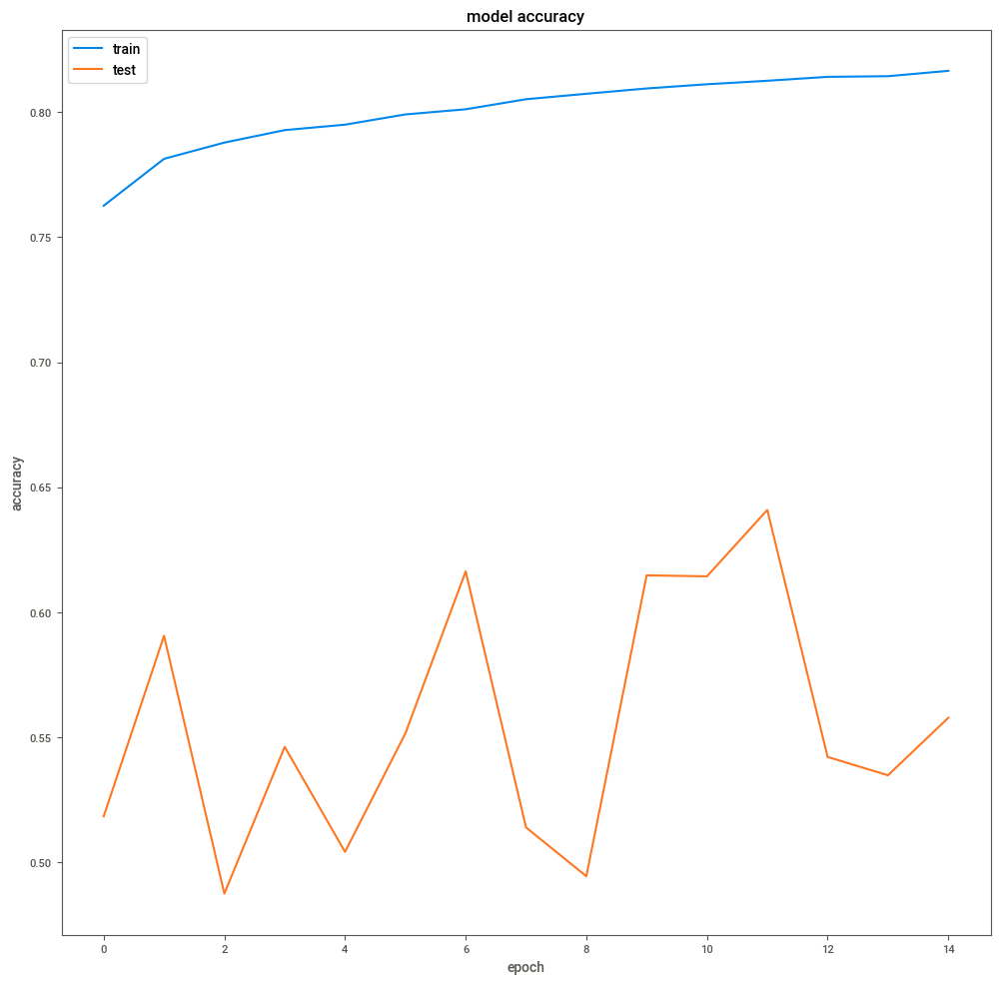

In [236]:
plt.figure(figsize=(12,12))
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train','test'], loc='upper left')
plt.show()

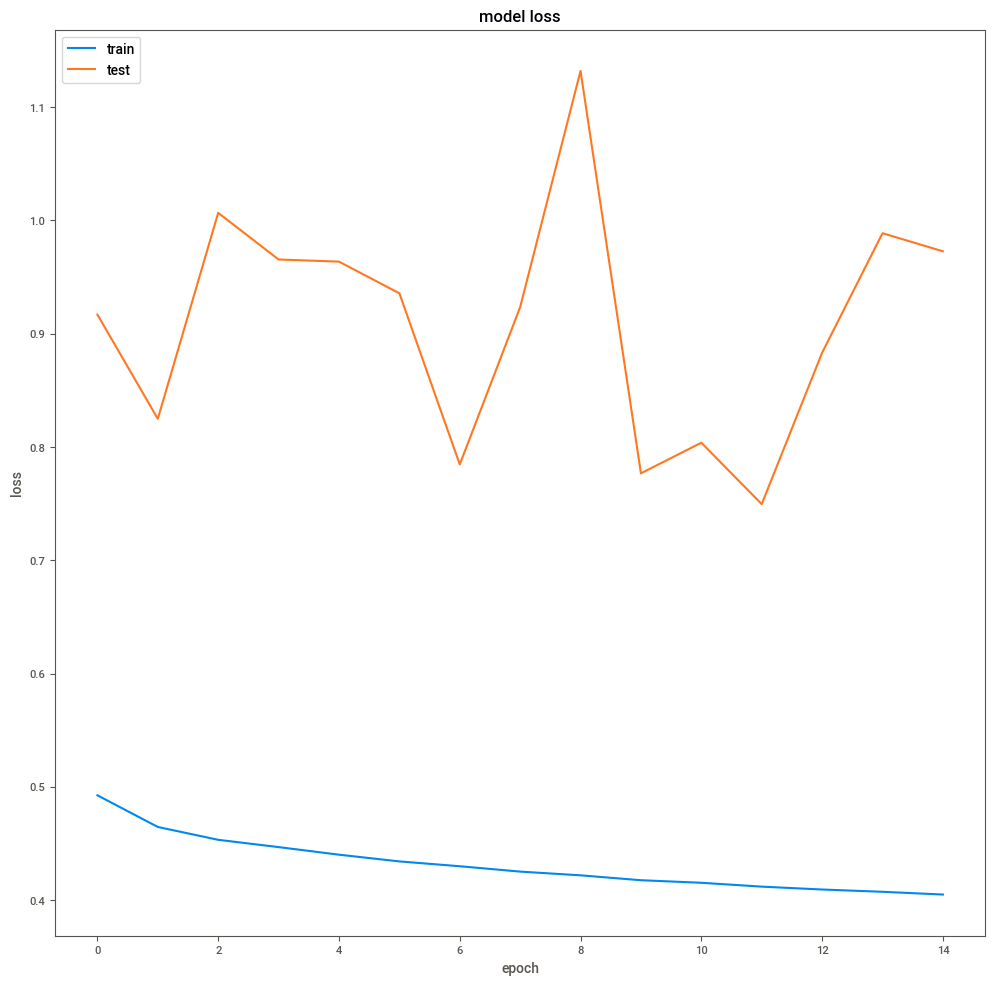

In [237]:
# summarize history for loss 
plt.figure(figsize=(12,12))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [238]:
score, acc = model.evaluate(X_train, y_train,
                            batch_size=15)

8558/8558 [==============================] - 11s 1ms/step - loss: 0.9772 - accuracy: 0.5606


In [239]:
print('Train score:', score)
print('Train accuracy:', acc)

Train score: 0.9772080183029175
Train accuracy: 0.5605836510658264


In [240]:
# # Part 3 - Making predictions and evaluating the model
from sklearn.metrics import confusion_matrix
ann_pred=model.predict(X_test)
ann_pred=(ann_pred>0.5)

In [241]:
print('*'*20)
score, acc = model.evaluate(X_test, y_test,
                            batch_size=10)

********************
3210/3210 [==============================] - 4s 1ms/step - loss: 0.9726 - accuracy: 0.5578


In [242]:
print('Test score:', score)
print('Test accuracy:', acc)

Test score: 0.9726415872573853
Test accuracy: 0.5578163266181946


<AxesSubplot:>

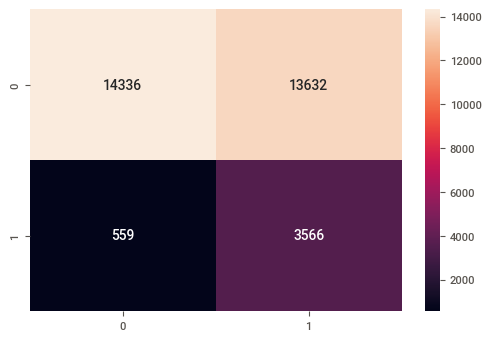

In [243]:
cnf_matrix=confusion_matrix(y_test, ann_pred)
#print(cnf_matrix)
sns.heatmap(confusion_matrix(y_test,ann_pred),annot=True, fmt="d")

In [244]:
#import classification_report
from sklearn.metrics import classification_report
print(classification_report(y_test,ann_pred))

              precision    recall  f1-score   support

           0       0.96      0.51      0.67     27968
           1       0.21      0.86      0.33      4125

    accuracy                           0.56     32093
   macro avg       0.58      0.69      0.50     32093
weighted avg       0.87      0.56      0.63     32093



Model Validation ==>

Accuracy Score of ANN Model::
0.5578163462437291


<Figure size 600x400 with 0 Axes>

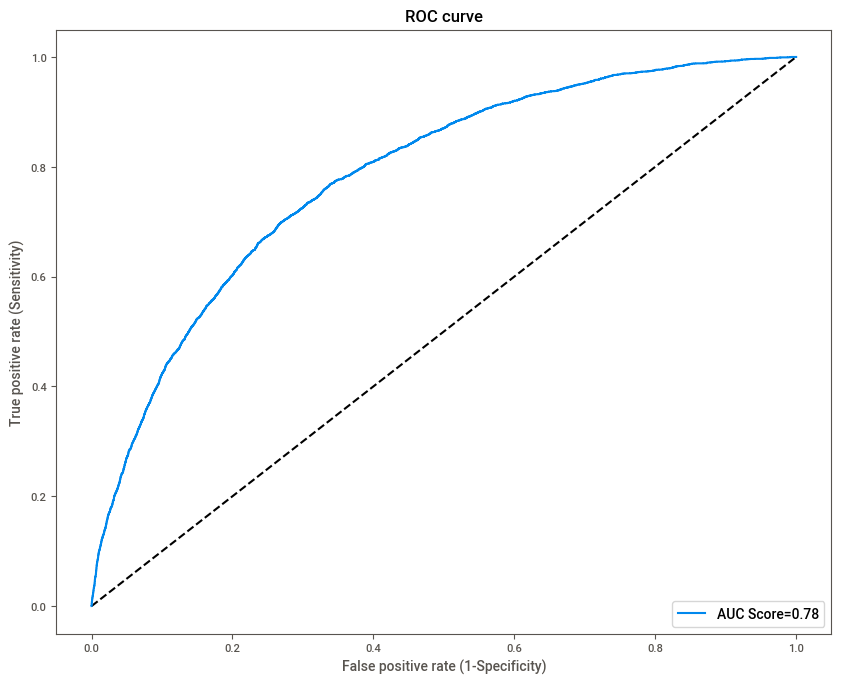

In [245]:
plt.figure(dpi=100)
from sklearn.metrics import roc_curve
print("Model Validation ==>\n")
print("Accuracy Score of ANN Model::")
print(metrics.accuracy_score(y_test,ann_pred))
y_pred_proba = model.predict(X_test)
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
roc_auc_ann=metrics.auc(fpr,tpr)
plt.figure(figsize=(10,8))
plt.plot([0,1],[0,1],'k--')
plt.plot(fpr,tpr, label='AUC Score=%0.2f'%roc_auc_ann)
plt.xlabel('False positive rate (1-Specificity)')
plt.ylabel('True positive rate (Sensitivity)')
plt.title('ROC curve')
plt.legend(loc="lower right")
#plt.grid(True)
plt.show()